# Entire Training Visualization

In [329]:
PATH="../../control_tests_n/" # Fodler with the files for training
yellow = '\033[93m'
green = '\033[92m'
red = '\033[91m'
blue = '\033[94m'
pink = '\033[95m'
black = '\033[90m'

### Bytes in flight trace

In [155]:
import csv
import matplotlib.pyplot as plt
import sys
import math

SHOW=True
MULTI_GRAPH=False
SMOOTHENING=False
ONLY_STATS=False
s_factor=0.9


PKT_SIZE = 88


'''
TODO: 
o Add functionality where you only plot flows that send more than x bytes of data
o Sort stats and graphs by flow size
o Organize plots by flow size (larger flows have larger graphs)
o Custom smoothening function
'''

fields=["time", "frame_time_rel", "tcp_time_rel", "frame_num", "frame_len", "ip_src", "src_port", "ip_dest", "dest_port", "tcp_len", "seq", "ack"]

class pkt:
    contents=[]
    def __init__(self, fields) -> None:
        self.contents=[]
        for f in fields:
            self.contents.append(f)

    def get(self, field):
        return self.contents[fields.index(field)]
        

def process_flows(cc, dir,p="y"):
    name = dir+cc+"-tcp.csv"
    with open(name) as csv_file:
        print("Reading "+name+"...")
        csv_reader = csv.reader(csv_file, delimiter=',')
        line_count = 0
        total_bytes=0
        '''
        Flow tracking:
        o Identify all packets that are either sourced from or headed to 100.64.0.2
        o Group different flows by client's port
        '''
        flows={}
        data_sent=0
        # ACK and RTX measurement
        ooa = set()
        rp = set()
        ooaCount=0
        rpCount=0
        daCount=0
        backAck=0
        for row in csv_reader:
            reTx=0
            
            ooAck=0
            dupAck=0
            retPacket=0
            
            packet=pkt(row)
            ackPkt=False
            validPkt=False
            if line_count==0:
                # reject the header
                line_count+=1
                continue
            if data_sent == 0 : 
                if "100.64.0." in packet.get("ip_src"):
                    num = int(packet.get("ip_src")[-1])
                    if num%2==0:
                        data_sent=1
                        host_port=packet.get("ip_src")
                if "100.64.0." in packet.get("ip_dest"):
                    num = int(packet.get("ip_dest")[-1])
                    if num%2==0:
                        data_sent=1
                        host_port=packet.get("ip_dest")
                if data_sent == 0:
                    continue
            if packet.get("ip_src")==host_port and packet.get("frame_time_rel")!='' and packet.get("ack")!='': 
                # we care about this ACK packet
                validPkt=True
                ackPkt=True
                port=packet.get("src_port")
                #PORTCHECK
#                 if int(port) != 50468:
#                     continue
                if port not in flows:
                    flows[port]={"OOA":[],"DA":[],"max_seq":0,"loss_bif":0,"max_ack":int(packet.get("ack")),"serverip":packet.get("ip_dest"), "serverport":packet.get("dest_port"), "act_times":[],"times":[], "windows":[], "cwnd":[], "bif":0, "last_ack":0, "last_seq":0, "pif":0, "drop":[], "next":0, "retrans":[]}
                else:
                    # check for Out of Order Ack (OOA)
                    if int(packet.get("ack")) <= int(flows[port]["max_ack"]):
                        if int(packet.get("ack")) == backAck :
                            dupAck = True
                            flows[port]["DA"].append(float(packet.get("frame_time_rel")))
                        else :
                            ooAck = True
                            flows[port]["OOA"].append(float(packet.get("frame_time_rel")))
                        backAck = int(packet.get("ack"))
                    # update max_ack
                    flows[port]["max_ack"] = max(flows[port]["max_ack"], int(packet.get("ack")))
                    if int(packet.get("seq")) < flows[port]["max_ack"]:
                        reTx += int(packet.get("tcp_len"))
#                     flows[port]["times"].append(float(packet.get("frame_time_rel")) )
                    
            elif packet.get("ip_dest")==host_port and packet.get("frame_time_rel")!='' and packet.get("seq")!='':
                #we care about this Data packet
                validPkt=True
                port=packet.get("dest_port")
                #PORTCHECK
#                 if int(port) != 50468:
#                     continue
                seq=int(packet.get("seq"))
                tcp_len=int(packet.get("tcp_len"))
                if port not in flows:
                    flows[port]={"OOA":[],"DA":[],"max_seq":int(packet.get("seq")),"loss_bif":0,"max_ack":0,"serverip":packet.get("ip_src"), "serverport":packet.get("src_port"),"act_times":[], "times":[], "windows":[], "cwnd":[], "bif":0, "last_ack":0, "last_seq":0, "pif":0, "drop":[], "next":0, "retrans":[]}
                
                else:
                    flows[port]["max_seq"] = max(flows[port]["max_seq"], int(packet.get("seq")))
                
                
                if int(packet.get("seq")) < flows[port]["max_seq"] :
                    retPacket = True
                    flows[port]["retrans"].append(flows[port]["times"][-1])
                    
            if validPkt==True:
                bif = 0
                normal_est_bif = int(flows[port]["max_seq"]) - int(flows[port]["max_ack"]) + PKT_SIZE#+ reTx
                loss_est_bif = flows[port]["loss_bif"]
                if ackPkt and dupAck and len(flows[port]["windows"]) > 10:
                    if dupAck:
                        # if we have received a duplicate ack then we need to reduce the bytes in flight by packet size
                        # we also increase max ack to correct for the consolidated ack being sent later
                        loss_est_bif = int(flows[port]["windows"][-1]) - PKT_SIZE
                        flows[port]["max_ack"] += PKT_SIZE
                        
                        bif = min( normal_est_bif, loss_est_bif)
                        if p == "y" :
                            print(green+"Duplicate Ack",int(packet.get("ack")),"Max Ack",flows[port]["max_ack"],"BIF",bif)
                        
#                     elif ooAck:
#                         # first out of order ack that we have recieved not a duplicated ack
#                         # the reason would be restransimitted packet so dont need to correct for this
                        
                elif ackPkt :
                    loss_est_bif = normal_est_bif 
                    bif = normal_est_bif    
                    if ooAck :
                        ooaCount+=1
                        if p == "y":
                            print(red+"Out of Order Ack",int(packet.get("ack")),"Max Ack",flows[port]["max_ack"],"BIF",normal_est_bif)
                        ooa.add(int(packet.get("ack")))
                    else:
                        if p == "y":
                            print(black+"Inorder Ack",int(packet.get("ack")),"Max Seq",flows[port]["max_seq"],"BIF",normal_est_bif)
                else :
                    bif = normal_est_bif
                    if retPacket==True:
                        rpCount+=1
                        rp.add(int(packet.get("seq")))
                        if p == "y":
                            print(pink+"Retransmitted Packet",int(packet.get("seq")), "Next", flows[port]["max_seq"]+PKT_SIZE, "BIF",bif)
                    else :
                        if p == "y":
                            print(blue+"Inorder Packet", int(packet.get("seq")), "Next", flows[port]["max_seq"]+PKT_SIZE, "BIF",bif)
                flows[port]["loss_bif"] = loss_est_bif
                flows[port]["windows"].append( int(bif) )
                flows[port]["times"].append( float(packet.get("frame_time_rel")) )
                
#                 if ackPkt and dupAck and len(flows[port]["windows"]) > 10: # we have received atleast the first window
# #                     if len(flows[port]["windows"]) < 2000: # print reTx in first 200 packets
# #                         print( packet.get("ack"), flows[port]["max_ack"])
#                     loss_est_bif = int(flows[port]["windows"][-1]) - PKT_SIZE
#                     flows[port]["max_ack"] += PKT_SIZE
#                     bif = min( normal_est_bif, loss_est_bif )
#                 elif ackPkt:
#                     loss_est_bif = normal_est_bif 
#                     bif = normal_est_bif
#                 else:
#                     bif = normal_est_bif
#                 flows[port]["loss_bif"] = loss_est_bif
#                 flows[port]["windows"].append( int(bif) )
            
            
            line_count+=1
            total_bytes+=int(packet.get("frame_len"))
            #print(line_count, total_bytes)
            
#         print("total bytes processed:", total_bytes/1000, "KBytes for", cc, "(unlimited)")
        if p == "y":
            print("Out of Order Acks",len(ooa),"Retransmitted Packets",len(rp))
            print("Count Out of Order Acks",ooaCount,"Retransmitted Packets",rpCount)
            print("OOA",ooa,"RP",rp)
    return flows

def custom_smooth_function():
    pass

def get_flow_stats(flows):
    num=len(flows.keys())
    print("FLOW STATISTICS: \nNumber of flows: ", num)
    print("------------------------------------------------------------------------------")
    print('%6s'%"port", '%15s'%"SrcIP", '%8s'%"SrcPort",  '%8s'%"duration",  '%8s'%"start",  '%8s'%"end", '%8s'%"Sent (B)", '%8s'%"Recv (B)",)
    for k in flows.keys():
        print('%6s'%k, '%15s'%flows[k]["serverip"], '%8s'%flows[k]["serverport"], '%8s'%str('%.2f'%(flows[k]["times"][-1]-flows[k]["times"][0])), '%8s'%str('%.2f'%flows[k]["times"][0]), '%8s'%str('%.2f'%flows[k]["times"][-1]), '%8s'%flows[k]["last_seq"], '%8s'%flows[k]["last_ack"])
        #print("    * Flow "+str(k)+": ", flows[k]["last_ack"], " ", flows[k]["last_seq"], " bytes transfered.")
    return num

def run(files):
    flows = {}
    for f in files:
        algo_cc=f
        #Get the data for all the flows
        print("==============================================================================")
        print("opening trace ../measurements/"+algo_cc+".csv...")
        flows = process_flows(algo_cc, "./Nebby/measurements-new-btl/50-200-2-60/")
        #decide on final graph layout
        num = get_flow_stats(flows)

        if ONLY_STATS:
            sys.exit()

        if num==1:
            MULTI_GRAPH=False
        #grid size
        if MULTI_GRAPH:
            size=(0,0)
            grids={1:(2,2), 2:(2,2), 4:(2,2), 6:(2,3), 9:(3,3), 12:(3,4), 15:(3,5), 16:(4,4), 20:(5,4), 24:(6,4), 30:(6,5), 36:(6,6), 40:(8,5), 42:(8,7), 49:(7,7)}
            g=num
            while g<=49 and g not in grids:
                g+=1
            if g in grids.keys():
                size=grids[g]
            else:
                size=grids[49]  
            fig, axs = plt.subplots(size[0], size[1])
            for i in range(size[0]):
                for j in range(size[1]):
                    #axs[i][j].legend(loc="lower right")
                    if i==size[0]-1:
                        axs[i][j].set_xlabel("Time (s)")
                    if j==0:
                        axs[i][j].set_ylabel("Bytes in flight")
        else:
            plt.xlabel("Time (s)")
            plt.ylabel("Bytes in flight")
        counter=0
        for port in flows.keys():
            if MULTI_GRAPH:  
                axs[counter%size[0]][(counter//size[0])%size[1]].scatter(flows[port]["times"], flows[port]["windows"], color="#858585")
                axs[counter%size[0]][(counter//size[0])%size[1]].plot(flows[port]["times"], flows[port]["windows"], label=str(port), linestyle="solid")
            else:
                plt.plot(flows[port]["times"], flows[port]["windows"], label=str(port), linestyle="solid")
                plt.scatter(flows[port]["times"], flows[port]["windows"], color="#858585")
            counter+=1
        if MULTI_GRAPH:
            counter=0
            for port in flows.keys():
                axs[counter%size[0]][(counter//size[0])%size[1]].legend()
                counter+=1
        else:
            plt.legend()
        if MULTI_GRAPH:
            fig.set_size_inches(16, 12)
        if SHOW:
            plt.show()
        else:
            plt.savefig("../logs/results/"+algo_cc+".png", dpi=600, bbox_inches='tight', pad_inches=0)
    return flows


def get_window(f,p,t=1,path=PATH):
    algo_cc = f
    flows = process_flows(algo_cc,path,p=p)
#     flows = process_flows(algo_cc, "../measurements/m/",p=p)
#     flows = process_flows(algo_cc, "./Nebby/measurements/",p=p)    
#     flows = process_flows(algo_cc, "./Nebby/measurements-new-btl/50-200-2-60/",p=p)
#     flows = process_flows(algo_cc, "./Nebby/measurements-100-150/",p=p)
    params = algo_cc.split("-")
    data = []
    time = []
    drops = []
    retrans = []
    OOA = []
    DA = []
    use_port = 0
    maxx = 0
    print("All Ports : ", flows.keys())
    for port in flows.keys():
        if len(flows[port]['windows']) > maxx:
            maxx = len(flows[port]['windows'])
            use_port = port
    print("Port",use_port)
    data = flows[use_port]['windows']
    time = flows[use_port]['times']
    retrans = flows[use_port]['retrans']
    OOA = flows[use_port]['OOA']
    DA = flows[use_port]['DA']
    if p == "y":
        plt.plot(time, data)
#     time_index = len(time)-1
#     for index in range(len(flows[use_port]['times'])-1):
#         if flows[use_port]['times'][index+1] - flows[use_port]['times'][index] > :
#             time_index = index
#     time_last = flows[use_port]['times'][time_index]
#     data = data[:time_index+1]
#     time = time[:time_index+1]
    if t==2:
        return data, time, retrans, OOA, DA
    if t==1:
        return data, time, retrans

Reading ../../control_tests_n/reno-51-0-50-200-2-aws-88-60-tcp.csv...
Inorder Ack 0 Max Seq 0 BIF 88
Inorder Packet 0 Next 88 BIF 88
Inorder Ack 1 Max Seq 0 BIF 87
Out of Order Ack 1 Max Ack 1 BIF 87
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 1 Next 89 BIF 88
Inorder Ack 2 Max Seq 1 BIF 87
Out of Order Ack 2 Max Ack 2 BIF 87
Inorder Ack 2 Max Seq 1 BIF 87
Inorder Ack 2 Max Seq 1 BIF 87
Inorder Packet 2 Next 90 BIF 88
Duplicate Ack 2 Max Ack 90 BIF 0
Inorder Packet 2 Next 90 BIF 0
Out of Order Ack 3 Max Ack 90 BIF 0
Inorder Ack 0 Max Seq 0 BIF 88
Inorder Packet 0 Next 88 BIF 88
Inorder Ack 1 Max Seq 0 BIF 87
Out of Order Ack 1 Max Ack 1 BIF 87
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 3 Next 91 BIF 1
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 245 Next 333 BIF 332
Inorder Packet 489 Next 577 BIF 576
Inorder Packet 733 Next 821 BIF 820
Inorder Packet 977 Next 1065 BIF 1064
Inorder Packet 1221 Next 1309 BIF 1308
Inorder Packet 1465 Next 1553 BIF 1552
Inorder Packet 1709 Next 1

Duplicate Ack 17813 Max Ack 21961 BIF 28636
Out of Order Ack 18057 Max Ack 21961 BIF 28636
Duplicate Ack 18057 Max Ack 22049 BIF 28548
Duplicate Ack 18057 Max Ack 22137 BIF 28460
Duplicate Ack 18057 Max Ack 22225 BIF 28372
Inorder Packet 50753 Next 50841 BIF 28616
Retransmitted Packet 18057 Next 50841 BIF 28616
Inorder Packet 50997 Next 51085 BIF 28860
Inorder Packet 51241 Next 51329 BIF 29104
Inorder Packet 51485 Next 51573 BIF 29348
Inorder Packet 51729 Next 51817 BIF 29592
Duplicate Ack 18057 Max Ack 22313 BIF 29504
Duplicate Ack 18057 Max Ack 22401 BIF 29416
Duplicate Ack 18057 Max Ack 22489 BIF 29328
Duplicate Ack 18057 Max Ack 22577 BIF 29240
Duplicate Ack 18057 Max Ack 22665 BIF 29152
Inorder Packet 51973 Next 52061 BIF 29396
Inorder Packet 52217 Next 52305 BIF 29640
Inorder Packet 52461 Next 52549 BIF 29884
Inorder Packet 52705 Next 52793 BIF 30128
Inorder Packet 52949 Next 53037 BIF 30372
Duplicate Ack 18057 Max Ack 22753 BIF 30284
Duplicate Ack 18057 Max Ack 22841 BIF 30196
D

Inorder Packet 91013 Next 91101 BIF 8604
Duplicate Ack 80765 Max Ack 82585 BIF 8516
Inorder Packet 91257 Next 91345 BIF 8760
Duplicate Ack 80765 Max Ack 82673 BIF 8672
Inorder Packet 91501 Next 91589 BIF 8916
Duplicate Ack 80765 Max Ack 82761 BIF 8828
Out of Order Ack 81009 Max Ack 82761 BIF 8828
Duplicate Ack 81009 Max Ack 82849 BIF 8740
Duplicate Ack 81009 Max Ack 82937 BIF 8652
Inorder Packet 91745 Next 91833 BIF 8896
Retransmitted Packet 81009 Next 91833 BIF 8896
Inorder Packet 91989 Next 92077 BIF 9140
Inorder Packet 92233 Next 92321 BIF 9384
Inorder Packet 92477 Next 92565 BIF 9628
Duplicate Ack 81009 Max Ack 83025 BIF 9540
Inorder Packet 92721 Next 92809 BIF 9784
Duplicate Ack 81009 Max Ack 83113 BIF 9696
Inorder Packet 92965 Next 93053 BIF 9940
Duplicate Ack 81009 Max Ack 83201 BIF 9852
Out of Order Ack 81253 Max Ack 83201 BIF 9852
Duplicate Ack 81253 Max Ack 83289 BIF 9764
Duplicate Ack 81253 Max Ack 83377 BIF 9676
Duplicate Ack 81253 Max Ack 83465 BIF 9588
Inorder Packet 9320

Inorder Packet 152013 Next 152101 BIF 4480
Inorder Packet 152257 Next 152345 BIF 4724
Inorder Packet 152501 Next 152589 BIF 4968
Inorder Packet 152745 Next 152833 BIF 5212
Inorder Packet 152989 Next 153077 BIF 5456
Inorder Ack 147865 Max Seq 152989 BIF 5212
Inorder Ack 148109 Max Seq 152989 BIF 4968
Inorder Ack 148353 Max Seq 152989 BIF 4724
Inorder Ack 148597 Max Seq 152989 BIF 4480
Inorder Ack 148841 Max Seq 152989 BIF 4236
Inorder Packet 153233 Next 153321 BIF 4480
Inorder Packet 153477 Next 153565 BIF 4724
Inorder Packet 153721 Next 153809 BIF 4968
Inorder Packet 153965 Next 154053 BIF 5212
Inorder Packet 154209 Next 154297 BIF 5456
Inorder Ack 149085 Max Seq 154209 BIF 5212
Inorder Ack 149329 Max Seq 154209 BIF 4968
Inorder Ack 149573 Max Seq 154209 BIF 4724
Inorder Ack 149817 Max Seq 154209 BIF 4480
Inorder Ack 150061 Max Seq 154209 BIF 4236
Inorder Packet 154453 Next 154541 BIF 4480
Inorder Packet 154697 Next 154785 BIF 4724
Inorder Packet 154941 Next 155029 BIF 4968
Inorder Pac

Inorder Ack 176413 Max Seq 182025 BIF 5700
Inorder Ack 176657 Max Seq 182025 BIF 5456
Inorder Ack 176901 Max Seq 182025 BIF 5212
Inorder Packet 182269 Next 182357 BIF 5456
Inorder Packet 182513 Next 182601 BIF 5700
Inorder Packet 182757 Next 182845 BIF 5944
Inorder Packet 183001 Next 183089 BIF 6188
Inorder Packet 183245 Next 183333 BIF 6432
Inorder Ack 177145 Max Seq 183245 BIF 6188
Inorder Ack 177389 Max Seq 183245 BIF 5944
Inorder Ack 177633 Max Seq 183245 BIF 5700
Inorder Ack 177877 Max Seq 183245 BIF 5456
Inorder Ack 178121 Max Seq 183245 BIF 5212
Inorder Packet 183489 Next 183577 BIF 5456
Inorder Packet 183733 Next 183821 BIF 5700
Inorder Packet 183977 Next 184065 BIF 5944
Inorder Packet 184221 Next 184309 BIF 6188
Inorder Packet 184465 Next 184553 BIF 6432
Inorder Packet 184709 Next 184797 BIF 6676
Inorder Ack 178365 Max Seq 184709 BIF 6432
Inorder Ack 178609 Max Seq 184709 BIF 6188
Inorder Ack 178853 Max Seq 184709 BIF 5944
Inorder Ack 179097 Max Seq 184709 BIF 5700
Inorder Ack

Inorder Ack 212769 Max Seq 215941 BIF 3260
Inorder Ack 213013 Max Seq 215941 BIF 3016
Inorder Packet 216185 Next 216273 BIF 3260
Inorder Packet 216429 Next 216517 BIF 3504
Inorder Packet 216673 Next 216761 BIF 3748
Inorder Packet 216917 Next 217005 BIF 3992
Inorder Packet 217161 Next 217249 BIF 4236
Inorder Packet 217405 Next 217493 BIF 4480
Inorder Ack 213257 Max Seq 217405 BIF 4236
Inorder Ack 213501 Max Seq 217405 BIF 3992
Inorder Ack 213745 Max Seq 217405 BIF 3748
Inorder Ack 213989 Max Seq 217405 BIF 3504
Inorder Ack 214233 Max Seq 217405 BIF 3260
Inorder Packet 217649 Next 217737 BIF 3504
Inorder Packet 217893 Next 217981 BIF 3748
Inorder Packet 218137 Next 218225 BIF 3992
Inorder Packet 218381 Next 218469 BIF 4236
Inorder Packet 218625 Next 218713 BIF 4480
Inorder Ack 214477 Max Seq 218625 BIF 4236
Inorder Ack 214721 Max Seq 218625 BIF 3992
Inorder Ack 214965 Max Seq 218625 BIF 3748
Inorder Ack 215209 Max Seq 218625 BIF 3504
Inorder Ack 215453 Max Seq 218625 BIF 3260
Inorder Pac

Inorder Packet 244489 Next 244577 BIF 4724
Inorder Packet 244733 Next 244821 BIF 4968
Inorder Packet 244977 Next 245065 BIF 5212
Inorder Packet 245221 Next 245309 BIF 5456
Inorder Packet 245465 Next 245553 BIF 5700
Inorder Ack 240097 Max Seq 245465 BIF 5456
Inorder Ack 240341 Max Seq 245465 BIF 5212
Inorder Ack 240585 Max Seq 245465 BIF 4968
Inorder Ack 240829 Max Seq 245465 BIF 4724
Inorder Ack 241073 Max Seq 245465 BIF 4480
Inorder Packet 245709 Next 245797 BIF 4724
Inorder Packet 245953 Next 246041 BIF 4968
Inorder Packet 246197 Next 246285 BIF 5212
Inorder Packet 246441 Next 246529 BIF 5456
Inorder Packet 246685 Next 246773 BIF 5700
Inorder Ack 241317 Max Seq 246685 BIF 5456
Inorder Ack 241561 Max Seq 246685 BIF 5212
Inorder Ack 241805 Max Seq 246685 BIF 4968
Inorder Ack 242049 Max Seq 246685 BIF 4724
Inorder Ack 242293 Max Seq 246685 BIF 4480
Inorder Packet 246929 Next 247017 BIF 4724
Inorder Packet 247173 Next 247261 BIF 4968
Inorder Packet 247417 Next 247505 BIF 5212
Inorder Pac

Inorder Packet 276453 Next 276541 BIF 6744
Inorder Packet 276697 Next 276785 BIF 6988
Retransmitted Packet 269621 Next 276785 BIF 6988
Duplicate Ack 269621 Max Ack 269885 BIF 6900
Duplicate Ack 269621 Max Ack 269973 BIF 6812
Duplicate Ack 269621 Max Ack 270061 BIF 6724
Duplicate Ack 269621 Max Ack 270149 BIF 6636
Duplicate Ack 269621 Max Ack 270237 BIF 6548
Inorder Packet 276941 Next 277029 BIF 6792
Inorder Packet 277185 Next 277273 BIF 7036
Duplicate Ack 269621 Max Ack 270325 BIF 6948
Duplicate Ack 269621 Max Ack 270413 BIF 6860
Duplicate Ack 269621 Max Ack 270501 BIF 6772
Duplicate Ack 269621 Max Ack 270589 BIF 6684
Duplicate Ack 269621 Max Ack 270677 BIF 6596
Inorder Packet 277429 Next 277517 BIF 6840
Inorder Packet 277673 Next 277761 BIF 7084
Inorder Packet 277917 Next 278005 BIF 7328
Duplicate Ack 269621 Max Ack 270765 BIF 7240
Duplicate Ack 269621 Max Ack 270853 BIF 7152
Duplicate Ack 269621 Max Ack 270941 BIF 7064
Duplicate Ack 269621 Max Ack 271029 BIF 6976
Duplicate Ack 269621

Inorder Packet 310369 Next 310457 BIF 3992
Inorder Packet 310613 Next 310701 BIF 4236
Inorder Packet 310857 Next 310945 BIF 4480
Inorder Packet 311101 Next 311189 BIF 4724
Inorder Ack 306709 Max Seq 311101 BIF 4480
Inorder Ack 306953 Max Seq 311101 BIF 4236
Inorder Ack 307197 Max Seq 311101 BIF 3992
Inorder Ack 307441 Max Seq 311101 BIF 3748
Inorder Ack 307685 Max Seq 311101 BIF 3504
Inorder Packet 311345 Next 311433 BIF 3748
Inorder Packet 311589 Next 311677 BIF 3992
Inorder Packet 311833 Next 311921 BIF 4236
Inorder Packet 312077 Next 312165 BIF 4480
Inorder Packet 312321 Next 312409 BIF 4724
Inorder Packet 312565 Next 312653 BIF 4968
Inorder Ack 307929 Max Seq 312565 BIF 4724
Inorder Ack 308173 Max Seq 312565 BIF 4480
Inorder Ack 308417 Max Seq 312565 BIF 4236
Inorder Ack 308661 Max Seq 312565 BIF 3992
Inorder Ack 308905 Max Seq 312565 BIF 3748
Inorder Packet 312809 Next 312897 BIF 3992
Inorder Packet 313053 Next 313141 BIF 4236
Inorder Packet 313297 Next 313385 BIF 4480
Inorder Pac

Inorder Ack 348677 Max Seq 354533 BIF 5944
Inorder Ack 348921 Max Seq 354533 BIF 5700
Inorder Ack 349165 Max Seq 354533 BIF 5456
Inorder Packet 354777 Next 354865 BIF 5700
Inorder Packet 355021 Next 355109 BIF 5944
Inorder Packet 355265 Next 355353 BIF 6188
Inorder Packet 355509 Next 355597 BIF 6432
Inorder Packet 355753 Next 355841 BIF 6676
Inorder Ack 349409 Max Seq 355753 BIF 6432
Inorder Ack 349653 Max Seq 355753 BIF 6188
Inorder Ack 349897 Max Seq 355753 BIF 5944
Inorder Ack 350141 Max Seq 355753 BIF 5700
Inorder Ack 350385 Max Seq 355753 BIF 5456
Inorder Packet 355997 Next 356085 BIF 5700
Inorder Packet 356241 Next 356329 BIF 5944
Inorder Packet 356485 Next 356573 BIF 6188
Inorder Packet 356729 Next 356817 BIF 6432
Inorder Packet 356973 Next 357061 BIF 6676
Inorder Ack 350629 Max Seq 356973 BIF 6432
Inorder Ack 350873 Max Seq 356973 BIF 6188
Inorder Ack 351117 Max Seq 356973 BIF 5944
Inorder Ack 351361 Max Seq 356973 BIF 5700
Inorder Ack 351605 Max Seq 356973 BIF 5456
Inorder Pac

Inorder Packet 385765 Next 385853 BIF 4236
Inorder Ack 381861 Max Seq 385765 BIF 3992
Inorder Ack 382105 Max Seq 385765 BIF 3748
Inorder Ack 382349 Max Seq 385765 BIF 3504
Inorder Ack 382593 Max Seq 385765 BIF 3260
Inorder Ack 382837 Max Seq 385765 BIF 3016
Inorder Packet 386009 Next 386097 BIF 3260
Inorder Packet 386253 Next 386341 BIF 3504
Inorder Packet 386497 Next 386585 BIF 3748
Inorder Packet 386741 Next 386829 BIF 3992
Inorder Packet 386985 Next 387073 BIF 4236
Inorder Packet 387229 Next 387317 BIF 4480
Inorder Ack 383081 Max Seq 387229 BIF 4236
Inorder Ack 383325 Max Seq 387229 BIF 3992
Inorder Ack 383569 Max Seq 387229 BIF 3748
Inorder Ack 383813 Max Seq 387229 BIF 3504
Inorder Ack 384057 Max Seq 387229 BIF 3260
Inorder Packet 387473 Next 387561 BIF 3504
Inorder Packet 387717 Next 387805 BIF 3748
Inorder Packet 387961 Next 388049 BIF 3992
Inorder Packet 388205 Next 388293 BIF 4236
Inorder Packet 388449 Next 388537 BIF 4480
Inorder Ack 384301 Max Seq 388449 BIF 4236
Inorder Ack

Inorder Ack 460429 Max Seq 463845 BIF 3504
Inorder Ack 460673 Max Seq 463845 BIF 3260
Inorder Ack 460917 Max Seq 463845 BIF 3016
Inorder Ack 461161 Max Seq 463845 BIF 2772
Inorder Ack 461405 Max Seq 463845 BIF 2528
Inorder Packet 464089 Next 464177 BIF 2772
Inorder Packet 464333 Next 464421 BIF 3016
Inorder Packet 464577 Next 464665 BIF 3260
Inorder Packet 464821 Next 464909 BIF 3504
Inorder Packet 465065 Next 465153 BIF 3748
Inorder Packet 465309 Next 465397 BIF 3992
Inorder Ack 461649 Max Seq 465309 BIF 3748
Inorder Ack 461893 Max Seq 465309 BIF 3504
Inorder Ack 462137 Max Seq 465309 BIF 3260
Inorder Ack 462381 Max Seq 465309 BIF 3016
Inorder Ack 462625 Max Seq 465309 BIF 2772
Inorder Packet 465553 Next 465641 BIF 3016
Inorder Packet 465797 Next 465885 BIF 3260
Inorder Packet 466041 Next 466129 BIF 3504
Inorder Packet 466285 Next 466373 BIF 3748
Inorder Packet 466529 Next 466617 BIF 3992
Inorder Ack 462869 Max Seq 466529 BIF 3748
Inorder Ack 463113 Max Seq 466529 BIF 3504
Inorder Ack

Inorder Ack 498005 Max Seq 503373 BIF 5456
Inorder Ack 498493 Max Seq 503373 BIF 4968
Inorder Ack 498981 Max Seq 503373 BIF 4480
Inorder Packet 503617 Next 503705 BIF 4724
Inorder Packet 503861 Next 503949 BIF 4968
Inorder Packet 504105 Next 504193 BIF 5212
Inorder Packet 504349 Next 504437 BIF 5456
Inorder Packet 504593 Next 504681 BIF 5700
Inorder Ack 499225 Max Seq 504593 BIF 5456
Inorder Ack 499713 Max Seq 504593 BIF 4968
Inorder Ack 500201 Max Seq 504593 BIF 4480
Inorder Packet 504837 Next 504925 BIF 4724
Inorder Packet 505081 Next 505169 BIF 4968
Inorder Packet 505325 Next 505413 BIF 5212
Inorder Packet 505569 Next 505657 BIF 5456
Inorder Packet 505813 Next 505901 BIF 5700
Inorder Ack 500445 Max Seq 505813 BIF 5456
Inorder Ack 500933 Max Seq 505813 BIF 4968
Inorder Ack 501421 Max Seq 505813 BIF 4480
Inorder Packet 506057 Next 506145 BIF 4724
Inorder Packet 506301 Next 506389 BIF 4968
Inorder Packet 506545 Next 506633 BIF 5212
Inorder Packet 506789 Next 506877 BIF 5456
Inorder Pac

Inorder Ack 541437 Max Seq 549733 BIF 8384
Retransmitted Packet 541437 Next 549821 BIF 8384
Retransmitted Packet 541681 Next 549821 BIF 8384
Retransmitted Packet 541925 Next 549821 BIF 8384
Retransmitted Packet 542169 Next 549821 BIF 8384
Retransmitted Packet 542413 Next 549821 BIF 8384
Retransmitted Packet 542657 Next 549821 BIF 8384
Retransmitted Packet 542901 Next 549821 BIF 8384
Retransmitted Packet 543145 Next 549821 BIF 8384
Retransmitted Packet 543389 Next 549821 BIF 8384
Retransmitted Packet 543633 Next 549821 BIF 8384
Retransmitted Packet 543877 Next 549821 BIF 8384
Retransmitted Packet 544121 Next 549821 BIF 8384
Retransmitted Packet 544365 Next 549821 BIF 8384
Retransmitted Packet 544609 Next 549821 BIF 8384
Retransmitted Packet 544853 Next 549821 BIF 8384
Inorder Ack 549977 Max Seq 549733 BIF -156
Out of Order Ack 549977 Max Ack 549977 BIF -156
Duplicate Ack 549977 Max Ack 550065 BIF -244
Duplicate Ack 549977 Max Ack 550153 BIF -332
Duplicate Ack 549977 Max Ack 550241 BIF -

Inorder Ack 595605 Max Seq 599753 BIF 4236
Inorder Ack 596093 Max Seq 599753 BIF 3748
Inorder Ack 596581 Max Seq 599753 BIF 3260
Inorder Packet 599997 Next 600085 BIF 3504
Inorder Packet 600241 Next 600329 BIF 3748
Inorder Packet 600485 Next 600573 BIF 3992
Inorder Packet 600729 Next 600817 BIF 4236
Inorder Packet 600973 Next 601061 BIF 4480
Inorder Ack 596825 Max Seq 600973 BIF 4236
Inorder Ack 597313 Max Seq 600973 BIF 3748
Inorder Ack 597801 Max Seq 600973 BIF 3260
Inorder Packet 601217 Next 601305 BIF 3504
Inorder Packet 601461 Next 601549 BIF 3748
Inorder Packet 601705 Next 601793 BIF 3992
Inorder Packet 601949 Next 602037 BIF 4236
Inorder Packet 602193 Next 602281 BIF 4480
Inorder Ack 598045 Max Seq 602193 BIF 4236
Inorder Ack 598533 Max Seq 602193 BIF 3748
Inorder Ack 599021 Max Seq 602193 BIF 3260
Inorder Packet 602437 Next 602525 BIF 3504
Inorder Packet 602681 Next 602769 BIF 3748
Inorder Packet 602925 Next 603013 BIF 3992
Inorder Packet 603169 Next 603257 BIF 4236
Inorder Pac

Inorder Packet 661485 Next 661573 BIF 6432
Inorder Packet 661729 Next 661817 BIF 6676
Inorder Packet 661973 Next 662061 BIF 6920
Inorder Ack 655385 Max Seq 661973 BIF 6676
Inorder Ack 655873 Max Seq 661973 BIF 6188
Inorder Ack 656361 Max Seq 661973 BIF 5700
Inorder Packet 662217 Next 662305 BIF 5944
Inorder Packet 662461 Next 662549 BIF 6188
Inorder Packet 662705 Next 662793 BIF 6432
Inorder Packet 662949 Next 663037 BIF 6676
Inorder Packet 663193 Next 663281 BIF 6920
Inorder Ack 656605 Max Seq 663193 BIF 6676
Inorder Ack 657093 Max Seq 663193 BIF 6188
Inorder Ack 657581 Max Seq 663193 BIF 5700
Inorder Packet 663437 Next 663525 BIF 5944
Inorder Packet 663681 Next 663769 BIF 6188
Inorder Packet 663925 Next 664013 BIF 6432
Inorder Packet 664169 Next 664257 BIF 6676
Inorder Packet 664413 Next 664501 BIF 6920
Inorder Ack 657825 Max Seq 664413 BIF 6676
Inorder Ack 658313 Max Seq 664413 BIF 6188
Out of Order Ack 658313 Max Ack 658313 BIF 6188
Duplicate Ack 658313 Max Ack 658401 BIF 6100
Dupl

Inorder Packet 757133 Next 757221 BIF 8156
Duplicate Ack 747129 Max Ack 749153 BIF 8068
Duplicate Ack 747129 Max Ack 749241 BIF 7980
Duplicate Ack 747129 Max Ack 749329 BIF 7892
Duplicate Ack 747129 Max Ack 749417 BIF 7804
Duplicate Ack 747129 Max Ack 749505 BIF 7716
Inorder Packet 757377 Next 757465 BIF 7960
Inorder Packet 757621 Next 757709 BIF 8204
Duplicate Ack 747129 Max Ack 749593 BIF 8116
Duplicate Ack 747129 Max Ack 749681 BIF 8028
Duplicate Ack 747129 Max Ack 749769 BIF 7940
Duplicate Ack 747129 Max Ack 749857 BIF 7852
Duplicate Ack 747129 Max Ack 749945 BIF 7764
Inorder Packet 757865 Next 757953 BIF 8008
Inorder Packet 758109 Next 758197 BIF 8252
Inorder Packet 758353 Next 758441 BIF 8496
Inorder Packet 758597 Next 758685 BIF 8740
Duplicate Ack 747129 Max Ack 750033 BIF 8652
Duplicate Ack 747129 Max Ack 750121 BIF 8564
Duplicate Ack 747129 Max Ack 750209 BIF 8476
Duplicate Ack 747129 Max Ack 750297 BIF 8388
Duplicate Ack 747129 Max Ack 750385 BIF 8300
Inorder Packet 758841 Ne

Inorder Packet 795929 Next 796017 BIF 2772
Inorder Packet 796173 Next 796261 BIF 3016
Inorder Packet 796417 Next 796505 BIF 3260
Inorder Packet 796661 Next 796749 BIF 3504
Inorder Ack 793733 Max Seq 796661 BIF 3016
Inorder Ack 794221 Max Seq 796661 BIF 2528
Inorder Packet 796905 Next 796993 BIF 2772
Inorder Packet 797149 Next 797237 BIF 3016
Inorder Packet 797393 Next 797481 BIF 3260
Inorder Packet 797637 Next 797725 BIF 3504
Inorder Ack 794465 Max Seq 797637 BIF 3260
Inorder Ack 794953 Max Seq 797637 BIF 2772
Inorder Ack 795441 Max Seq 797637 BIF 2284
Inorder Packet 797881 Next 797969 BIF 2528
Inorder Packet 798125 Next 798213 BIF 2772
Inorder Packet 798369 Next 798457 BIF 3016
Inorder Packet 798613 Next 798701 BIF 3260
Inorder Packet 798857 Next 798945 BIF 3504
Inorder Packet 799101 Next 799189 BIF 3748
Inorder Ack 795685 Max Seq 799101 BIF 3504
Inorder Ack 796173 Max Seq 799101 BIF 3016
Inorder Ack 796661 Max Seq 799101 BIF 2528
Inorder Packet 799345 Next 799433 BIF 2772
Inorder Pac

Inorder Packet 862785 Next 862873 BIF 6676
Inorder Ack 856441 Max Seq 862785 BIF 6432
Inorder Ack 856929 Max Seq 862785 BIF 5944
Inorder Ack 857417 Max Seq 862785 BIF 5456
Inorder Packet 863029 Next 863117 BIF 5700
Inorder Packet 863273 Next 863361 BIF 5944
Inorder Packet 863517 Next 863605 BIF 6188
Inorder Packet 863761 Next 863849 BIF 6432
Inorder Packet 864005 Next 864093 BIF 6676
Inorder Ack 857661 Max Seq 864005 BIF 6432
Inorder Ack 858149 Max Seq 864005 BIF 5944
Inorder Ack 858637 Max Seq 864005 BIF 5456
Inorder Packet 864249 Next 864337 BIF 5700
Inorder Packet 864493 Next 864581 BIF 5944
Inorder Packet 864737 Next 864825 BIF 6188
Inorder Packet 864981 Next 865069 BIF 6432
Inorder Packet 865225 Next 865313 BIF 6676
Inorder Ack 858881 Max Seq 865225 BIF 6432
Inorder Ack 859369 Max Seq 865225 BIF 5944
Inorder Ack 859857 Max Seq 865225 BIF 5456
Inorder Packet 865469 Next 865557 BIF 5700
Inorder Packet 865713 Next 865801 BIF 5944
Inorder Packet 865957 Next 866045 BIF 6188
Inorder Pac

Inorder Packet 944769 Next 944857 BIF 5944
Inorder Packet 945013 Next 945101 BIF 6188
Inorder Packet 945257 Next 945345 BIF 6432
Inorder Ack 939157 Max Seq 945257 BIF 6188
Inorder Ack 939645 Max Seq 945257 BIF 5700
Inorder Ack 940133 Max Seq 945257 BIF 5212
Inorder Packet 945501 Next 945589 BIF 5456
Inorder Packet 945745 Next 945833 BIF 5700
Inorder Packet 945989 Next 946077 BIF 5944
Inorder Packet 946233 Next 946321 BIF 6188
Inorder Packet 946477 Next 946565 BIF 6432
Inorder Ack 940377 Max Seq 946477 BIF 6188
Inorder Ack 940865 Max Seq 946477 BIF 5700
Inorder Ack 941353 Max Seq 946477 BIF 5212
Inorder Packet 946721 Next 946809 BIF 5456
Inorder Packet 946965 Next 947053 BIF 5700
Inorder Packet 947209 Next 947297 BIF 5944
Inorder Packet 947453 Next 947541 BIF 6188
Inorder Packet 947697 Next 947785 BIF 6432
Inorder Ack 941597 Max Seq 947697 BIF 6188
Inorder Ack 942085 Max Seq 947697 BIF 5700
Inorder Ack 942573 Max Seq 947697 BIF 5212
Inorder Packet 947941 Next 948029 BIF 5456
Inorder Pac

Inorder Packet 981613 Next 981701 BIF 3748
Inorder Packet 981857 Next 981945 BIF 3992
Inorder Packet 982101 Next 982189 BIF 4236
Inorder Ack 978197 Max Seq 982101 BIF 3992
Out of Order Ack 978197 Max Ack 978197 BIF 3992
Duplicate Ack 978197 Max Ack 978285 BIF 3904
Duplicate Ack 978197 Max Ack 978373 BIF 3816
Inorder Packet 982345 Next 982433 BIF 4060
Inorder Packet 982589 Next 982677 BIF 4304
Inorder Packet 982833 Next 982921 BIF 4548
Inorder Packet 983077 Next 983165 BIF 4792
Retransmitted Packet 978197 Next 983165 BIF 4792
Duplicate Ack 978197 Max Ack 978461 BIF 4704
Duplicate Ack 978197 Max Ack 978549 BIF 4616
Duplicate Ack 978197 Max Ack 978637 BIF 4528
Duplicate Ack 978197 Max Ack 978725 BIF 4440
Duplicate Ack 978197 Max Ack 978813 BIF 4352
Inorder Packet 983321 Next 983409 BIF 4596
Inorder Packet 983565 Next 983653 BIF 4840
Duplicate Ack 978197 Max Ack 978901 BIF 4752
Duplicate Ack 978197 Max Ack 978989 BIF 4664
Duplicate Ack 978197 Max Ack 979077 BIF 4576
Duplicate Ack 978197 Ma

Inorder Packet 1075309 Next 1075397 BIF 5456
Inorder Packet 1075553 Next 1075641 BIF 5700
Inorder Packet 1075797 Next 1075885 BIF 5944
Inorder Packet 1076041 Next 1076129 BIF 6188
Inorder Packet 1076285 Next 1076373 BIF 6432
Inorder Packet 1076529 Next 1076617 BIF 6676
Inorder Ack 1070185 Max Seq 1076529 BIF 6432
Inorder Ack 1070673 Max Seq 1076529 BIF 5944
Inorder Ack 1071161 Max Seq 1076529 BIF 5456
Inorder Packet 1076773 Next 1076861 BIF 5700
Inorder Packet 1077017 Next 1077105 BIF 5944
Inorder Packet 1077261 Next 1077349 BIF 6188
Inorder Packet 1077505 Next 1077593 BIF 6432
Inorder Packet 1077749 Next 1077837 BIF 6676
Inorder Ack 1071405 Max Seq 1077749 BIF 6432
Inorder Ack 1071893 Max Seq 1077749 BIF 5944
Inorder Ack 1072381 Max Seq 1077749 BIF 5456
Inorder Packet 1077993 Next 1078081 BIF 5700
Inorder Packet 1078237 Next 1078325 BIF 5944
Inorder Packet 1078481 Next 1078569 BIF 6188
Inorder Packet 1078725 Next 1078813 BIF 6432
Inorder Packet 1078969 Next 1079057 BIF 6676
Inorder Ac

Inorder Packet 1170957 Next 1171045 BIF 6188
Inorder Ack 1165101 Max Seq 1170957 BIF 5944
Inorder Ack 1165589 Max Seq 1170957 BIF 5456
Inorder Ack 1166077 Max Seq 1170957 BIF 4968
Inorder Ack 1166321 Max Seq 1170957 BIF 4724
Inorder Ack 1166809 Max Seq 1170957 BIF 4236
Inorder Ack 1167297 Max Seq 1170957 BIF 3748
Inorder Ack 1167541 Max Seq 1170957 BIF 3504
Inorder Ack 1168029 Max Seq 1170957 BIF 3016
Inorder Ack 1168517 Max Seq 1170957 BIF 2528
Inorder Ack 1168761 Max Seq 1170957 BIF 2284
Inorder Ack 1169249 Max Seq 1170957 BIF 1796
Inorder Ack 1169737 Max Seq 1170957 BIF 1308
Inorder Ack 1169981 Max Seq 1170957 BIF 1064
Inorder Ack 1170469 Max Seq 1170957 BIF 576
Inorder Ack 1170957 Max Seq 1170957 BIF 88
Inorder Ack 1171202 Max Seq 1170957 BIF -157
Out of Order Ack 6 Max Ack 90 BIF 3
Duplicate Ack 6 Max Ack 178 BIF -85
Duplicate Ack 6 Max Ack 266 BIF -173
Duplicate Ack 6 Max Ack 354 BIF -261
Duplicate Ack 6 Max Ack 442 BIF -349
Duplicate Ack 6 Max Ack 530 BIF -437
Inorder Packet 6 N

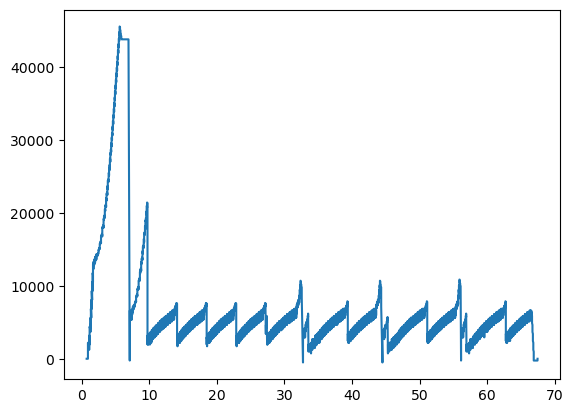

In [156]:
data, time, retrans = get_window("reno-51-0-50-200-2-aws-88-60",p="y",t=1)

Reading ../../control_tests_n/cubic-51-0-50-200-2-aws-88-60-tcp.csv...
Inorder Ack 0 Max Seq 0 BIF 88
Inorder Packet 0 Next 88 BIF 88
Inorder Ack 1 Max Seq 0 BIF 87
Out of Order Ack 1 Max Ack 1 BIF 87
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 1 Next 89 BIF 88
Inorder Ack 2 Max Seq 1 BIF 87
Out of Order Ack 2 Max Ack 2 BIF 87
Inorder Ack 2 Max Seq 1 BIF 87
Inorder Ack 2 Max Seq 1 BIF 87
Inorder Packet 2 Next 90 BIF 88
Duplicate Ack 2 Max Ack 90 BIF 0
Inorder Packet 2 Next 90 BIF 0
Out of Order Ack 3 Max Ack 90 BIF 0
Inorder Ack 0 Max Seq 0 BIF 88
Inorder Packet 0 Next 88 BIF 88
Inorder Ack 1 Max Seq 0 BIF 87
Out of Order Ack 1 Max Ack 1 BIF 87
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 3 Next 91 BIF 1
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 245 Next 333 BIF 332
Inorder Packet 489 Next 577 BIF 576
Inorder Packet 733 Next 821 BIF 820
Inorder Packet 977 Next 1065 BIF 1064
Inorder Packet 1221 Next 1309 BIF 1308
Inorder Packet 1465 Next 1553 BIF 1552
Inorder Packet 1709 Next 

Inorder Packet 72225 Next 72313 BIF 42960
Inorder Packet 72469 Next 72557 BIF 43204
Duplicate Ack 16349 Max Ack 29441 BIF 43116
Duplicate Ack 16349 Max Ack 29529 BIF 43028
Duplicate Ack 16349 Max Ack 29617 BIF 42940
Duplicate Ack 16349 Max Ack 29705 BIF 42852
Duplicate Ack 16349 Max Ack 29793 BIF 42764
Inorder Packet 72713 Next 72801 BIF 43008
Inorder Packet 72957 Next 73045 BIF 43252
Inorder Packet 73201 Next 73289 BIF 43496
Inorder Packet 73445 Next 73533 BIF 43740
Inorder Packet 73689 Next 73777 BIF 43984
Duplicate Ack 16349 Max Ack 29881 BIF 43896
Duplicate Ack 16349 Max Ack 29969 BIF 43808
Duplicate Ack 16349 Max Ack 30057 BIF 43720
Duplicate Ack 16349 Max Ack 30145 BIF 43632
Duplicate Ack 16349 Max Ack 30233 BIF 43544
Inorder Packet 73933 Next 74021 BIF 43788
Inorder Packet 74177 Next 74265 BIF 44032
Inorder Packet 74421 Next 74509 BIF 44276
Inorder Packet 74665 Next 74753 BIF 44520
Inorder Packet 74909 Next 74997 BIF 44764
Out of Order Ack 17813 Max Ack 30233 BIF 44764
Duplicate

Inorder Packet 152989 Next 153077 BIF 5700
Inorder Packet 153233 Next 153321 BIF 5944
Inorder Ack 147621 Max Seq 153233 BIF 5700
Inorder Ack 147865 Max Seq 153233 BIF 5456
Inorder Ack 148109 Max Seq 153233 BIF 5212
Inorder Ack 148353 Max Seq 153233 BIF 4968
Inorder Ack 148597 Max Seq 153233 BIF 4724
Inorder Packet 153477 Next 153565 BIF 4968
Inorder Packet 153721 Next 153809 BIF 5212
Inorder Packet 153965 Next 154053 BIF 5456
Inorder Packet 154209 Next 154297 BIF 5700
Inorder Packet 154453 Next 154541 BIF 5944
Inorder Ack 148841 Max Seq 154453 BIF 5700
Inorder Ack 149085 Max Seq 154453 BIF 5456
Inorder Ack 149329 Max Seq 154453 BIF 5212
Inorder Ack 149573 Max Seq 154453 BIF 4968
Inorder Ack 149817 Max Seq 154453 BIF 4724
Inorder Packet 154697 Next 154785 BIF 4968
Inorder Packet 154941 Next 155029 BIF 5212
Inorder Packet 155185 Next 155273 BIF 5456
Inorder Packet 155429 Next 155517 BIF 5700
Inorder Packet 155673 Next 155761 BIF 5944
Inorder Ack 150061 Max Seq 155673 BIF 5700
Inorder Ack

Inorder Packet 283529 Next 283617 BIF 10228
Inorder Packet 283773 Next 283861 BIF 10472
Inorder Packet 284017 Next 284105 BIF 10716
Inorder Packet 284261 Next 284349 BIF 10960
Duplicate Ack 273037 Max Ack 273477 BIF 10872
Duplicate Ack 273037 Max Ack 273565 BIF 10784
Duplicate Ack 273037 Max Ack 273653 BIF 10696
Duplicate Ack 273037 Max Ack 273741 BIF 10608
Duplicate Ack 273037 Max Ack 273829 BIF 10520
Inorder Packet 284505 Next 284593 BIF 10764
Inorder Packet 284749 Next 284837 BIF 11008
Inorder Packet 284993 Next 285081 BIF 11252
Inorder Packet 285237 Next 285325 BIF 11496
Inorder Packet 285481 Next 285569 BIF 11740
Duplicate Ack 273037 Max Ack 273917 BIF 11652
Duplicate Ack 273037 Max Ack 274005 BIF 11564
Duplicate Ack 273037 Max Ack 274093 BIF 11476
Duplicate Ack 273037 Max Ack 274181 BIF 11388
Duplicate Ack 273037 Max Ack 274269 BIF 11300
Inorder Packet 285725 Next 285813 BIF 11544
Inorder Packet 285969 Next 286057 BIF 11788
Inorder Packet 286213 Next 286301 BIF 12032
Inorder Pack

Inorder Ack 398209 Max Seq 404309 BIF 6188
Inorder Ack 398453 Max Seq 404309 BIF 5944
Inorder Ack 398697 Max Seq 404309 BIF 5700
Inorder Ack 398941 Max Seq 404309 BIF 5456
Inorder Ack 399185 Max Seq 404309 BIF 5212
Inorder Ack 399429 Max Seq 404309 BIF 4968
Inorder Packet 404553 Next 404641 BIF 5212
Inorder Packet 404797 Next 404885 BIF 5456
Inorder Packet 405041 Next 405129 BIF 5700
Inorder Packet 405285 Next 405373 BIF 5944
Inorder Packet 405529 Next 405617 BIF 6188
Inorder Ack 399673 Max Seq 405529 BIF 5944
Inorder Ack 399917 Max Seq 405529 BIF 5700
Inorder Ack 400161 Max Seq 405529 BIF 5456
Inorder Ack 400405 Max Seq 405529 BIF 5212
Inorder Ack 400649 Max Seq 405529 BIF 4968
Inorder Packet 405773 Next 405861 BIF 5212
Inorder Packet 406017 Next 406105 BIF 5456
Inorder Packet 406261 Next 406349 BIF 5700
Inorder Packet 406505 Next 406593 BIF 5944
Inorder Packet 406749 Next 406837 BIF 6188
Inorder Packet 406993 Next 407081 BIF 6432
Inorder Ack 400893 Max Seq 406993 BIF 6188
Inorder Ack

Inorder Packet 542169 Next 542257 BIF 5944
Inorder Packet 542413 Next 542501 BIF 6188
Inorder Packet 542657 Next 542745 BIF 6432
Inorder Ack 536557 Max Seq 542657 BIF 6188
Inorder Ack 536801 Max Seq 542657 BIF 5944
Inorder Ack 537045 Max Seq 542657 BIF 5700
Inorder Ack 537289 Max Seq 542657 BIF 5456
Inorder Ack 537533 Max Seq 542657 BIF 5212
Inorder Packet 542901 Next 542989 BIF 5456
Inorder Packet 543145 Next 543233 BIF 5700
Inorder Packet 543389 Next 543477 BIF 5944
Inorder Packet 543633 Next 543721 BIF 6188
Inorder Packet 543877 Next 543965 BIF 6432
Inorder Ack 537777 Max Seq 543877 BIF 6188
Inorder Ack 538021 Max Seq 543877 BIF 5944
Inorder Ack 538265 Max Seq 543877 BIF 5700
Inorder Ack 538509 Max Seq 543877 BIF 5456
Inorder Ack 538753 Max Seq 543877 BIF 5212
Inorder Packet 544121 Next 544209 BIF 5456
Inorder Packet 544365 Next 544453 BIF 5700
Inorder Packet 544609 Next 544697 BIF 5944
Inorder Packet 544853 Next 544941 BIF 6188
Inorder Ack 538997 Max Seq 544853 BIF 5944
Inorder Ack

Inorder Ack 701501 Max Seq 707601 BIF 6188
Inorder Ack 701989 Max Seq 707601 BIF 5700
Inorder Ack 702477 Max Seq 707601 BIF 5212
Inorder Packet 707845 Next 707933 BIF 5456
Inorder Packet 708089 Next 708177 BIF 5700
Inorder Packet 708333 Next 708421 BIF 5944
Inorder Packet 708577 Next 708665 BIF 6188
Inorder Packet 708821 Next 708909 BIF 6432
Inorder Ack 702721 Max Seq 708821 BIF 6188
Inorder Ack 703209 Max Seq 708821 BIF 5700
Inorder Ack 703697 Max Seq 708821 BIF 5212
Inorder Packet 709065 Next 709153 BIF 5456
Inorder Packet 709309 Next 709397 BIF 5700
Inorder Packet 709553 Next 709641 BIF 5944
Inorder Packet 709797 Next 709885 BIF 6188
Inorder Packet 710041 Next 710129 BIF 6432
Inorder Ack 703941 Max Seq 710041 BIF 6188
Inorder Ack 704429 Max Seq 710041 BIF 5700
Inorder Ack 704917 Max Seq 710041 BIF 5212
Inorder Packet 710285 Next 710373 BIF 5456
Inorder Packet 710529 Next 710617 BIF 5700
Inorder Packet 710773 Next 710861 BIF 5944
Inorder Packet 711017 Next 711105 BIF 6188
Inorder Pac

Inorder Packet 866689 Next 866777 BIF 4236
Inorder Packet 866933 Next 867021 BIF 4480
Inorder Packet 867177 Next 867265 BIF 4724
Inorder Packet 867421 Next 867509 BIF 4968
Inorder Packet 867665 Next 867753 BIF 5212
Inorder Ack 862785 Max Seq 867665 BIF 4968
Inorder Ack 863273 Max Seq 867665 BIF 4480
Inorder Ack 863761 Max Seq 867665 BIF 3992
Inorder Packet 867909 Next 867997 BIF 4236
Inorder Packet 868153 Next 868241 BIF 4480
Inorder Packet 868397 Next 868485 BIF 4724
Inorder Packet 868641 Next 868729 BIF 4968
Inorder Packet 868885 Next 868973 BIF 5212
Inorder Packet 869129 Next 869217 BIF 5456
Inorder Ack 864005 Max Seq 869129 BIF 5212
Inorder Ack 864493 Max Seq 869129 BIF 4724
Inorder Ack 864981 Max Seq 869129 BIF 4236
Inorder Packet 869373 Next 869461 BIF 4480
Inorder Packet 869617 Next 869705 BIF 4724
Inorder Packet 869861 Next 869949 BIF 4968
Inorder Packet 870105 Next 870193 BIF 5212
Inorder Packet 870349 Next 870437 BIF 5456
Inorder Ack 865225 Max Seq 870349 BIF 5212
Inorder Ack

Inorder Packet 986737 Next 986825 BIF 15020
Inorder Packet 986981 Next 987069 BIF 15264
Inorder Packet 987225 Next 987313 BIF 15508
Out of Order Ack 967461 Max Ack 971805 BIF 15508
Duplicate Ack 967461 Max Ack 971893 BIF 15420
Duplicate Ack 967461 Max Ack 971981 BIF 15332
Duplicate Ack 967461 Max Ack 972069 BIF 15244
Duplicate Ack 967461 Max Ack 972157 BIF 15156
Retransmitted Packet 967461 Next 987313 BIF 15156
Inorder Packet 987469 Next 987557 BIF 15400
Inorder Packet 987713 Next 987801 BIF 15644
Inorder Packet 987957 Next 988045 BIF 15888
Inorder Packet 988201 Next 988289 BIF 16132
Inorder Packet 988445 Next 988533 BIF 16376
Duplicate Ack 967461 Max Ack 972245 BIF 16288
Duplicate Ack 967461 Max Ack 972333 BIF 16200
Duplicate Ack 967461 Max Ack 972421 BIF 16112
Duplicate Ack 967461 Max Ack 972509 BIF 16024
Duplicate Ack 967461 Max Ack 972597 BIF 15936
Inorder Packet 988689 Next 988777 BIF 16180
Inorder Packet 988933 Next 989021 BIF 16424
Inorder Packet 989177 Next 989265 BIF 16668
Ino

Inorder Packet 1121181 Next 1121269 BIF 6040
Inorder Packet 1121425 Next 1121513 BIF 6284
Inorder Packet 1121669 Next 1121757 BIF 6528
Duplicate Ack 1114349 Max Ack 1115317 BIF 6440
Duplicate Ack 1114349 Max Ack 1115405 BIF 6352
Duplicate Ack 1114349 Max Ack 1115493 BIF 6264
Duplicate Ack 1114349 Max Ack 1115581 BIF 6176
Duplicate Ack 1114349 Max Ack 1115669 BIF 6088
Inorder Packet 1121913 Next 1122001 BIF 6332
Inorder Packet 1122157 Next 1122245 BIF 6576
Inorder Packet 1122401 Next 1122489 BIF 6820
Inorder Packet 1122645 Next 1122733 BIF 7064
Duplicate Ack 1114349 Max Ack 1115757 BIF 6976
Out of Order Ack 1114593 Max Ack 1115757 BIF 6976
Duplicate Ack 1114593 Max Ack 1115845 BIF 6888
Duplicate Ack 1114593 Max Ack 1115933 BIF 6800
Retransmitted Packet 1114593 Next 1122733 BIF 6800
Inorder Packet 1122889 Next 1122977 BIF 7044
Duplicate Ack 1114593 Max Ack 1116021 BIF 6956
Duplicate Ack 1114593 Max Ack 1116109 BIF 6868
Duplicate Ack 1114593 Max Ack 1116197 BIF 6780
Inorder Packet 1123133

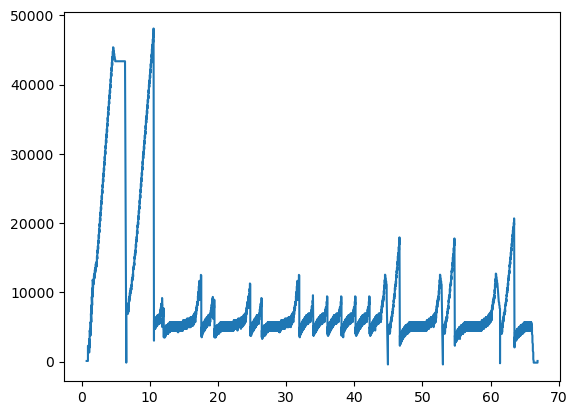

In [157]:
data, time, retrans = get_window("cubic-51-0-50-200-2-aws-88-60",p="y",t=1)

### FFT Filter and features

In [158]:
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from scipy.fft import irfft
import numpy as np
import statistics
from statistics import mean, pstdev
import pandas as pd

def smoothen(time, data, rtt):
    # Smoothening 
    left = 0
    right = 0
    run_sum = 0
    avg_data = []
    new_time = []
    roll_time = time
    roll_data = data
    while right < len(roll_time):
        while(right < len(roll_time) and (roll_time[right]-roll_time[left] < 2*rtt)):
            run_sum+=roll_data[right]
            right+=1
        new_time.append(float(roll_time[right-1]+roll_time[left])/2)
        avg_data.append(float(run_sum)/(right-left))
        run_sum-=roll_data[left]
        left+=1
    return new_time, avg_data


def get_fft(data):
    n = len(data)
    data_step = 0.005
    yf = rfft(data)
    xf = rfftfreq(n,data_step)
    return yf,xf

def get_fft_smoothening(data, time, ax,rtt,p):
    rtt=rtt
    yf, xf = get_fft(data)
    thresh  = (1/rtt)
    thresh_ind = 0
    for i in range(len(xf)) :
        freq = xf[i]
        if(freq > thresh):
            thresh_ind = i
            break
            
    yf_clean = yf
    yf_clean[thresh_ind+1:] = 0
    new_f_clean = irfft(yf_clean)
    start_len = len(time) - len(new_f_clean)

    plot_data = new_f_clean
#     if p=="y":
#         ax.plot(time[start_len:], plot_data, 'k', label='FFT smoothening', linewidth=1.5)

    plot_time = time[start_len:] 
    return plot_time, plot_data

def plot_d(ax, time, data, c, l, alpha=1):
    ax.plot(time, data, color=c, lw=2, label = l,alpha=alpha)


def plot_one_bt(f, p,t=1):
    print(f)
    fs = f.split("-")

    pre = int(fs[2])
    post = int(fs[3])
    rtt = float(((pre+post)*2))/1000
    ax = 0
    if t==1:
        data, time, retrans = get_window(f,"n",t,PATH)
    elif t==2:
        data, time, retrans, OOA, DA = get_window(f,"n",t,PATH)
    if p == 'y':
        fig, ax = plt.subplots(1,1, figsize=(15,8))
        for t in retrans :
            plt.axvline(x = t, color = 'm',alpha=0.5)
        if t == 2:
            for t in OOA :
                plt.axvline(x = t, color = 'k', lw=2)
            for t in DA:
                plt.axvline(x = t, color = 'g', lw=0.5, alpha = 0.5)
        plot_d(ax,time,data, "r","Original")
    time, data = get_fft_smoothening(data, time, ax,rtt,"y")

    #         plot_d(ax,time,data,"b","FFT Smoothened" )
#         print(len(time), len(data))
    time, data = smoothen(time, data, rtt)
#         print(len(time), len(data))
    if p == 'y':
        plot_d(ax, time, data, "b", "Smoothened",alpha=0.5)
        ax.legend()
#             plt.savefig("./plots/"+f+".png")
        plt.show()
#     return time, data, grad_time, grad_data, rtt
#     print("Black : OOA, Green : DA, Magenta : RP")
    return time, data, retrans, rtt 


def get_time_features(retrans,time,rtt):
    time_thresh = 20*rtt
    features = []
    for i in range(1, len(retrans)):
        if retrans[i]-retrans[i-1] >= time_thresh:
            features.append([retrans[i-1], retrans[i]])
    # add a feature that finished when the experiment ends
    if len(retrans) > 0  and time[-1] - retrans[-1] > 20*rtt :
        features.append([retrans[-1],time[-1]])
    return features

def get_features(time, features):
    left = 0
    right = 0
    feature_index = 0
    in_feature = 0
    index_features = []
    while right < len(time) and feature_index < len(features): 
        if in_feature == 0 and time[right]>=features[feature_index][0]:
            in_feature = 1
            left = right
        elif in_feature == 1 and time[right] > features[feature_index][1]:
            in_feature = 0
            index_features.append([left, right-1])
            feature_index+=1
        right+=1
    if in_feature == 1:
        index_features.append([left, right-1])
    return index_features

def get_plot_features(curr_file, p):
    time, data, retrans, rtt = plot_one_bt(curr_file,p=p,t=1)
    time_features = get_time_features(retrans,time,rtt)
    features = get_features(time, time_features)    
    if p == 'y':
        fig, ax = plt.subplots(1,1, figsize=(15,8))
        plot_d(ax, time, data, "b", "Smoothened")
        for ft in features : 
#             print(time[ft[1]]-time[ft[0]])
            ax.plot(time[ft[0]:ft[1]+1], data[ft[0]:ft[1]+1], color = 'r')
        plt.show()
    return time, data, features


reno-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56882', '56892'])
Port 56892


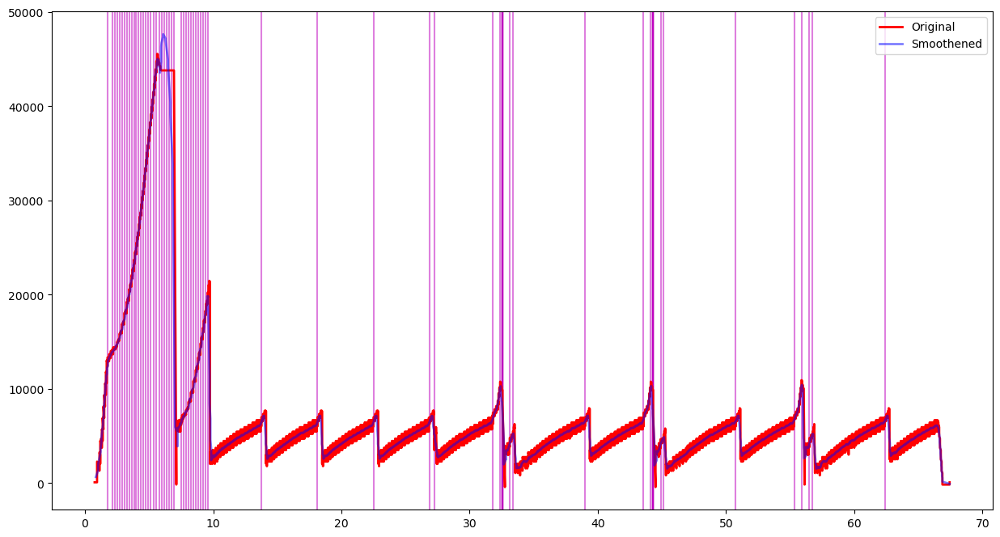

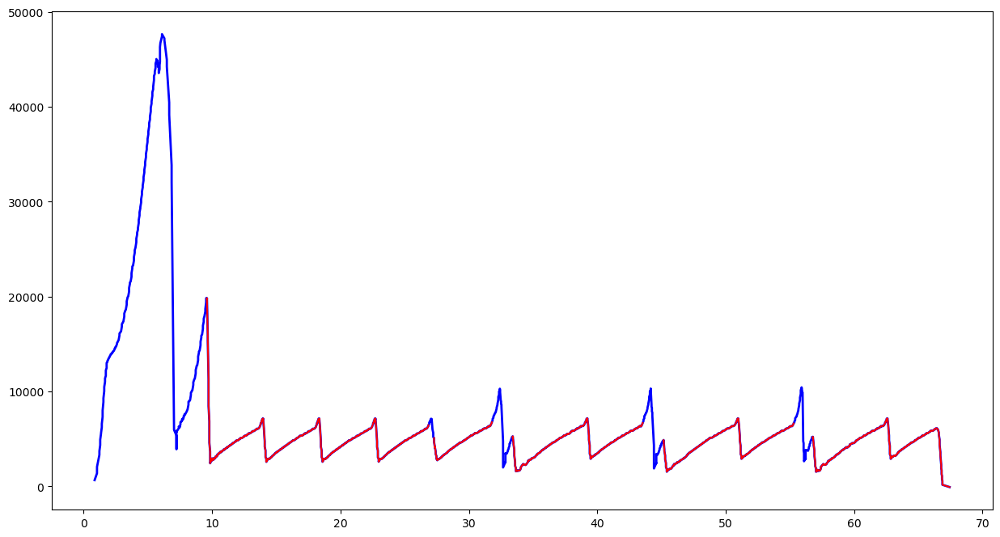

In [159]:
data, time, retrans = get_plot_features("reno-51-0-50-200-2-aws-88-60",p="y")

### Sampling from the features to reduce dimensionality

In [160]:
import bisect
def lower_bound(arr, target):
    index = bisect.bisect_left(arr, target)
    return index

def sample_data_time(time, data, ss, m):
    curr_time, curr_data = adjust(time, data)
    tp = curr_time[len(curr_time)-1] - curr_time[0]
    step = tp/m
    samp_time = [curr_time[0] + i*step for i in range(m)]
    x = np.random.uniform(0,math.pi,ss)
    tr_x = np.cos(x)
    tr_x += 1
    tr_x *= (m-1)/2
    ind = [int(round(e, 0)) for e in tr_x]
    sort_ind = sorted(ind)
    tr_time = [samp_time[i] for i in sort_ind]
    new_time = []
    new_data = []
    for t in tr_time :
        i = lower_bound(curr_time, t)
        temp_t = 0
        temp_d = 0
        if round(t,6) == round(curr_time[i],6):
            temp_t = curr_time[i]
            temp_d = curr_data[i]
        else : 
            if i == 0 :
                temp_t = curr_time[i]
                temp_d = curr_data[i]
            elif i == len(curr_time)-1 :
                temp_t = curr_time[i]
                temp_d = curr_data[i]
            else :
                temp_t = (curr_time[i-1] + curr_time[i])/2
                temp_d = (curr_data[i-1] + curr_data[i])/2
        new_time.append(temp_t)
        new_data.append(temp_d)
    new_data.insert(0,curr_data[0])
    new_data.append(curr_data[-1])
    new_time.insert(0,curr_time[0])
    new_time.append(curr_time[-1])
#     return curr_time, curr_data
    return new_time, new_data

def adjust(time, data):
    start = data.index(min(data[:int(len(data)/2)]))
    end = data.index(max(data[int(len(data)/2):]))
#     print("Difference in max and min ", end-start)
    if end - start <= 0: 
        return time, data
    new_time = time[start:end+1]
    new_data = data[start:end+1]
    return new_time, new_data

# Taking 100 as the threshold is fine 
# Now we have to see how the graphs look if we use it. 
# var = ["reno", "cubic", "bbr"]
def getRed(files,ss=125,p="y", ft_thresh=100):
    results = []
    for file in files :   
        f_split = file.split("-")
        v = f_split[0] + "-" + f_split[1]
        rtt = float((int(f_split[2]) + int(f_split[3]))*2)/1000
        bdp = float(rtt*1000*int(f_split[4])*int(f_split[5]))/8
        print(file)
        print("RTT",rtt,"BDP",bdp)
        time, data, features = get_plot_features(file, p=p)
        count = 1
        for ft in features : 
            if count > ft_thresh:
                break
            curr_time = time[ft[0]:ft[1]+1]
            curr_data = data[ft[0]:ft[1]+1]
            tr_time, tr_data = sample_data_time(curr_time, curr_data, ss, 1000)
            tr_time_pd = pd.DataFrame(tr_time)
            tr_data_pd = pd.DataFrame(tr_data)
            tr_time = list(tr_time_pd.rolling(25, center=True).mean().dropna()[0])
            tr_data = list(tr_data_pd.rolling(25, center=True).mean().dropna()[0])
            print("Feature Length ", len(tr_data))
            if p == "y" :
                plt.plot(curr_time, curr_data, c='b', alpha = 0.5, lw = 5)
                plt.plot(tr_time, tr_data, c='r', alpha = 1)
                plt.scatter(tr_time, tr_data, c='k')
#                 plt.scatter(tr_time, tr_data, c='r', s=10)
                plt.title(v)
                plt.show()
            results.append(
                {v+"_"+"data"+"_"+str(count):tr_data,
                     v+"_"+"time"+"_"+str(count):tr_time,
                        v+"_"+"rtt"+"_"+str(count):rtt, 
                             v+"_"+"bdp"+"_"+str(count):bdp})
            count+=1
    return results
# results = getRed(var)

#### ss - sample size, ft_thresh = no of features to extract

cubic-51-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41026', '41030'])
Port 41030


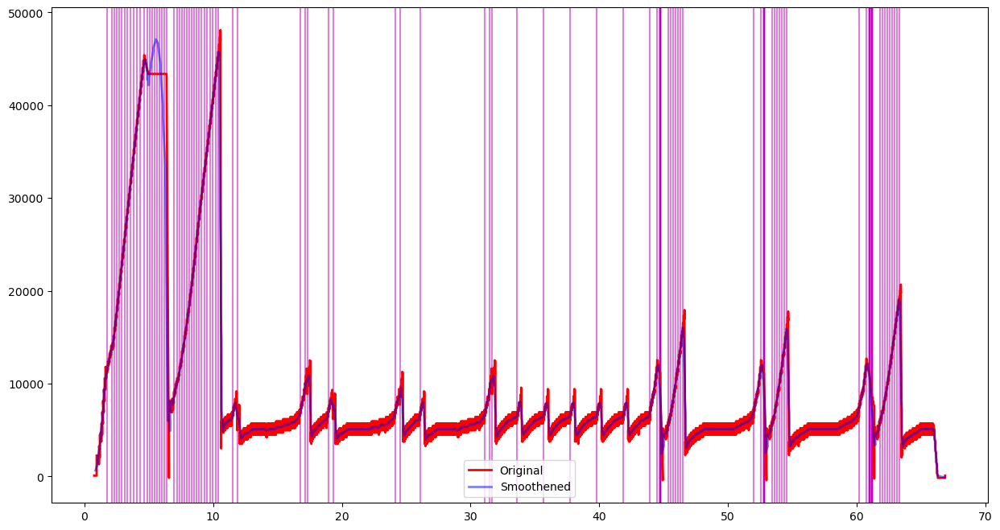

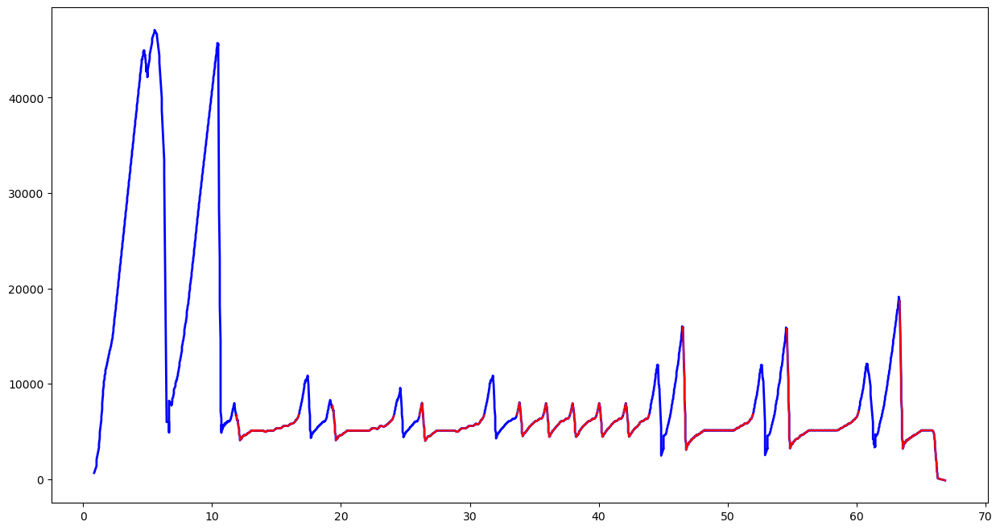

Feature Length  203


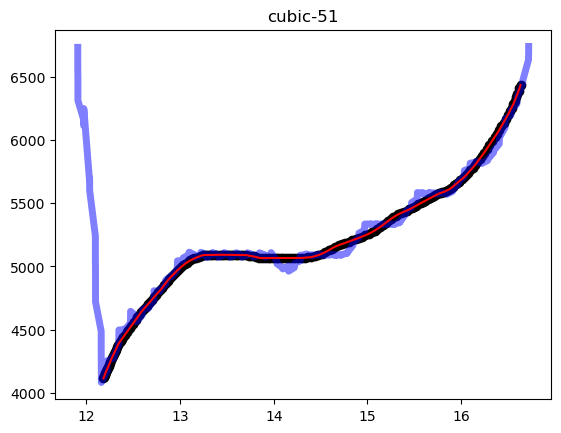

In [161]:
results = getRed(["cubic-51-0-50-200-2-aws-88-60"],ss=225,p="y",ft_thresh=1)

### Fitting polynomail to get the values, and normalizing

In [354]:
from sklearn.metrics import mean_squared_error as mse
def get_degree(time,data, p="n", max_deg=3,cc="default"):
    print("Degree to fit",max_deg)
    p_net = []
    mse_l = []
    fit_net = []
    for d in range(1,max_deg+1):
        p_temp = np.polyfit(time,data, d)
        # No need of the constant term
        p_net.append(p_temp[0:-1])
        fit_net.append(np.polyval(p_temp,time))
        mse_l.append(mse(data,fit_net[-1]))
    if p =='y':
        plt.plot(time, data,c='k',label='Truth')
        for d in range(max_deg-1, max_deg):
            plot_label = "degree"+str(d)
            plt.plot(time, fit_net[d],label="degree" + str(d+1))
        plt.legend()
        plt.show()
    return max_deg,p_net[max_deg-1], mse_l

def normalize(time, data, rtt, bdp):
    new_time = time - min(time)
    new_data = data - min(data)
    new_time = (new_time/max(new_time))*10
    new_data = (new_data/max(new_data))*10
    return new_time, new_data
    
from statistics import mean 
def get_feature_degree(files,ss=225,p='n',ft_thresh=3,max_deg=3):
    results = getRed(files,ss,p=p,ft_thresh=ft_thresh)
    errors = []
    mp = {}
    cc_mp = {}
    count_features = 0
    for item in results :
        for ele in list(item.keys()):
            name_list = ele.split("_")
            cc = name_list[0]
            name = name_list[0] + name_list[-1]
            if "data" in ele :
                curr_data = np.array(item[ele])
            if "time" in ele :
                curr_time = np.array(item[ele])
            if "rtt" in ele :
                curr_rtt = item[ele]
            if "bdp" in ele :
                curr_bdp = item[ele]
        curr_time, curr_data = normalize(curr_time, curr_data, curr_rtt, curr_bdp)
        count_features += 1
        print("Name :",name)
        degree, coeff, error_item = get_degree(curr_time, curr_data,p=p,max_deg=max_deg,cc=cc)
        # Adding time feature here
#         coeff_list = list(coeff)
#         coeff_list.append(abs(curr_time[-1]-curr_time[0]))
#         coeff = np.array(coeff_list)
#         print(coeff)
#         print(cc)
#         cc_curr = cc.split("-")[0]
        # Adding another check for scalable and yeah
#         if cc_curr in ['scalable','yeah']:
#             # Look at the fifth coefficient
#             if round(coeff[0],6) < 0.000015:
#                 print(coeff[0])
#                 continue
#         coeff.append(abs(curr_time[-1]-curr_time[0]))
        mp[name] = {'d':degree, 'coeff':coeff, 'error':error_item, 'data':curr_data, 'time':curr_time}
        if cc not in cc_mp :
            cc_mp[cc] = []
        cc_mp[cc].append(mp[name])
    return cc_mp

def getCC(files,cc_mp, p="n"):
    # experiment change start
    cc_coeff = {}
    for file in files :
#         file = v + "-0-50-1000-2"
        curr_file = file
        f_split = file.split("-") 
        cc = f_split[0]
        version = f_split[1]
        v = cc+"-"+version
        if cc not in cc_coeff:
            cc_coeff[cc] = []
    # experiment change end
        time, data, retrans, rtt = plot_one_bt(curr_file, p)
        count = 0
        temp = []
        if v not in cc_mp.keys():
            continue
        n = math.ceil(float(len(cc_mp[v]))/3)
        for item in cc_mp[v]:
            time = item['time']
            data = item['data']
            deg = item['d']
            temp.append(item['coeff'])    
            xlim = 0
            ylim = 0
            t = 1
            while time[-1] > t:
                t*=2
            xlim = t
            while data[-1] > t:
                t*=2
            ylim = t
            lim = max(xlim, ylim)
            print(lim)
            names = []
            bars=[]
            for i in range(1,deg+1):
                bars.append(i)
                names.append(str(i))
#             print(names)
#             print(item['error'])
            count+=1
            if p == 'y':
                print([round(x,5) for x in item['coeff']])
                plt.plot(time,data)
                plt.plot(time, np.polyval(item['coeff'],time))
                plt.xlim(0,lim)
                plt.ylim(0,lim)
                plt.title(str(count)+" " + cc)
                plt.show()
#                 Showing the coefficient magnitude on a bar plot
#                 plt.figure().set_figwidth(4)
#                 plt.figure().set_figheight(2)
#                 plt.bar([i for i in range(1,deg+2)], item['coeff'])
#                 plt.show()
#                 Showing the change in error magnitute on a bar plot
                plt.figure().set_figwidth(4)
                plt.figure().set_figheight(2)
                plt.bar(bars, item['error'][0:deg], tick_label=names)
                plt.show()
        cc_coeff[cc].append(temp)
    return cc_coeff 

htcp-51-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36924', '36932'])
Port 36932


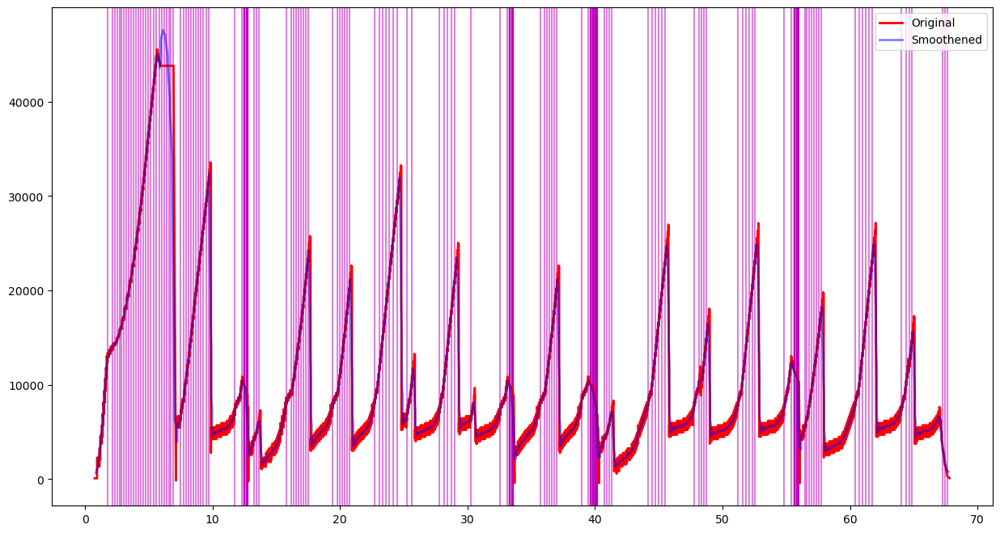

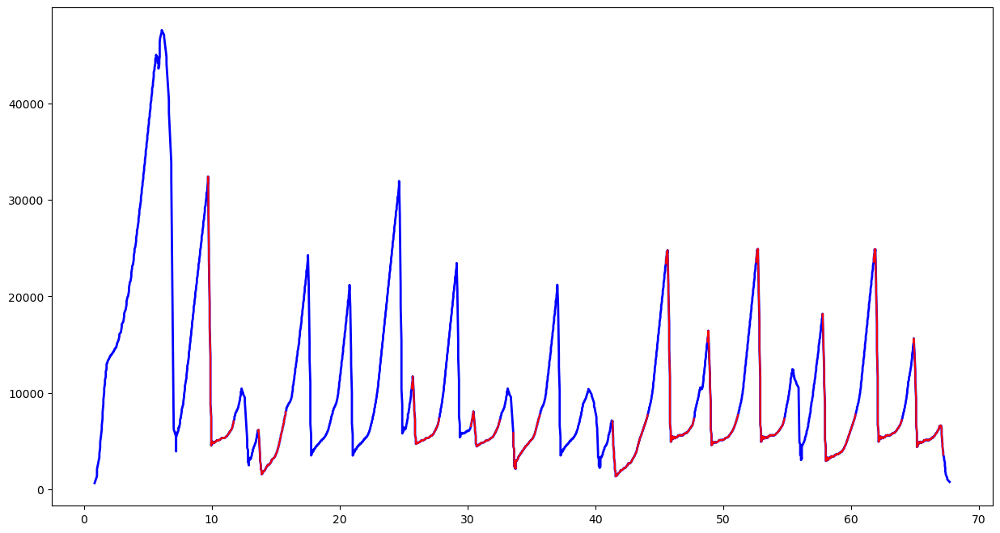

Feature Length  203


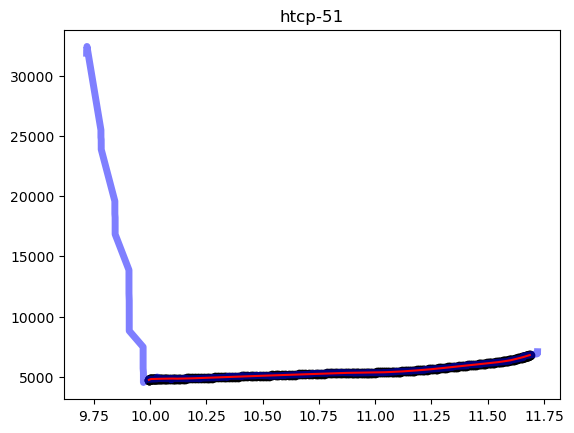

Name : htcp-511
Degree to fit 3


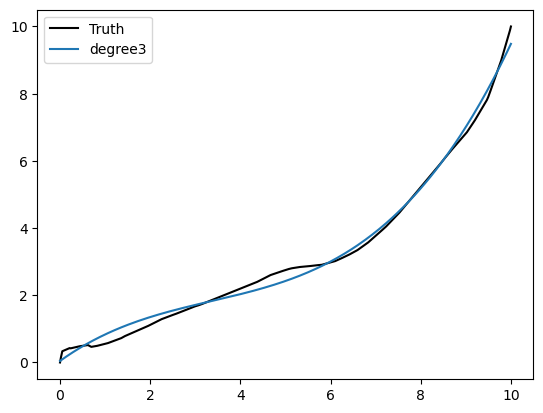

In [356]:
cc_mp = get_feature_degree(["htcp-51-0-50-200-2-aws-88-60"],ss=225,p="y",ft_thresh=1,max_deg=3)

### Making groups according to the degree

In [357]:
ccs = ['bic', 'dctcp', 'highspeed', 'htcp', 'lp', 'nv', 'scalable', 'vegas', 'veno', 'westwood', 'yeah', 'cubic', 'reno']

In [358]:
def get_degree_all(time,data, p="n", max_deg=3):
    p_net = []
    mse_l = []
    fit_net = []
    for d in range(1,max_deg+1):
        p_temp = np.polyfit(time,data,d)
        p_net.append(p_temp)
        fit_net.append(np.polyval(p_temp,time))
        mse_l.append(mse(data,fit_net[-1]))
    if p =='y':
#         print("1 ", p1, "MSE ", mse(data, fit_l))
        plt.plot(time, data,c='k',label='Truth')
#         plt.plot(time, fit_l)
        for d in range(max_deg-1, max_deg):
            plot_label = "degree"+str(d)
            plt.plot(time, fit_net[d],label="degree" + str(d+1))
        plt.legend()
        plt.show()
    return max_deg,p_net, mse_l

In [359]:
total = 100

In [360]:
degree_check = []
for cc in ccs:
    for i in range(1,total):
        degree_check.append(cc+"-"+str(i)+"-0-50-200-2-aws-88-60")
results = getRed(degree_check,ss=225,p="n",ft_thresh=1)
nmp = {}
for item in results :
    for ele in list(item.keys()):
        name_list = ele.split("_")
        name= name_list[0]
        if "data"==name_list[1] :
            curr_data = np.array(item[ele])
        if "time"==name_list[1] :
            curr_time = np.array(item[ele])
        if "rtt"==name_list[1] :
            curr_rtt = item[ele]
        if "bdp"==name_list[1] :
            curr_bdp = item[ele]
    curr_time, curr_data = normalize(curr_time, curr_data, curr_rtt, curr_bdp)
    max_deg,p_net,mse_l = get_degree_all(curr_time, curr_data, p='n',max_deg=3)
    nmp[name] = {
        'data':curr_data,
        'time':curr_time,
        "max_deg":max_deg,
        "p_net":p_net,
        "mse_l":mse_l
    }

bic-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56518', '56520'])
Port 56520
Feature Length  203
bic-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42624', '42626'])
Port 42626
Feature Length  203
bic-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58296', '48886'])
Port 48886
Feature Length  203
bic-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52340', '52350'])
Port 52350
Feature Length  203
bic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-5-0-50-200-2-aws-88-60-tcp.csv...

All Ports :  dict_keys(['44184', '44188'])
Port 44188
Feature Length  203
bic-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56500', '56510'])
Port 56510
Feature Length  203
bic-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48326', '48330'])
Port 48330
Feature Length  203
bic-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58644', '58652'])
Port 58652
Feature Length  203
bic-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33766', '33780'])
Port 33780
Feature Length  203
bic-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-44-

All Ports :  dict_keys(['41128', '41134'])
Port 41134
Feature Length  203
bic-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53162', '53168'])
Port 53168
Feature Length  203
bic-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36520', '36528'])
Port 36528
Feature Length  203
bic-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51634', '51642'])
Port 51642
Feature Length  203
bic-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48870', '48878'])
Port 48878
Feature Length  203
bic-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-82-

All Ports :  dict_keys(['60856', '60864'])
Port 60864
Feature Length  203
dctcp-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47902', '40446'])
Port 40446
Feature Length  203
dctcp-18-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-18-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-18-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40644', '40650'])
Port 40650
Feature Length  203
dctcp-19-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-19-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-19-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41850', '41856'])
Port 41856
Feature Length  203
dctcp-20-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-20-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-20-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46698', '46702'])
Port 46702
Feature Length  203
dctcp-21-0-50-200-2-aws-88-60


All Ports :  dict_keys(['56592', '56606'])
Port 56606
Feature Length  203
dctcp-55-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-55-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-55-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50430', '50446'])
Port 50446
Feature Length  203
dctcp-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38778', '38780'])
Port 38780
Feature Length  203
dctcp-57-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-57-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-57-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44286', '44288'])
Port 44288
Feature Length  203
dctcp-58-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55544', '36682'])
Port 36682
Feature Length  203
dctcp-59-0-50-200-2-aws-88-60


All Ports :  dict_keys(['33660', '33666'])
Port 33666
Feature Length  203
dctcp-92-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-92-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-92-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50258', '50266'])
Port 50266
Feature Length  203
dctcp-93-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39988', '39998'])
Port 39998
Feature Length  203
dctcp-94-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-94-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-94-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43762', '43764'])
Port 43764
Feature Length  203
dctcp-95-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45868', '45882'])
Port 45882
Feature Length  203
dctcp-96-0-50-200-2-aws-88-60


Feature Length  203
highspeed-29-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37706', '35646'])
Port 35646
Feature Length  203
highspeed-30-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47038', '47042'])
Port 47042
Feature Length  203
highspeed-31-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-31-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60904', '60908'])
Port 60908
Feature Length  203
highspeed-32-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-32-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-32-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59220', '59230'])
Port 59230
Feature Length  203
highspeed-33-0-50-200-2-aws-88-60
RT

All Ports :  dict_keys(['33780', '33784'])
Port 33784
Feature Length  203
highspeed-64-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-64-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-64-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54756', '54764'])
Port 54764
Feature Length  203
highspeed-65-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-65-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-65-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37730', '37744'])
Port 37744
Feature Length  203
highspeed-66-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-66-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-66-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52058', '52072'])
Port 52072
Feature Length  203
highspeed-67-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37502', '37514'])
Port 37514
Fe

Feature Length  203
highspeed-99-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-99-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-99-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43878', '43882'])
Port 43882
Feature Length  203
htcp-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40828', '40842'])
Port 40842
Feature Length  203
htcp-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58592', '58600'])
Port 58600
Feature Length  203
htcp-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58010', '58012'])
Port 58012
Feature Length  203
htcp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-4-0-50-200-2-aws-88-60
Reading ../../c

All Ports :  dict_keys(['59008', '59022'])
Port 59022
Feature Length  203
htcp-38-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49102', '49114'])
Port 49114
Feature Length  203
htcp-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57904', '57908'])
Port 57908
Feature Length  203
htcp-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58198', '58204'])
Port 58204
Feature Length  203
htcp-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51426', '51434'])
Port 51434
Feature Length  203
htcp-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['35512', '35514'])
Port 35514
Feature Length  203
htcp-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41868', '41876'])
Port 41876
Feature Length  203
htcp-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39078', '39086'])
Port 39086
Feature Length  203
htcp-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55684', '55692'])
Port 55692
Feature Length  203
htcp-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53178', '53180'])
Port 53180
Feature Length  203
htcp-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['60194', '60196'])
Port 60196
Feature Length  203
lp-18-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-18-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-18-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60900', '60910'])
Port 60910
Feature Length  203
lp-19-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-19-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-19-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41622', '41632'])
Port 41632
Feature Length  203
lp-20-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-20-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-20-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51206', '51208'])
Port 51208
Feature Length  203
lp-21-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-21-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-21-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58882', '58898'])
Port 58898
Feature Length  203
lp-22-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-22-0-50-200-2-aws

Feature Length  203
lp-57-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-57-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-57-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49794', '49800'])
Port 49800
Feature Length  203
lp-58-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34320', '59360'])
Port 59360
Feature Length  203
lp-59-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-59-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-59-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57178', '57188'])
Port 57188
Feature Length  203
lp-60-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-60-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-60-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58392', '58398'])
Port 58398
Feature Length  203
lp-61-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-61-0-50-200-2-

All Ports :  dict_keys(['55100', '55104'])
Port 55104
Feature Length  203
lp-96-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54998', '55004'])
Port 55004
Feature Length  203
lp-97-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-97-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-97-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38466', '38478'])
Port 38478
Feature Length  203
lp-98-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-98-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-98-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44384', '44398'])
Port 44398
Feature Length  203
lp-99-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-99-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-99-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45572', '45588'])
Port 45588
Feature Length  203
nv-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-1-0-50-200-2-aws-8

Reading ../../control_tests_n/nv-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47024', '47026'])
Port 47026
Feature Length  203
nv-36-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-36-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-36-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46666', '46682'])
Port 46682
Feature Length  203
nv-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39442', '57292'])
Port 57292
Feature Length  203
nv-38-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36828', '36834'])
Port 36834
Feature Length  203
nv-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47580', '47590'])
Port 47590
Feature Length  20

All Ports :  dict_keys(['40762', '40764'])
Port 40764
Feature Length  203
nv-74-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-74-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-74-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42436', '48704'])
Port 48704
Feature Length  203
nv-75-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37178', '37192'])
Port 37192
Feature Length  203
nv-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43580', '43582'])
Port 43582
Feature Length  203
nv-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57478', '57492'])
Port 57492
Feature Length  203
nv-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-78-0-50-200-2-aws

All Ports :  dict_keys(['52848', '52862'])
Port 52862
scalable-13-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-13-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-13-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54194', '54200'])
Port 54200
Feature Length  203
scalable-14-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57588', '57596'])
Port 57596
Feature Length  203
scalable-15-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41850', '41852'])
Port 41852
Feature Length  203
scalable-16-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51386', '51388'])
Port 51388
Feature Length  203
scalable-17-0-

All Ports :  dict_keys(['54956', '54958'])
Port 54958
Feature Length  203
scalable-50-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43844', '43856'])
Port 43856
scalable-51-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47330', '47346'])
Port 47346
scalable-52-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-52-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41554', '41566'])
Port 41566
scalable-53-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-53-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-53-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58622', '58634'])
Port 58634
scalable-54-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-54-0-50-200-2

All Ports :  dict_keys(['56980', '56986'])
Port 56986
scalable-88-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-88-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-88-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42590', '57504'])
Port 57504
scalable-89-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-89-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42256', '42268'])
Port 42268
Feature Length  203
scalable-90-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-90-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-90-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49324', '49336'])
Port 49336
scalable-91-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43180', '43196'])
Port 43196
Feature Length  203
scalable-92-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
sc

All Ports :  dict_keys(['55614', '55620'])
Port 55620
Feature Length  203
vegas-27-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-27-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-27-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46352', '46366'])
Port 46366
Feature Length  203
vegas-28-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55614', '55626'])
Port 55626
Feature Length  203
vegas-29-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48926', '57604'])
Port 57604
Feature Length  203
vegas-30-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53092', '53104'])
Port 53104
Feature Length  203
vegas-31-0-50-200-2-aws-88-60


All Ports :  dict_keys(['54276', '54290'])
Port 54290
Feature Length  203
vegas-64-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-64-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-64-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47614', '47626'])
Port 47626
Feature Length  203
vegas-65-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-65-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-65-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58872', '58880'])
Port 58880
Feature Length  203
vegas-66-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-66-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-66-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52390', '39982'])
Port 39982
Feature Length  203
vegas-67-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53118', '53122'])
Port 53122
Feature Length  203
vegas-68-0-50-200-2-aws-88-60


All Ports :  dict_keys(['44420', '44426'])
Port 44426
Feature Length  203
veno-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54516', '54532'])
Port 54532
Feature Length  203
veno-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39626', '39636'])
Port 39636
Feature Length  203
veno-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36424', '36430'])
Port 36430
Feature Length  203
veno-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42562', '42568'])
Port 42568
Feature Length  203
veno-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-6-

All Ports :  dict_keys(['39882', '39894'])
Port 39894
Feature Length  203
veno-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35002', '35012'])
Port 35012
Feature Length  203
veno-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49960', '49964'])
Port 49964
Feature Length  203
veno-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60824', '60834'])
Port 60834
Feature Length  203
veno-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58480', '58482'])
Port 58482
Feature Length  203
veno-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['43566', '43580'])
Port 43580
Feature Length  203
veno-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54788', '54800'])
Port 54800
Feature Length  203
veno-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50574', '50590'])
Port 50590
Feature Length  203
veno-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50910', '50926'])
Port 50926
Feature Length  203
veno-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47988', '47992'])
Port 47992
Feature Length  203
veno-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['49670', '49678'])
Port 49678
Feature Length  203
westwood-16-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60818', '60822'])
Port 60822
Feature Length  203
westwood-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37442', '37450'])
Port 37450
Feature Length  203
westwood-18-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-18-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-18-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45342', '45354'])
Port 45354
Feature Length  203
westwood-19-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-19-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-19-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55956', '55958'])
Port 55958
Feature Length

All Ports :  dict_keys(['43182', '45788'])
Port 45788
Feature Length  203
westwood-52-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-52-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43318', '43326'])
Port 43326
Feature Length  203
westwood-53-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-53-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-53-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58964', '58970'])
Port 58970
Feature Length  203
westwood-54-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-54-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-54-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55588', '55590'])
Port 55590
Feature Length  203
westwood-55-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-55-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-55-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33850', '33856'])
Port 33856
Feature Length

All Ports :  dict_keys(['60060', '60064'])
Port 60064
Feature Length  203
westwood-88-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-88-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-88-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51312', '51324'])
Port 51324
Feature Length  203
westwood-89-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-89-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37598', '37604'])
Port 37604
Feature Length  203
westwood-90-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-90-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-90-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60608', '60612'])
Port 60612
Feature Length  203
westwood-91-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42864', '42880'])
Port 42880
Feature Length

All Ports :  dict_keys(['36814', '36826'])
Port 36826
Feature Length  203
yeah-26-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-26-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-26-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36456', '36472'])
Port 36472
Feature Length  203
yeah-27-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-27-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-27-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33118', '33130'])
Port 33130
Feature Length  203
yeah-28-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60470', '60478'])
Port 60478
Feature Length  203
yeah-29-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58276', '58286'])
Port 58286
Feature Length  203
yeah-30-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['34510', '34520'])
Port 34520
Feature Length  203
yeah-64-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-64-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-64-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59588', '59590'])
Port 59590
Feature Length  203
yeah-65-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-65-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-65-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46950', '46956'])
Port 46956
Feature Length  203
yeah-66-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-66-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-66-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39778', '39786'])
Port 39786
Feature Length  203
yeah-67-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59246', '59262'])
Port 59262
Feature Length  203
yeah-68-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['57896', '57912'])
Port 57912
Feature Length  203
cubic-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51890', '51898'])
Port 51898
Feature Length  203
cubic-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56316', '56326'])
Port 56326
Feature Length  203
cubic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54340', '54346'])
Port 54346
Feature Length  203
cubic-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46046', '46060'])
Port 46060
Feature Length  203
cubic-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['58568', '58578'])
Port 58578
Feature Length  203
cubic-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47388', '53964'])
Port 53964
Feature Length  203
cubic-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37964', '37966'])
Port 37966
Feature Length  203
cubic-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37312', '37314'])
Port 37314
Feature Length  203
cubic-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37440', '37456'])
Port 37456
Feature Length  203
cubic-44-0-50-200-2-aws-88-60


All Ports :  dict_keys(['34918', '34920'])
Port 34920
Feature Length  203
cubic-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43332', '43340'])
Port 43340
Feature Length  203
cubic-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44644', '44654'])
Port 44654
Feature Length  203
cubic-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40724', '40730'])
Port 40730
Feature Length  203
cubic-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56240', '56256'])
Port 56256
Feature Length  203
cubic-81-0-50-200-2-aws-88-60


All Ports :  dict_keys(['54434', '54438'])
Port 54438
Feature Length  203
reno-15-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43396', '43400'])
Port 43400
Feature Length  203
reno-16-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56626', '56632'])
Port 56632
Feature Length  203
reno-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51188', '51198'])
Port 51198
Feature Length  203
reno-18-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-18-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-18-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51300', '51310'])
Port 51310
Feature Length  203
reno-19-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['34246', '34256'])
Port 34256
Feature Length  203
reno-53-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-53-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-53-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33288', '33290'])
Port 33290
Feature Length  203
reno-54-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-54-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-54-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34760', '34774'])
Port 34774
Feature Length  203
reno-55-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-55-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-55-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54404', '54416'])
Port 54416
Feature Length  203
reno-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49370', '43896'])
Port 43896
Feature Length  203
reno-57-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['45168', '45180'])
Port 45180
Feature Length  203
reno-91-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39710', '39716'])
Port 39716
Feature Length  203
reno-92-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-92-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-92-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40336', '40338'])
Port 40338
Feature Length  203
reno-93-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34198', '34208'])
Port 34208
Feature Length  203
reno-94-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-94-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-94-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41374', '41384'])
Port 41384
Feature Length  203
reno-95-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

In [361]:
nmp

{'bic-1': {'data': array([0.00000000e+00, 8.76706647e-03, 1.75341329e-02, 1.83313881e-02,
         3.09381387e-02, 4.74645715e-02, 5.05131139e-02, 7.96791400e-02,
         1.08845166e-01, 1.38011192e-01, 1.67177218e-01, 1.99097578e-01,
         2.44778349e-01, 2.90459120e-01, 3.36139891e-01, 3.81644412e-01,
         4.27148933e-01, 4.72653455e-01, 5.31282214e-01, 6.07036545e-01,
         6.82617217e-01, 7.58197889e-01, 8.21078642e-01, 8.83959395e-01,
         9.42590112e-01, 1.00122083e+00, 1.07610120e+00, 1.13953370e+00,
         1.20220787e+00, 1.26504041e+00, 1.32395327e+00, 1.38455472e+00,
         1.41903868e+00, 1.45352265e+00, 1.49544223e+00, 1.52217707e+00,
         1.54615758e+00, 1.53890853e+00, 1.54324196e+00, 1.55733854e+00,
         1.57820174e+00, 1.63613578e+00, 1.70107330e+00, 1.75288658e+00,
         1.80937016e+00, 1.86602739e+00, 1.92268462e+00, 1.99204178e+00,
         2.06139893e+00, 2.11083451e+00, 2.16302952e+00, 2.21522452e+00,
         2.28352448e+00, 2.3525827

In [384]:
results = {}
for name in nmp.keys():
#     print(name)
#     curr_time, curr_data, retrans, rtt = plot_one_bt(name+"-0-50-200-2-aws-88-60",'y',1)
    data = nmp[name]['data']
    time = nmp[name]['time']
    max_deg = nmp[name]['max_deg']
    p_net = []
    for coeff in nmp[name]['p_net']:
        temp_pnet = [abs(c) for c in coeff]
        p_net.append(temp_pnet)
    mse_l = nmp[name]['mse_l']
#     plt.plot(time, data,c='k',label='Truth')
#         plt.plot(time, fit_l)
#     for d in range(0, max_deg):
#         plot_label = "degree"+str(d+1)
#         fit_net = np.polyval(p_net[d],time)
#         plt.plot(time, fit_net,label="degree" + str(d+1))
#     plt.legend()
#     plt.show()
    
    names = []
    loss = []
    lambd = 0.02
    for i in range(len(mse_l)):
        loss.append((i+1)*sum(p_net[i])*lambd)
#     print("loss", loss)
#     print("mse", mse_l)
    for d in range(0, max_deg):
        names.append("degree "+str(d))
#     plt.bar(names,mse_l,color='blue',width=0.4,label="mse")
#     plt.bar(names,loss,bottom=mse_l,color='maroon',width=0.4,label="reg_loss")
    
#     plt.legend()
#     plt.show()
    errors = []
    # The code for deciding the categories
    for i in range(0,max_deg):
        errors.append(loss[i]+mse_l[i])
    deg = errors.index(min(errors))+1
#     if deg < 3:
#         deg = mse_l.index(min(mse_l[0:2]))+1
#     print(deg)
    if deg not in results:
        results[deg] = {}
    current_cc = name.split("-")[0]
    if current_cc not in results[deg]:
        results[deg][current_cc] = 0
    results[deg][current_cc] += 1

In [385]:
results

{1: {'bic': 95,
  'dctcp': 5,
  'highspeed': 3,
  'lp': 1,
  'nv': 1,
  'scalable': 40,
  'vegas': 3,
  'westwood': 2,
  'yeah': 96,
  'reno': 4},
 2: {'bic': 1,
  'dctcp': 94,
  'highspeed': 94,
  'lp': 98,
  'nv': 2,
  'vegas': 6,
  'veno': 26,
  'westwood': 97,
  'yeah': 3,
  'cubic': 5,
  'reno': 95},
 3: {'bic': 1,
  'highspeed': 2,
  'htcp': 99,
  'nv': 96,
  'scalable': 1,
  'vegas': 90,
  'veno': 73,
  'cubic': 94}}

In [386]:
degrees = [1,2,3]
matrix = []
for d in degrees:
    row = []
    for cc in ccs:
        if cc in results[d]:
            row.append(results[d][cc])
        else:
            row.append(0)
    matrix.append(row)
df = pd.DataFrame(matrix,index=degrees,columns=ccs)
print(df)
cc_degree = {}
for cc in ccs:
    d_list = list(df[cc])
    deg = d_list.index(max(d_list))+1
    print(cc,deg)
    cc_degree[cc] = deg 
    

   bic  dctcp  highspeed  htcp  lp  nv  scalable  vegas  veno  westwood  yeah  \
1   95      5          3     0   1   1        40      3     0         2    96   
2    1     94         94     0  98   2         0      6    26        97     3   
3    1      0          2    99   0  96         1     90    73         0     0   

   cubic  reno  
1      0     4  
2      5    95  
3     94     0  
bic 1
dctcp 2
highspeed 2
htcp 3
lp 2
nv 3
scalable 1
vegas 3
veno 3
westwood 2
yeah 1
cubic 3
reno 2


In [387]:
cc_degree

{'bic': 1,
 'dctcp': 2,
 'highspeed': 2,
 'htcp': 3,
 'lp': 2,
 'nv': 3,
 'scalable': 1,
 'vegas': 3,
 'veno': 3,
 'westwood': 2,
 'yeah': 1,
 'cubic': 3,
 'reno': 2}

bic-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48606', '48608'])
Port 48608


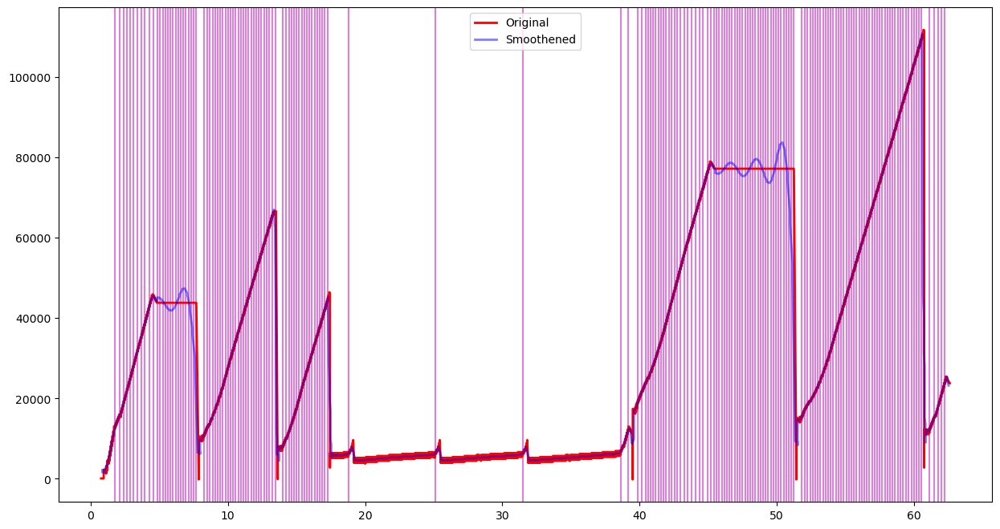

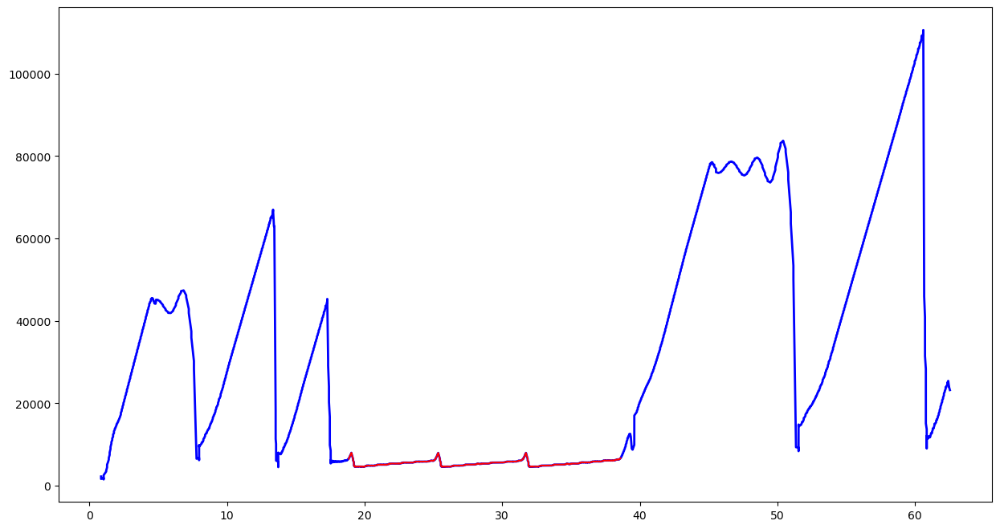

Feature Length  203


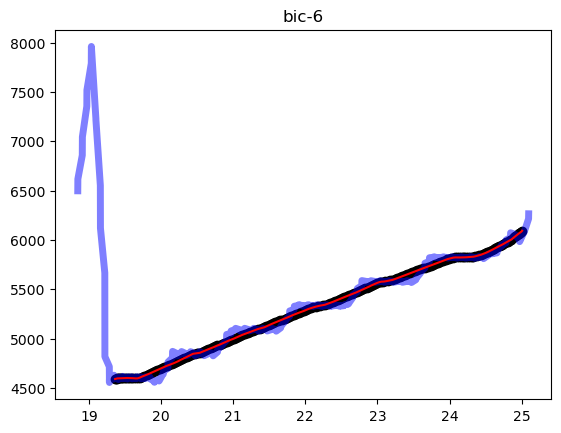

Name : bic-61
Degree to fit 1


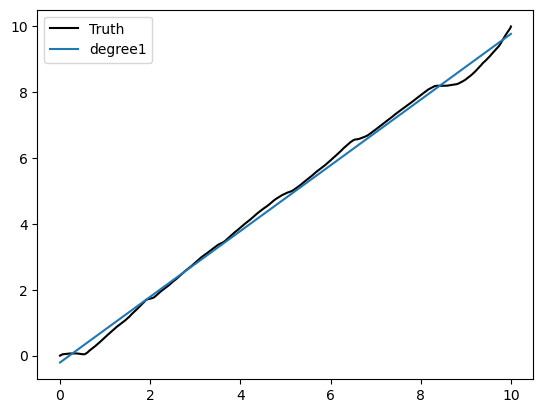

dctcp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48420', '48426'])
Port 48426


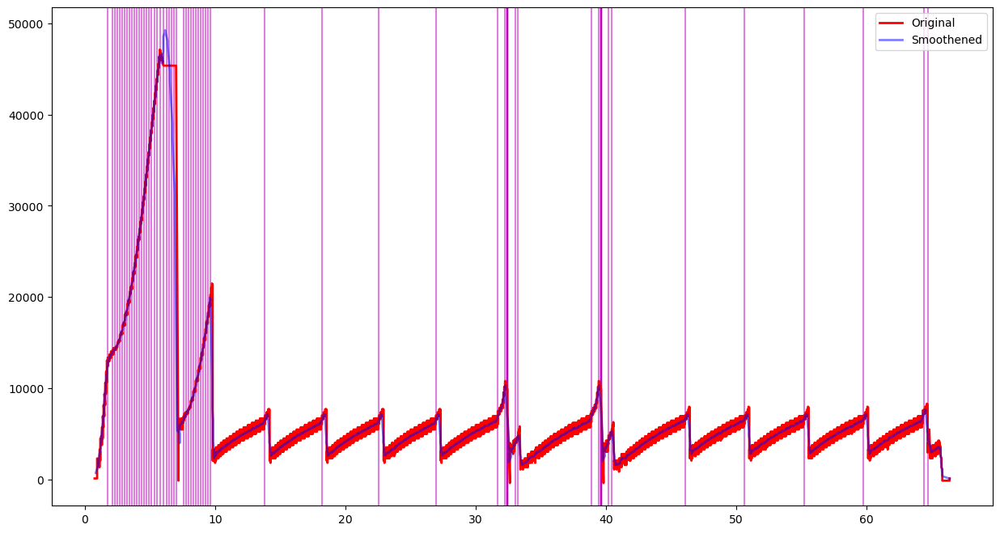

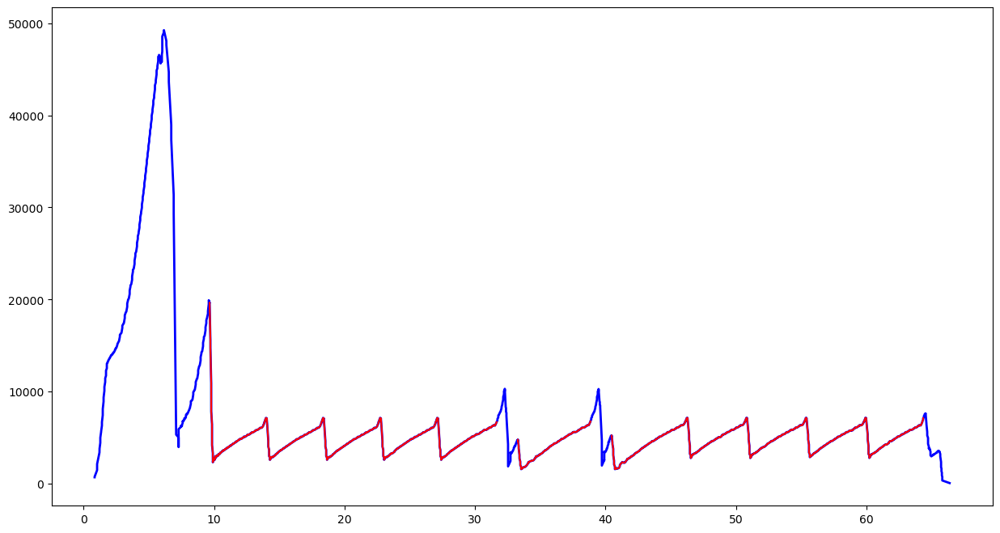

Feature Length  203


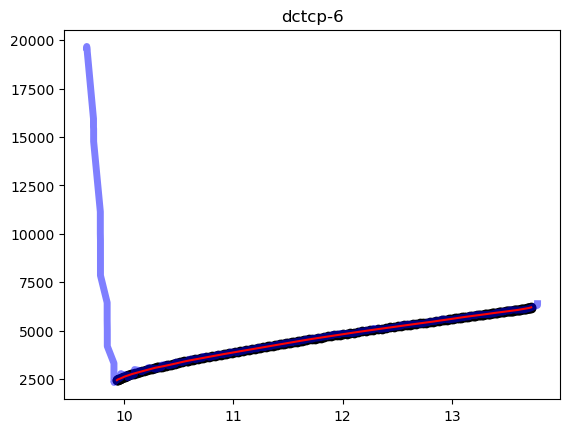

Name : dctcp-61
Degree to fit 2


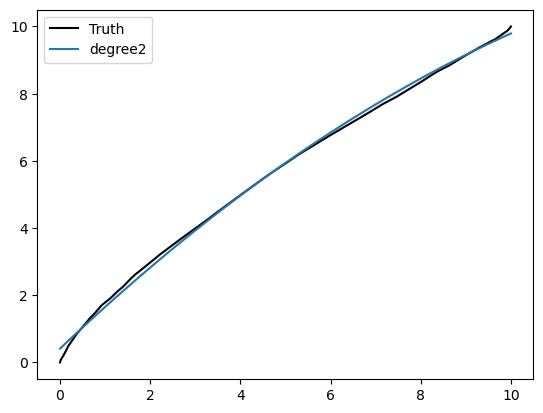

highspeed-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47814', '47818'])
Port 47818


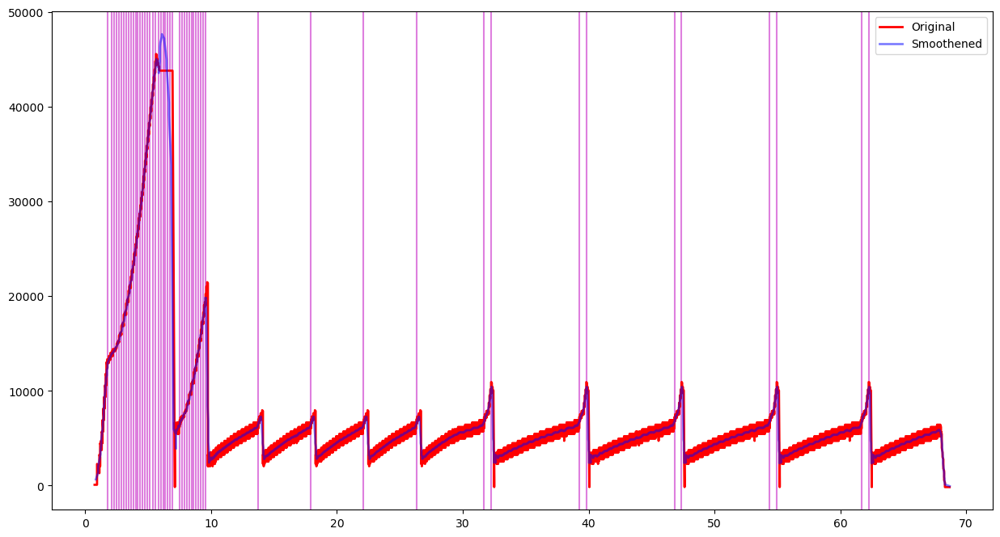

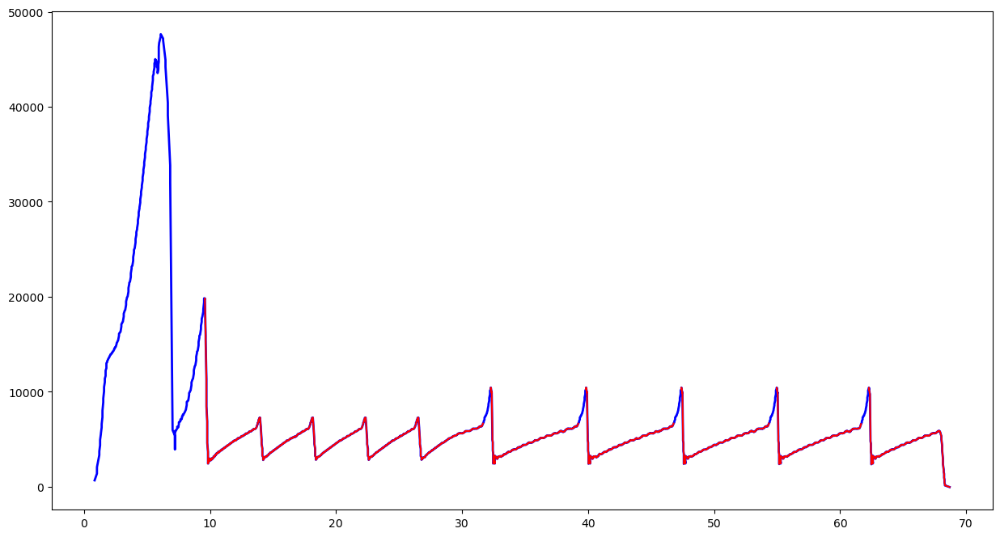

Feature Length  203


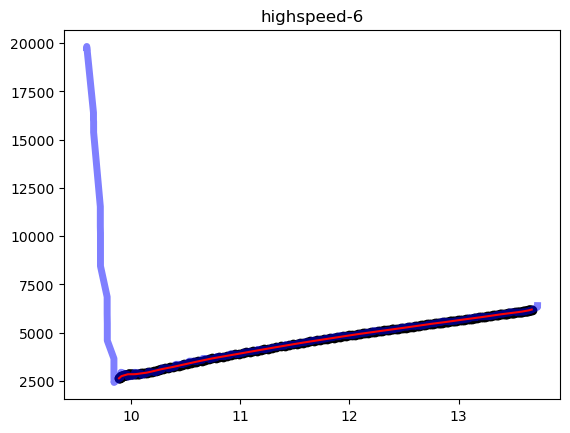

Name : highspeed-61
Degree to fit 2


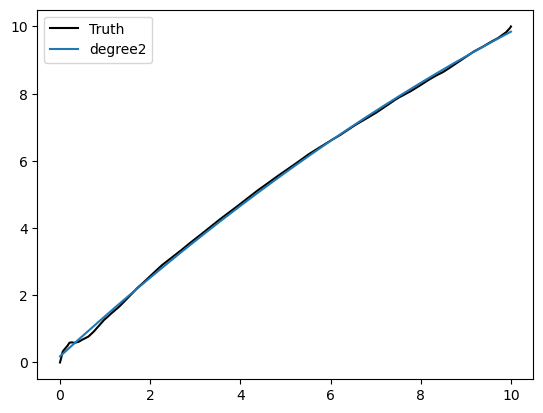

htcp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33750', '33762'])
Port 33762


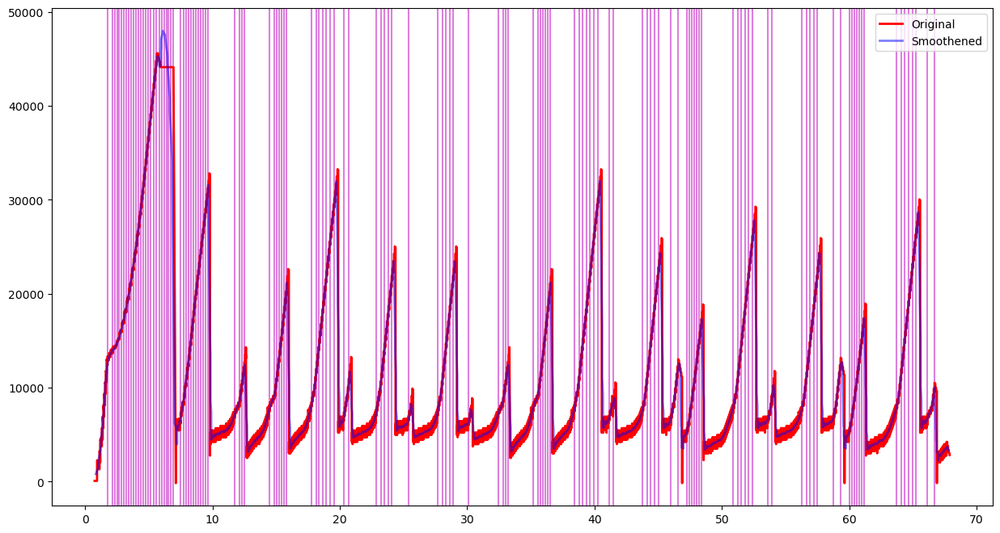

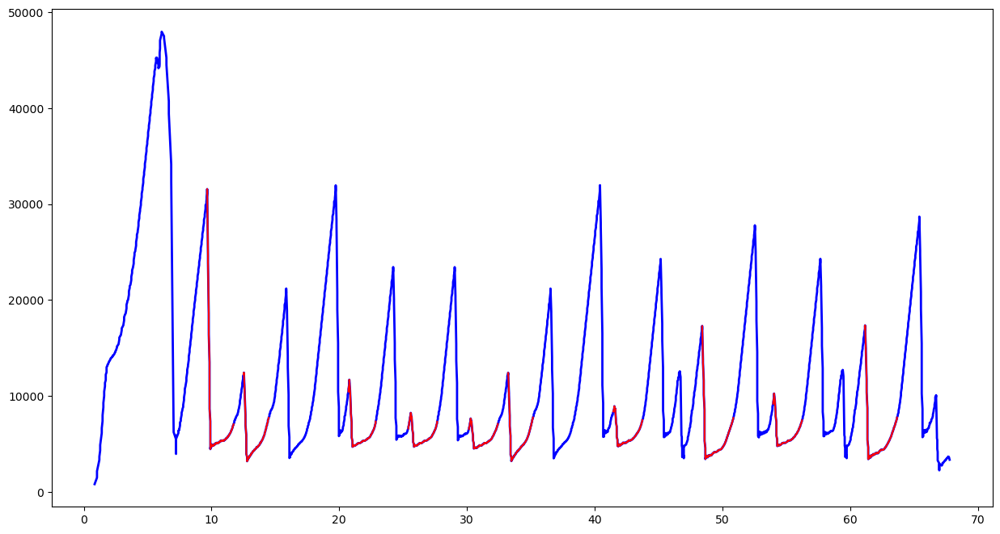

Feature Length  203


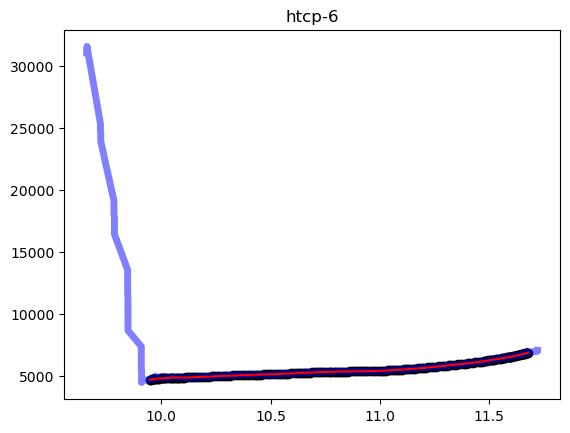

Name : htcp-61
Degree to fit 3


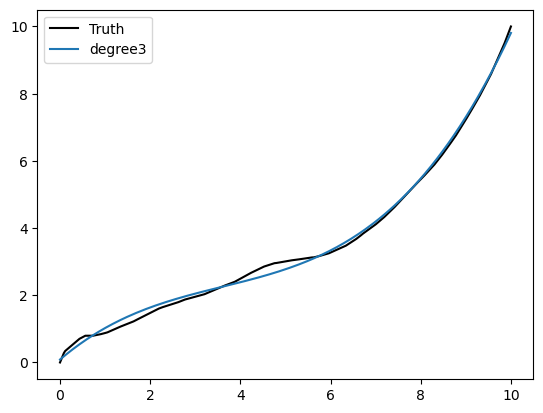

lp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44934', '44936'])
Port 44936


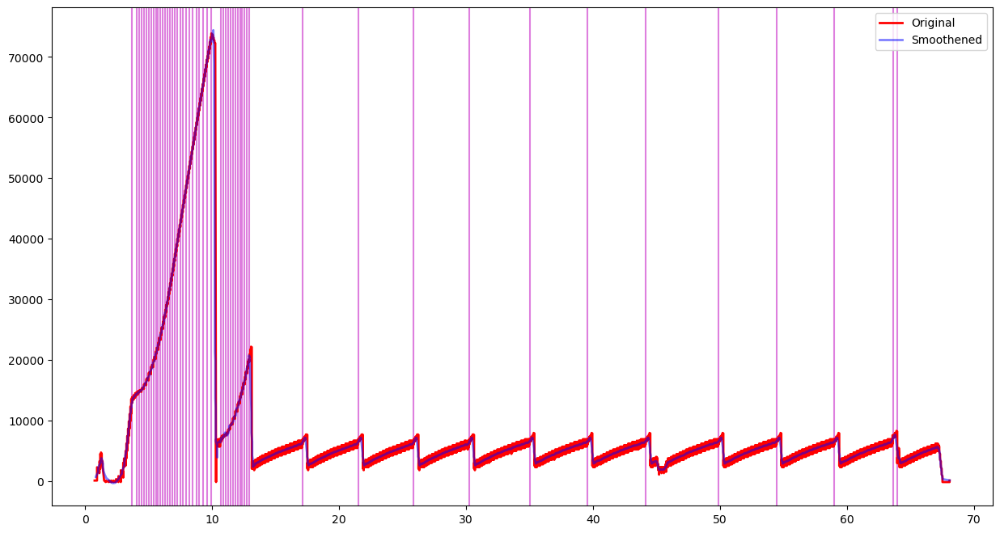

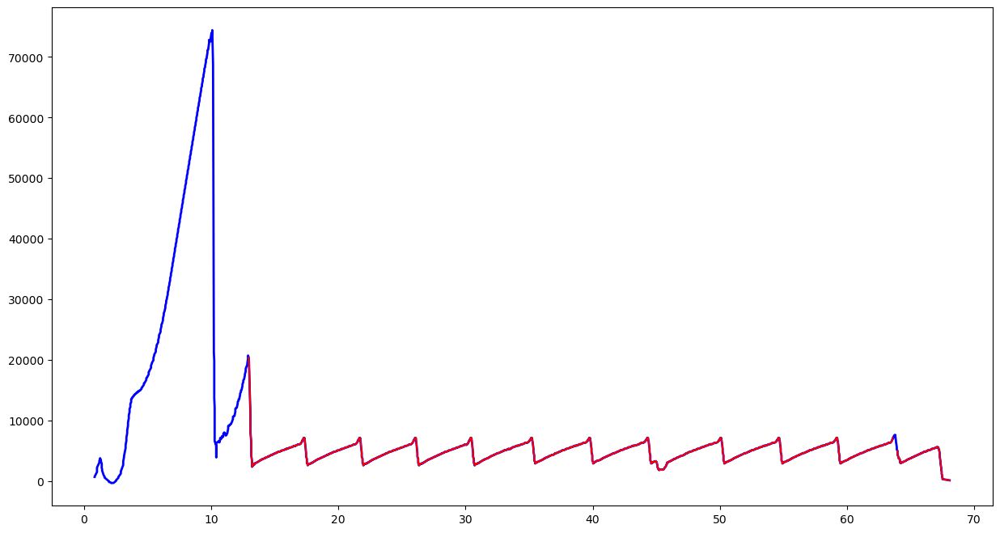

Feature Length  203


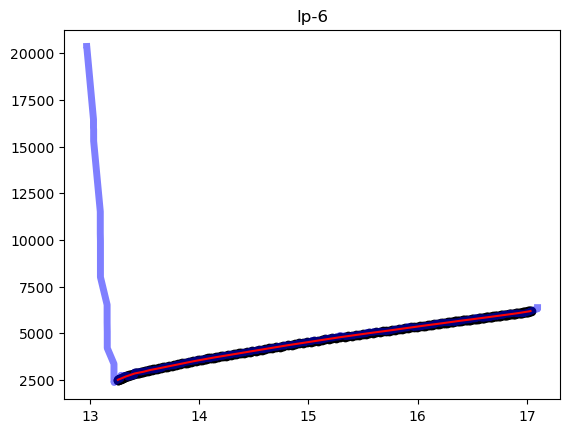

Name : lp-61
Degree to fit 2


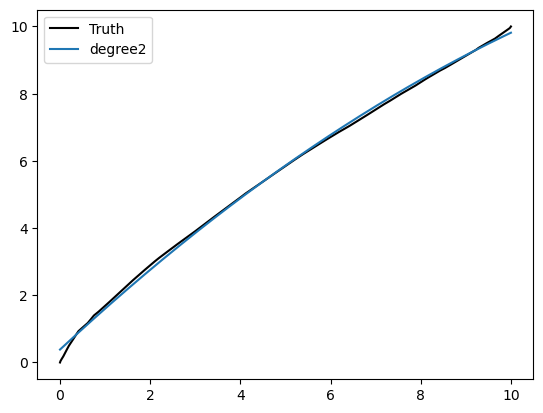

nv-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41912', '52042'])
Port 52042


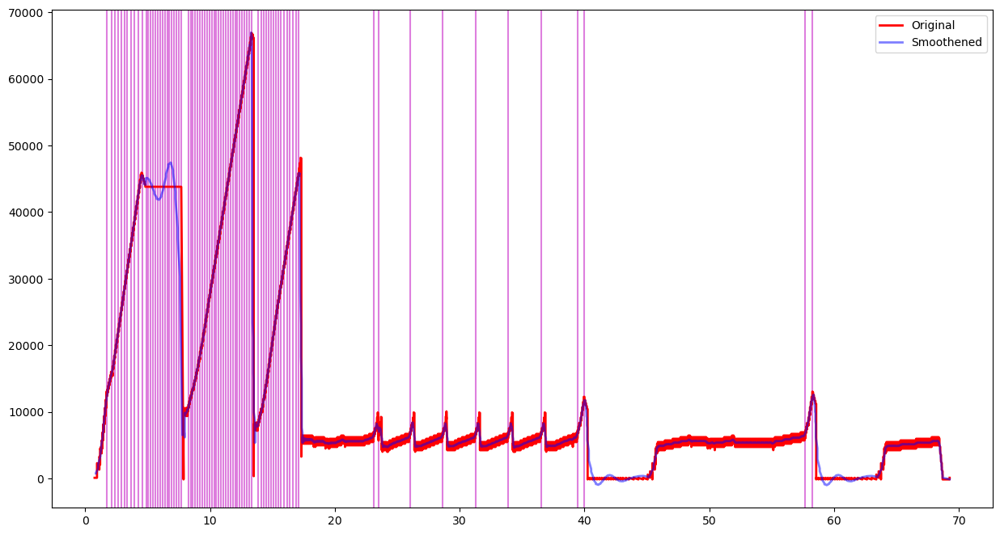

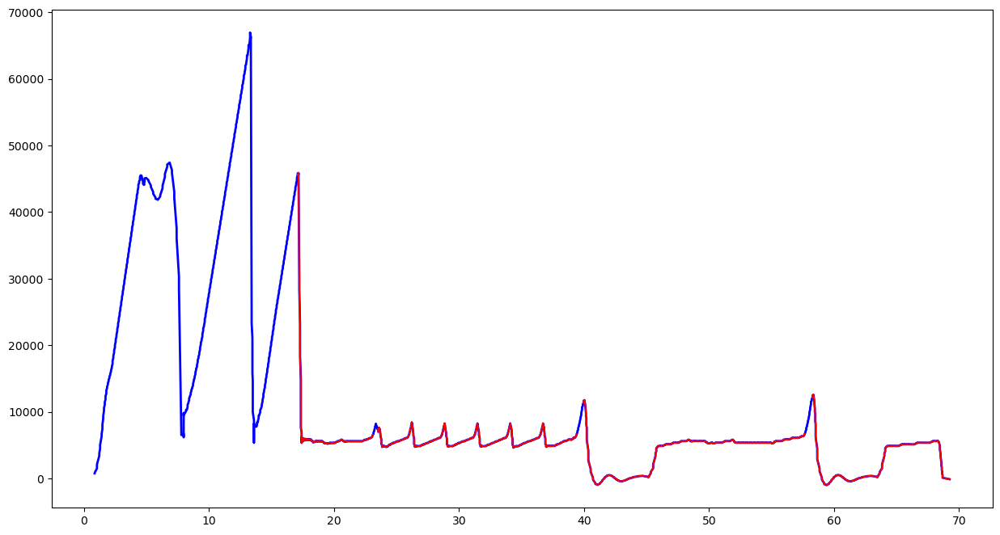

Feature Length  203


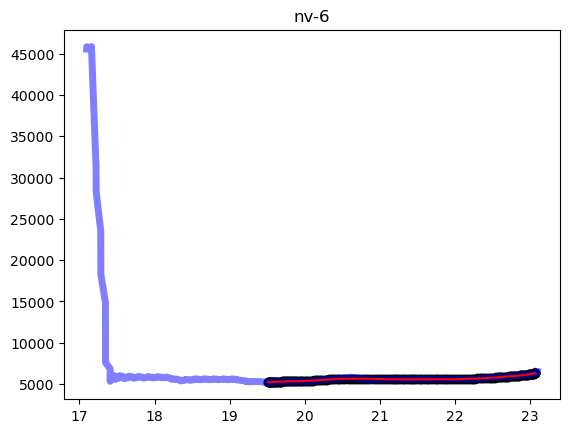

Name : nv-61
Degree to fit 3


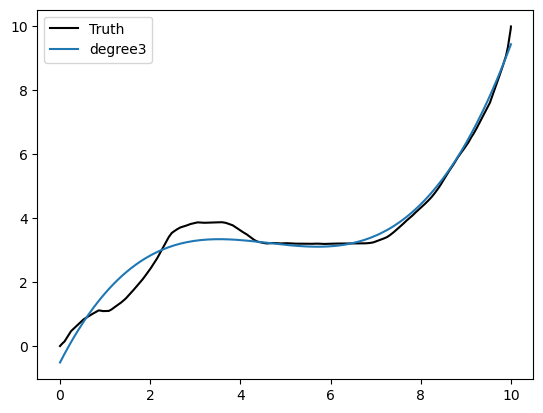

scalable-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42324', '42328'])
Port 42328


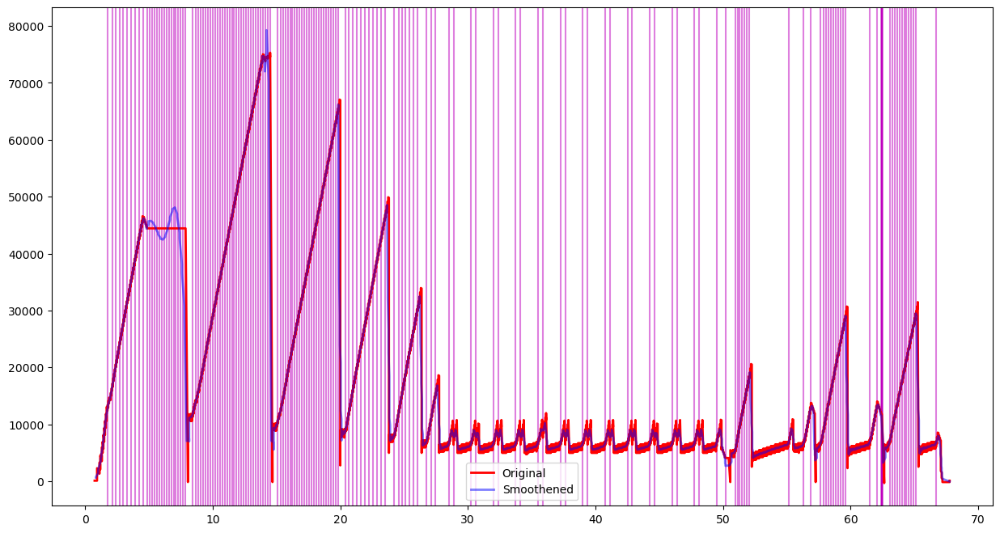

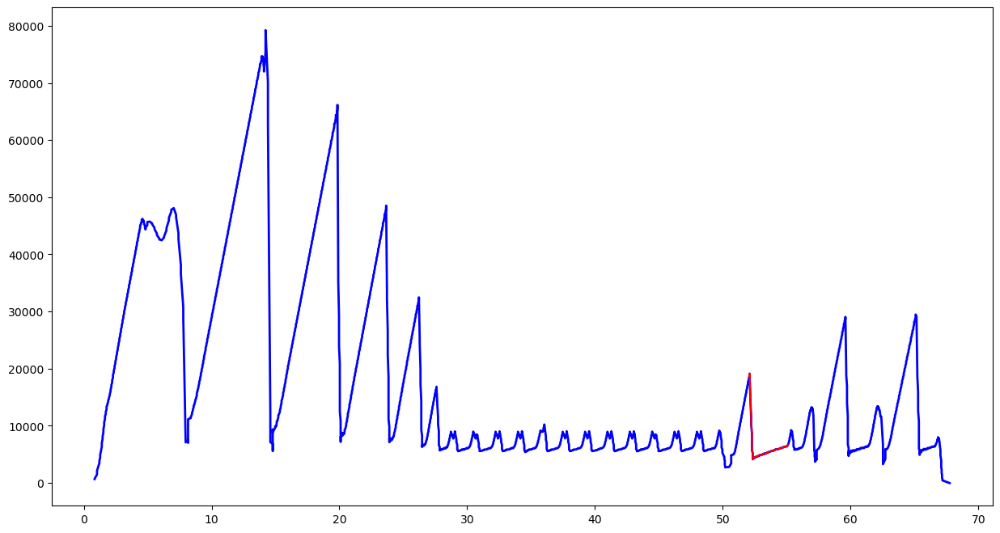

Feature Length  203


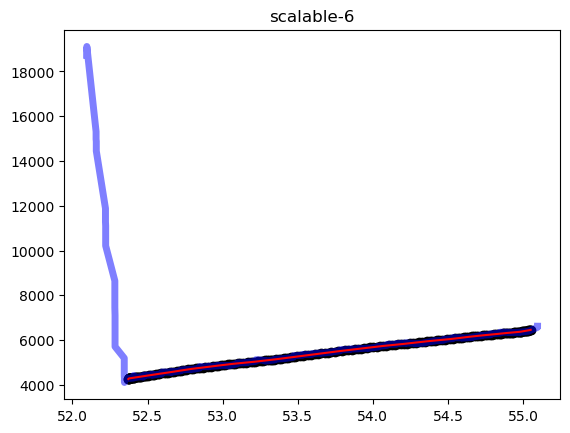

Name : scalable-61
Degree to fit 1


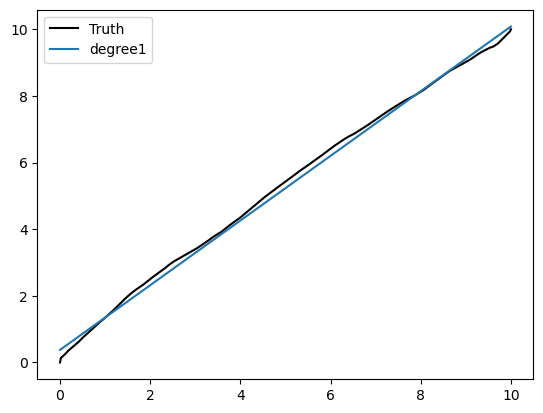

vegas-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45432', '45438'])
Port 45438


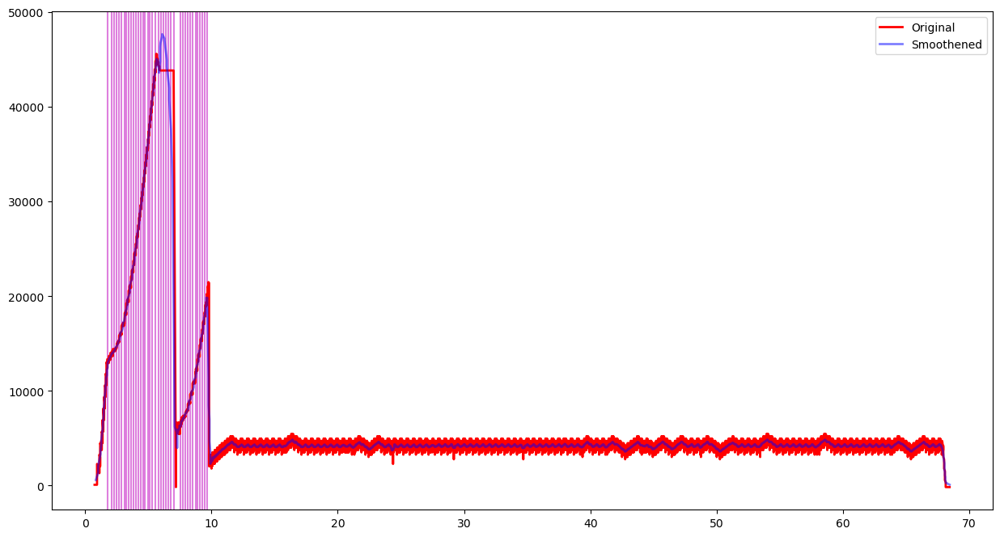

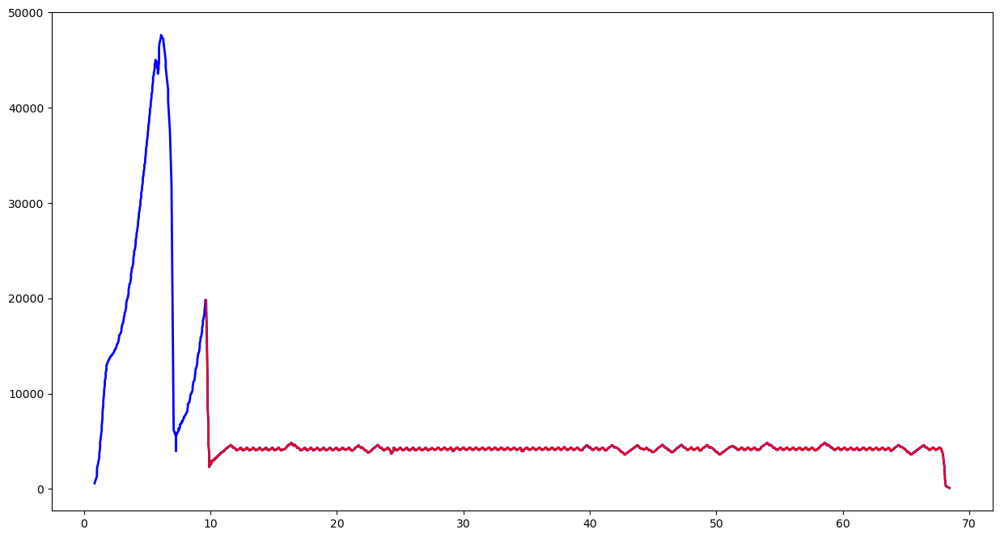

Feature Length  203


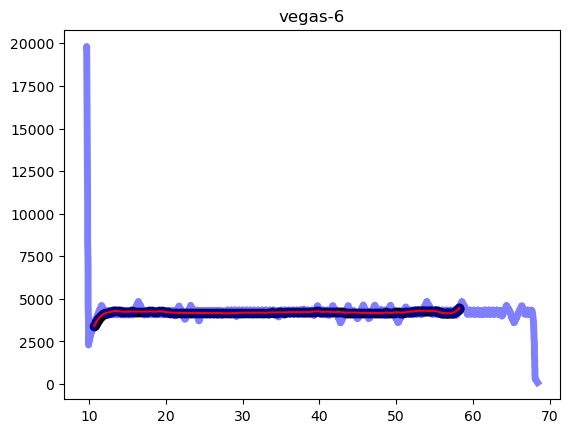

Name : vegas-61
Degree to fit 3


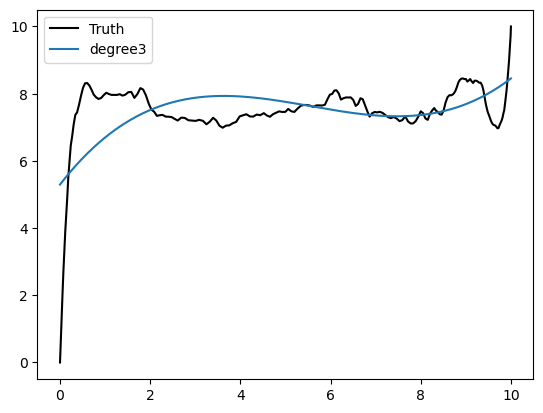

veno-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56432', '56438'])
Port 56438


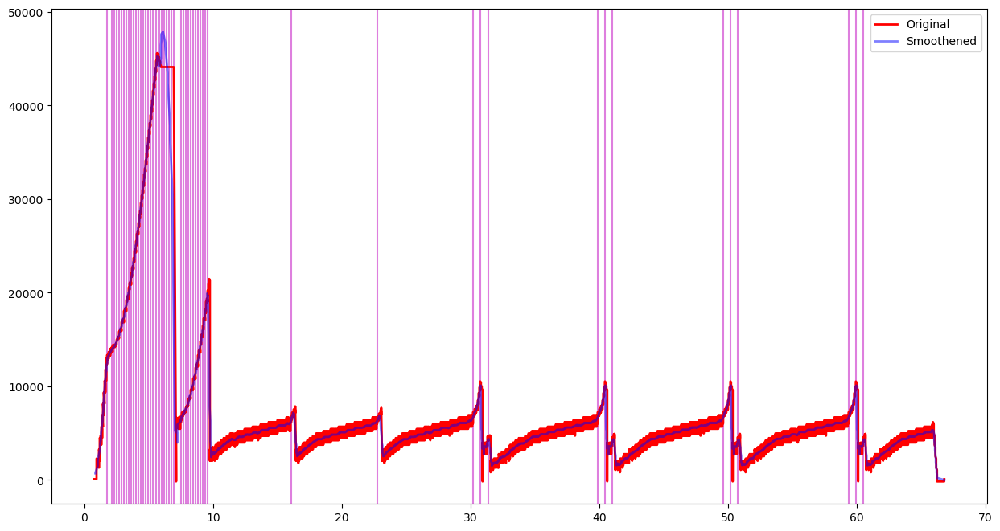

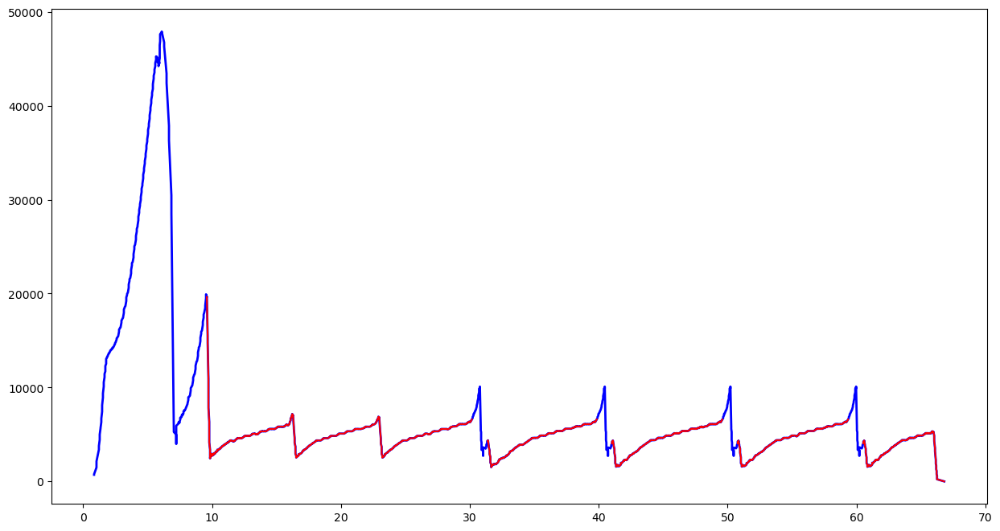

Feature Length  203


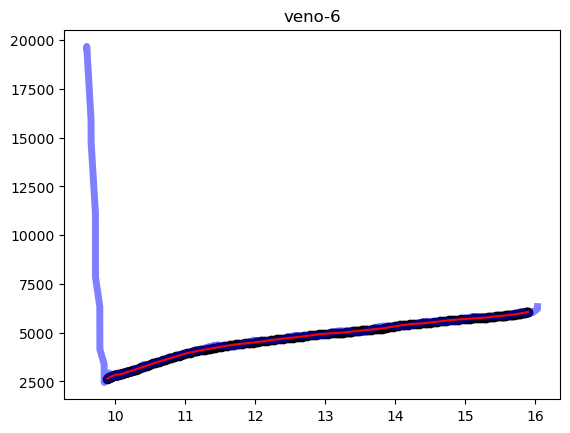

Name : veno-61
Degree to fit 3


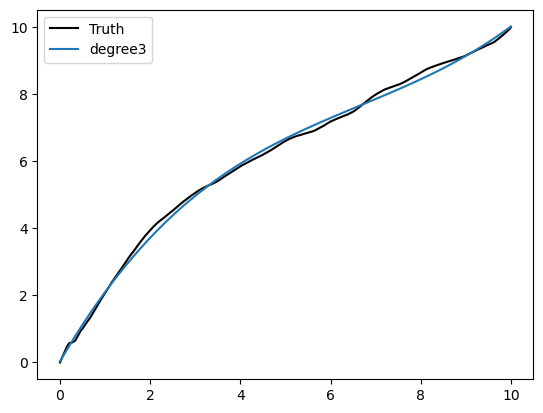

westwood-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58868', '58872'])
Port 58872


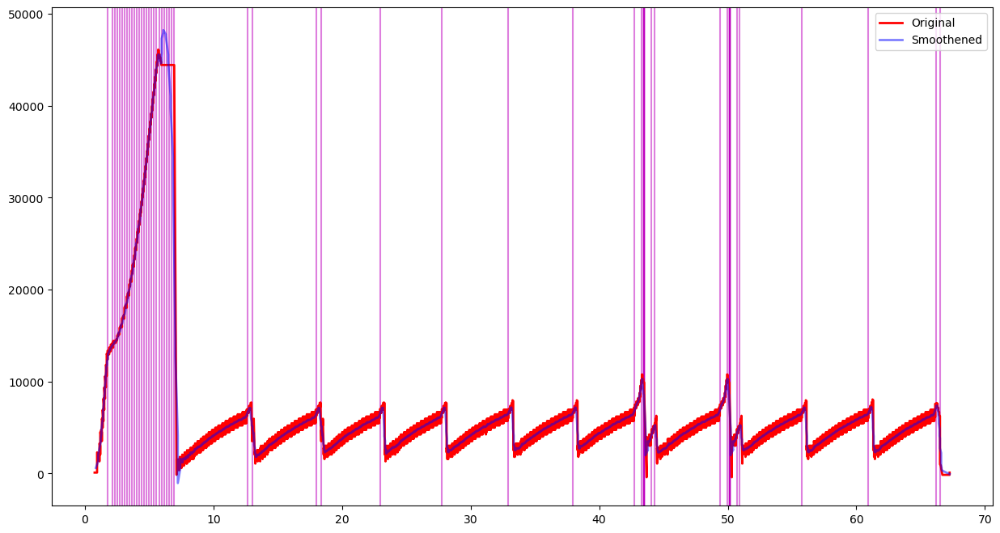

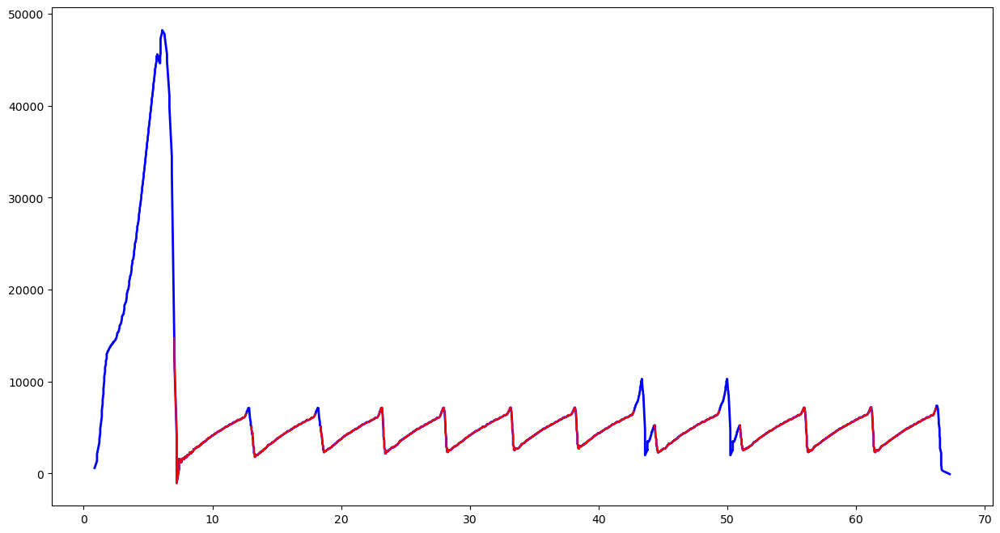

Feature Length  203


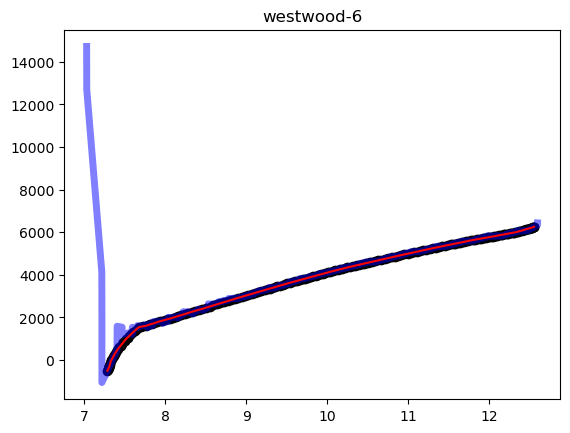

Name : westwood-61
Degree to fit 2


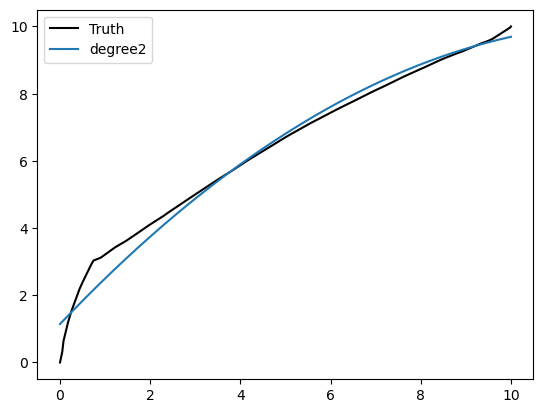

yeah-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41556', '41562'])
Port 41562


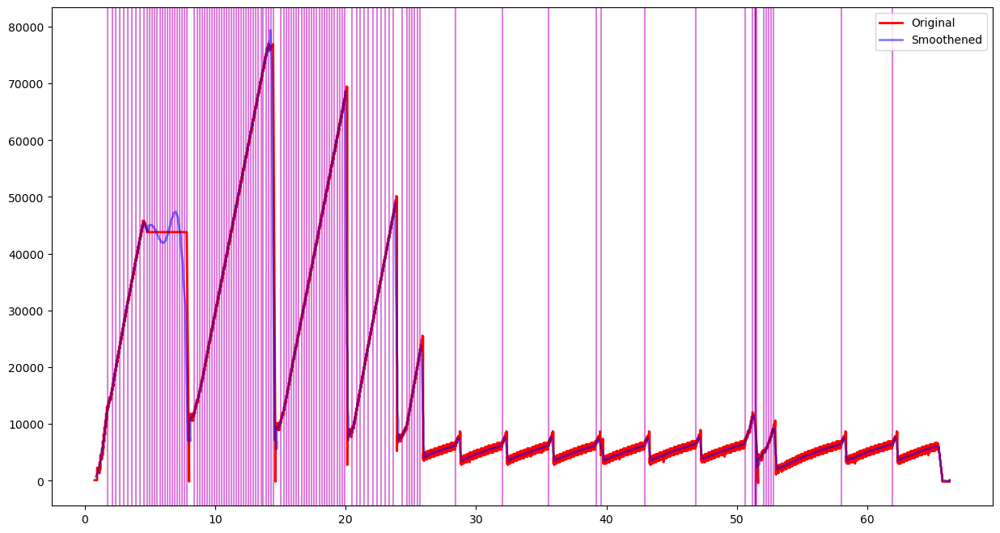

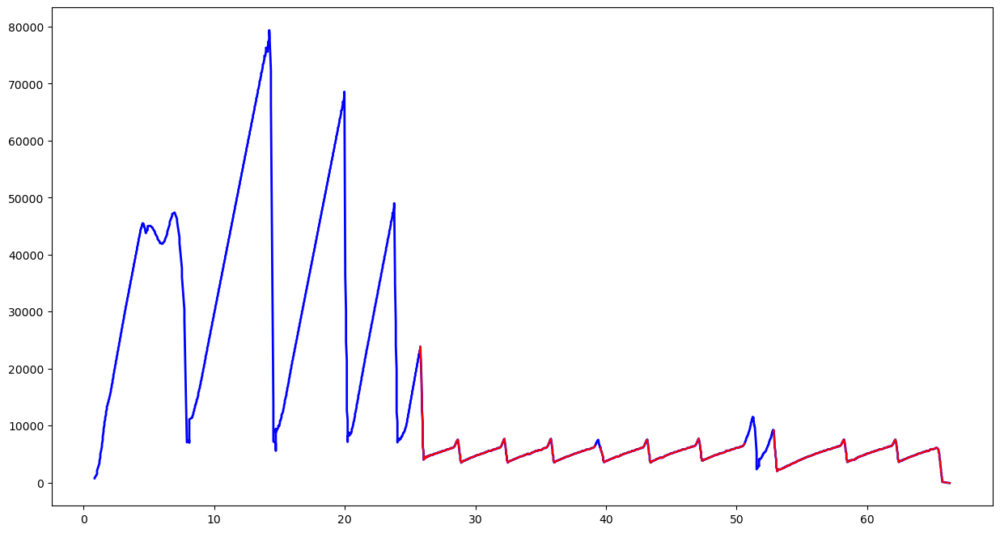

Feature Length  203


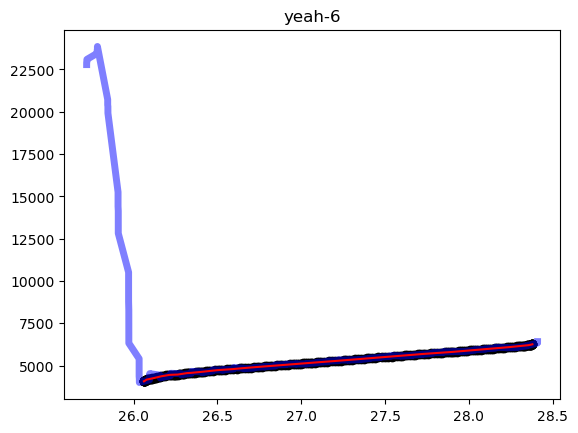

Name : yeah-61
Degree to fit 1


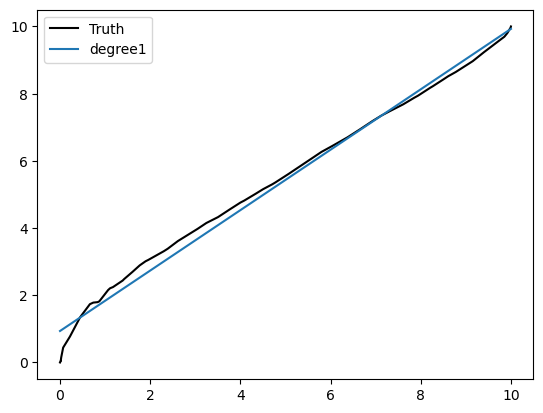

cubic-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46046', '46060'])
Port 46060


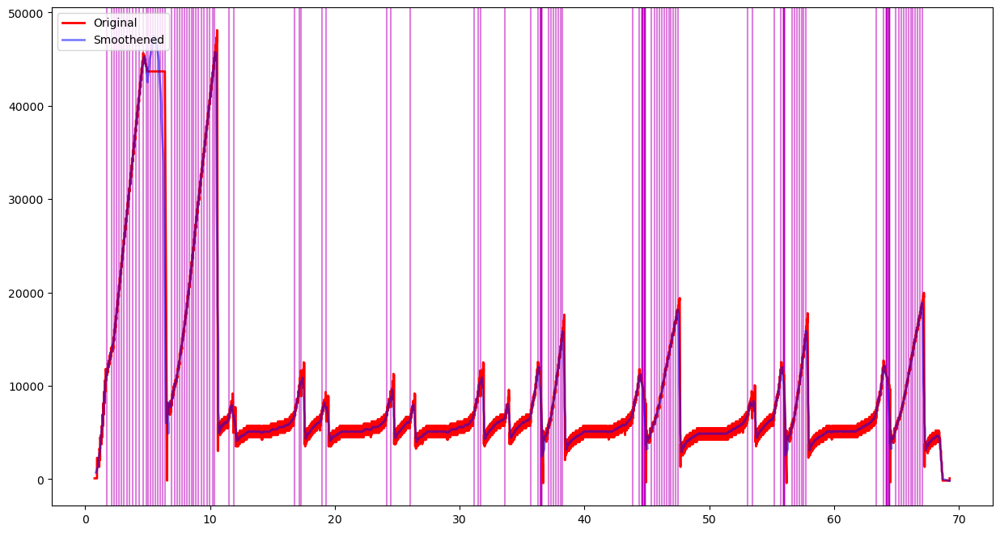

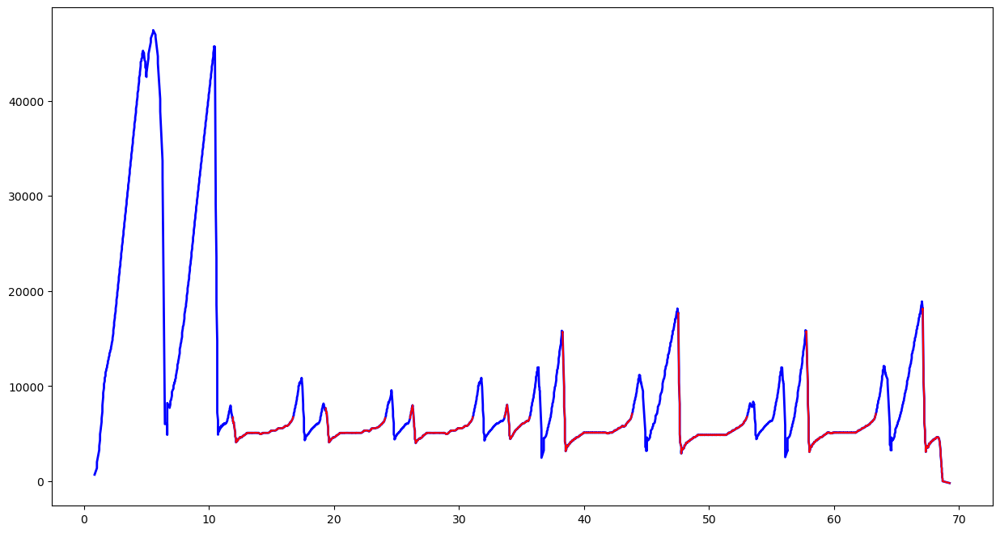

Feature Length  203


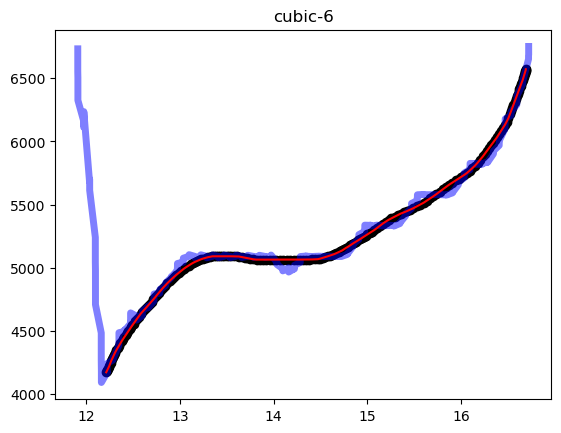

Name : cubic-61
Degree to fit 3


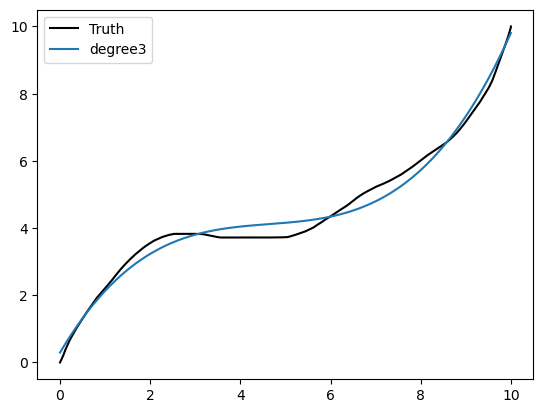

reno-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34520', '34526'])
Port 34526


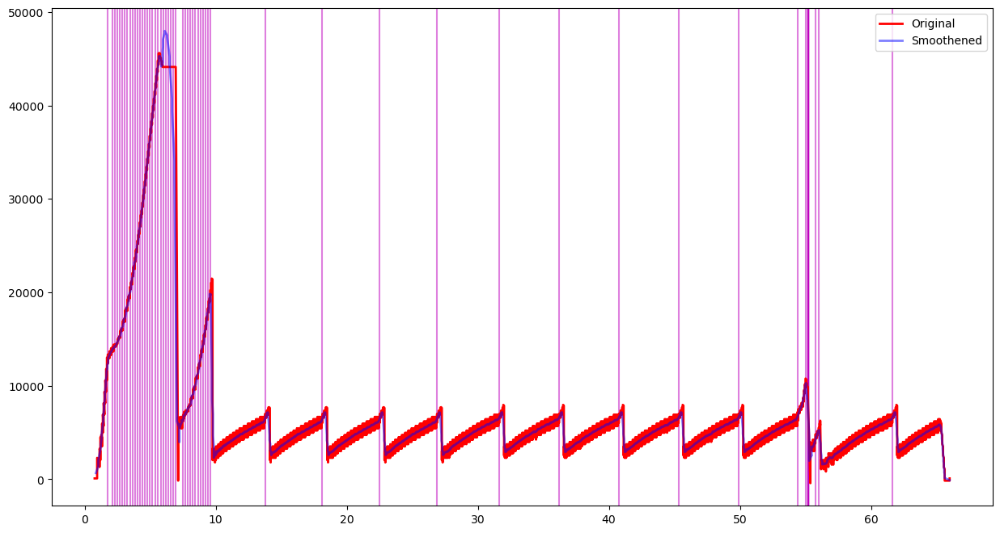

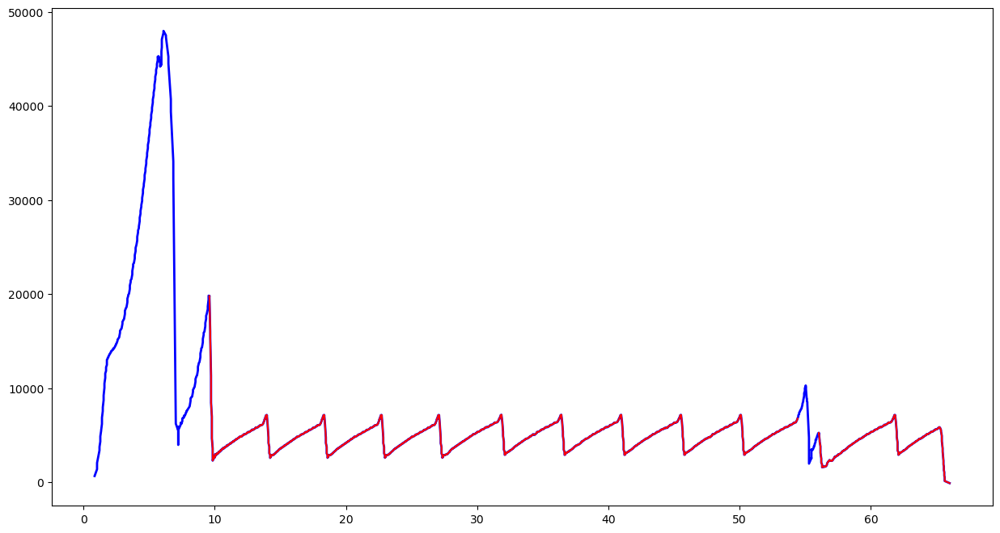

Feature Length  203


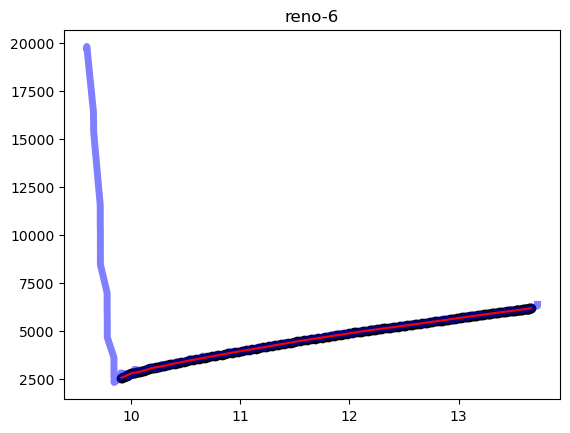

Name : reno-61
Degree to fit 2


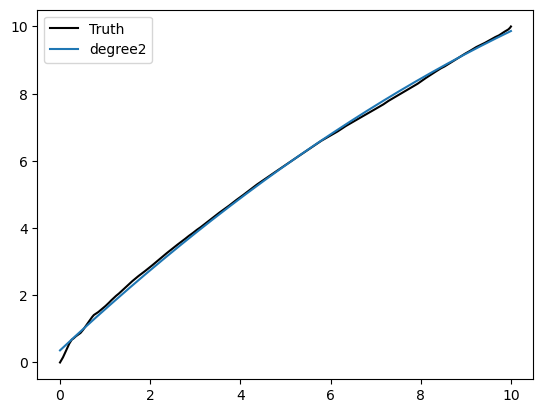

In [388]:
for cc in cc_degree:
    cc_mp = get_feature_degree([cc+"-6-0-50-200-2-aws-88-60"],ss=225,p="y",ft_thresh=1,max_deg=cc_degree[cc])

In [389]:
## Corrected version :
# CUBIC = VENO CUBIC VEGAS CUBICQ
# QUADRATIC = DCTCP HIGHSPEED LP WESTWOOD RENO HTCP
# Linear = BIC SCALABLE YEAH 
# Problem with NV 
# Problem with VEGAS

### Getting the gaussian paramters according to the cc

In [390]:
def getCCcoeff(ccs,cc_degree,present_files,ss=225,p="n",ft_thresh=1):
    cc_coeff = {}
    for v in ccs: 
        files = []
        for f in present_files:
            curr_cc = f.split("-")[0]
            if v == curr_cc :
                files.append(f)
        degree = cc_degree[v]
        if len(files) > 0 :
            cc_mp = get_feature_degree(files,ss=ss,p=p,ft_thresh=ft_thresh,max_deg=degree)
            coeff = getCC(files, cc_mp,p=p)
#             print(v)
#             print(files)
            cc_coeff[v] = coeff[v]
        #     getRed(files,p="y")
    return cc_coeff 

In [391]:
def getCoeff(cc_coeff):
    vals = {}
    degree = 0
    for cc in cc_coeff:
        coeff = cc_coeff[cc]
        if cc not in vals :
            vals[cc] = {}
        for trace in coeff:
            i = 1
            for feature in trace:
                if i not in vals[cc]:
                    vals[cc][i] = []
                vals[cc][i].append(feature)
                i+=1
    return vals

In [392]:
def getGaussianParams(vals):
    cc_gaussian_params = {}
    for cc in vals :
        # Taking the first feature only
        if len(list(vals[cc].keys()))==0 :
            continue
        data = vals[cc][1]
        n = 0
        cc_coeff_mean = np.mean(data,axis=0)
        # OGb
#         coeff_var = np.cov(data, rowvar=False)
#         iden = np.identity(len(cc_coeff_mean))
#         cc_coeff_var = coeff_var * iden
        #TRY
        cc_coeff_var = np.cov(data,rowvar=False)
        cc_gaussian_params[cc] = {
            'mean' : cc_coeff_mean,
            'covar' : cc_coeff_var
        }
    return cc_gaussian_params

In [393]:
def train(var,cc_degree,present_files,ss=225):
    cc_coeff = getCCcoeff(var,cc_degree,present_files,ss=ss,ft_thresh=1)
    vals = getCoeff(cc_coeff)
    cc_gaussian_params = getGaussianParams(vals)
    return vals, cc_gaussian_params

In [394]:
cc_degree

{'bic': 1,
 'dctcp': 2,
 'highspeed': 2,
 'htcp': 3,
 'lp': 2,
 'nv': 3,
 'scalable': 1,
 'vegas': 3,
 'veno': 3,
 'westwood': 2,
 'yeah': 1,
 'cubic': 3,
 'reno': 2}

In [395]:
# Saving the cc_gaussian_params:
import pickle
with open("cc_degree_new.txt",'wb') as f:
    pickle.dump(cc_degree,f)

### Getting corrrect training files 


Use mahalonobis distance to det the files that have the features correctly descibed. This reduce undue variance within the model

In [221]:
def is_pos_def(A):
    if np.allclose(A, A.T):
        try:
            np.linalg.cholesky(A)
            return True
        except np.linalg.LinAlgError:
            return False
    else:
        return False 

from scipy.stats import chi2

In [204]:
dont_use_ind = {}
for cc in ccs:
    temp_check = []
    for i in range(1,151):
        temp_check.append(cc+"-"+str(i)+"-0-50-200-2-aws-88-60")
    cc_mp = get_feature_degree(temp_check, ss=225,p="n",ft_thresh=1,max_deg=cc_degree[cc])
    x = []
    for key in cc_mp.keys():
        x.append(cc_mp[key][0]['coeff'])
    x = np.array(x)
    x_mean = x.mean(axis=0)
    if cc_degree[cc] == 1:
        x_covar = np.array([[np.cov(x, rowvar=False)]])
    else :
        x_covar = np.cov(x, rowvar=False)
    x_covar_inv = np.linalg.inv(x_covar)
#     print(x_mean)
#     print(x_covar)
#     print(is_pos_def(x_covar))
#     print(is_pos_def(x_covar_inv))
    x_diff = x - x_mean
    md = []
    for i in range(len(x_diff)):
        md.append(x_diff[i].dot(x_covar_inv).dot(x_diff[i]))
    p = 1 - chi2.cdf(md, 4)
    ind = []
    thresh = 0.05
    for i in range(len(md)):
        if p[i] < thresh:
            print(red)
            ind.append(i)
        print(i,md[i],p[i],p[i]<thresh)
        print(black)
    dont_use_ind[cc] = ind


bic-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56518', '56520'])
Port 56520
Feature Length  203
bic-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42624', '42626'])
Port 42626
Feature Length  203
bic-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58296', '48886'])
Port 48886
Feature Length  203
bic-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52340', '52350'])
Port 52350
Feature Length  203
bic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-5-0-50-200-2-aws-88-60-tcp.csv...

All Ports :  dict_keys(['44184', '44188'])
Port 44188
Feature Length  203
bic-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56500', '56510'])
Port 56510
Feature Length  203
bic-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48326', '48330'])
Port 48330
Feature Length  203
bic-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58644', '58652'])
Port 58652
Feature Length  203
bic-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33766', '33780'])
Port 33780
Feature Length  203
bic-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-44-

All Ports :  dict_keys(['41128', '41134'])
Port 41134
Feature Length  203
bic-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53162', '53168'])
Port 53168
Feature Length  203
bic-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36520', '36528'])
Port 36528
Feature Length  203
bic-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51634', '51642'])
Port 51642
Feature Length  203
bic-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48870', '48878'])
Port 48878
Feature Length  203
bic-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-82-

All Ports :  dict_keys(['58804', '58808'])
Port 58808
Feature Length  203
bic-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53404', '53416'])
Port 53416
Feature Length  203
bic-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51966', '51978'])
Port 51978
Feature Length  203
bic-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36352', '36362'])
Port 36362
Feature Length  203
bic-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35430', '35440'])
Port 35440
Feature Length  203
bic-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

0 0.017741690041912322 0.9999608859699407 False

1 0.3711183703027241 0.9847724933917688 False

2 1.0637855130022962 0.8999746435240635 False

3 0.004235142778327865 0.9999977611083339 False

4 1.7583722585578299 0.7800889275421774 False

5 0.14288676146137008 0.9975662789887919 False

6 0.3451303603801809 0.9867176300222913 False

7 0.17764959146946763 0.9962810821807349 False


8 10.479891545115521 0.03307510876638042 True

9 0.20300504489399268 0.9951842877260597 False

10 0.21820840569553637 0.9944638435049832 False


11 9.766455171445408 0.044550938223708814 True

12 0.19933877927353777 0.9953510301862077 False

13 0.08613087787798145 0.9990988824348681 False

14 0.08795285396068428 0.9990609239126278 False

15 0.23559172368697434 0.9935835776680568 False

16 0.025934701141756257 0.9999166472168064 False

17 0.22958034234893104 0.9938947420333093 False

18 0.2846755463791178 0.9907818180453346 False

19 0.3548113507646787 0.9860065932704868 False

20 0.3651433024755456 0.985229944

All Ports :  dict_keys(['60724', '60738'])
Port 60738
Feature Length  203
dctcp-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56526', '56536'])
Port 56536
Feature Length  203
dctcp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57982', '57990'])
Port 57990
Feature Length  203
dctcp-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50810', '50822'])
Port 50822
Feature Length  203
dctcp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48420', '48426'])
Port 48426
Feature Length  203
dctcp-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['54408', '54416'])
Port 54416
Feature Length  203
dctcp-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35982', '35986'])
Port 35986
Feature Length  203
dctcp-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42874', '42888'])
Port 42888
Feature Length  203
dctcp-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34714', '34724'])
Port 34724
Feature Length  203
dctcp-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50234', '50236'])
Port 50236
Feature Length  203
dctcp-44-0-50-200-2-aws-88-60


All Ports :  dict_keys(['33496', '33504'])
Port 33504
Feature Length  203
dctcp-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42194', '42210'])
Port 42210
Feature Length  203
dctcp-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33586', '33594'])
Port 33594
Feature Length  203
dctcp-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39630', '39640'])
Port 39640
Feature Length  203
dctcp-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50134', '50142'])
Port 50142
Feature Length  203
dctcp-81-0-50-200-2-aws-88-60


All Ports :  dict_keys(['51336', '51346'])
Port 51346
Feature Length  203
dctcp-114-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48998', '49014'])
Port 49014
Feature Length  203
dctcp-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51704', '51714'])
Port 51714
Feature Length  203
dctcp-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34646', '34648'])
Port 34648
Feature Length  203
dctcp-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57328', '57334'])
Port 57334
Feature Length  203
dctcp-118-0-50-200

All Ports :  dict_keys(['48706', '48716'])
Port 48716
Feature Length  203
Name : dctcp-11
Degree to fit 2
Name : dctcp-21
Degree to fit 2
Name : dctcp-31
Degree to fit 2
Name : dctcp-41
Degree to fit 2
Name : dctcp-51
Degree to fit 2
Name : dctcp-61
Degree to fit 2
Name : dctcp-71
Degree to fit 2
Name : dctcp-81
Degree to fit 2
Name : dctcp-91
Degree to fit 2
Name : dctcp-101
Degree to fit 2
Name : dctcp-111
Degree to fit 2
Name : dctcp-121
Degree to fit 2
Name : dctcp-131
Degree to fit 2
Name : dctcp-141
Degree to fit 2
Name : dctcp-151
Degree to fit 2
Name : dctcp-161
Degree to fit 2
Name : dctcp-171
Degree to fit 2
Name : dctcp-181
Degree to fit 2
Name : dctcp-191
Degree to fit 2
Name : dctcp-201
Degree to fit 2
Name : dctcp-211
Degree to fit 2
Name : dctcp-221
Degree to fit 2
Name : dctcp-231
Degree to fit 2
Name : dctcp-241
Degree to fit 2
Name : dctcp-251
Degree to fit 2
Name : dctcp-261
Degree to fit 2
Name : dctcp-271
Degree to fit 2
Name : dctcp-281
Degree to fit 2
Name : dctc

All Ports :  dict_keys(['54674', '54676'])
Port 54676
Feature Length  203
highspeed-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40538', '40544'])
Port 40544
Feature Length  203
highspeed-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33546', '33558'])
Port 33558
Feature Length  203
highspeed-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37424', '37434'])
Port 37434
Feature Length  203
highspeed-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46360', '46364'])
Port 46364
Feature Length

All Ports :  dict_keys(['34526', '60106'])
Port 60106
Feature Length  203
highspeed-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52568', '52572'])
Port 52572
Feature Length  203
highspeed-38-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55648', '55656'])
Port 55656
Feature Length  203
highspeed-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33794', '33802'])
Port 33802
Feature Length  203
highspeed-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53878', '57200'])
Port 57200
Fe

Feature Length  203
highspeed-72-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39646', '39654'])
Port 39654
Feature Length  203
highspeed-73-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-73-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-73-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40524', '40534'])
Port 40534
Feature Length  203
highspeed-74-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-74-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-74-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34486', '34498'])
Port 34498
Feature Length  203
highspeed-75-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51446', '51454'])
Port 51454
Feature Length  203
highspeed-76-0-50-200-2-aws-88-60
RT

All Ports :  dict_keys(['38782', '38786'])
Port 38786
Feature Length  203
highspeed-107-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-107-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-107-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56916', '56918'])
Port 56918
Feature Length  203
highspeed-108-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-108-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-108-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46536', '46552'])
Port 46552
Feature Length  203
highspeed-109-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-109-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-109-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36448', '36456'])
Port 36456
Feature Length  203
highspeed-110-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-110-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45358', '33364'])
P

All Ports :  dict_keys(['35474', '35484'])
Port 35484
Feature Length  203
highspeed-142-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-142-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-142-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35420', '35434'])
Port 35434
Feature Length  203
highspeed-143-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-143-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-143-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54616', '38136'])
Port 38136
Feature Length  203
highspeed-144-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-144-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-144-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46482', '46494'])
Port 46494
Feature Length  203
highspeed-145-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-145-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-145-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38366', '38374'])
P

All Ports :  dict_keys(['40828', '40842'])
Port 40842
Feature Length  203
htcp-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58592', '58600'])
Port 58600
Feature Length  203
htcp-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58010', '58012'])
Port 58012
Feature Length  203
htcp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36498', '36502'])
Port 36502
Feature Length  203
htcp-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51246', '51252'])
Port 51252
Feature Length  203
htcp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-6-

All Ports :  dict_keys(['57904', '57908'])
Port 57908
Feature Length  203
htcp-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58198', '58204'])
Port 58204
Feature Length  203
htcp-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51426', '51434'])
Port 51434
Feature Length  203
htcp-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43944', '43952'])
Port 43952
Feature Length  203
htcp-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39388', '39404'])
Port 39404
Feature Length  203
htcp-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['41868', '41876'])
Port 41876
Feature Length  203
htcp-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39078', '39086'])
Port 39086
Feature Length  203
htcp-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55684', '55692'])
Port 55692
Feature Length  203
htcp-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53178', '53180'])
Port 53180
Feature Length  203
htcp-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60390', '60392'])
Port 60392
Feature Length  203
htcp-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['48530', '48542'])
Port 48542
Feature Length  203
htcp-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48644', '48656'])
Port 48656
Feature Length  203
htcp-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39080', '39088'])
Port 39088
Feature Length  203
htcp-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50206', '50208'])
Port 50208
Feature Length  203
htcp-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53036', '53046'])
Port 53046
Feature Length  203
htcp-119-0-50-200-2-aws-88-60


All Ports :  dict_keys(['52074', '53888'])
Port 53888
Feature Length  203
lp-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40290', '40302'])
Port 40302
Feature Length  203
lp-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42098', '42106'])
Port 42106
Feature Length  203
lp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37930', '41328'])
Port 41328
Feature Length  203
lp-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42846', '42858'])
Port 42858
Feature Length  203
lp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-6-0-50-200-2-aws-88-60
Reading

All Ports :  dict_keys(['53056', '53058'])
Port 53058
Feature Length  203
lp-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42304', '42320'])
Port 42320
Feature Length  203
lp-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40006', '40008'])
Port 40008
Feature Length  203
lp-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40040', '40044'])
Port 40044
Feature Length  203
lp-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39958', '39974'])
Port 39974
Feature Length  203
lp-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-45-0-50-200-2-aws

All Ports :  dict_keys(['49406', '49414'])
Port 49414
Feature Length  203
lp-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39370', '39384'])
Port 39384
Feature Length  203
lp-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36970', '36978'])
Port 36978
Feature Length  203
lp-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40490', '40504'])
Port 40504
Feature Length  203
lp-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38952', '38956'])
Port 38956
Feature Length  203
lp-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-84-0-50-200-2-aws

All Ports :  dict_keys(['43356', '43366'])
Port 43366
Feature Length  203
lp-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40884', '40898'])
Port 40898
Feature Length  203
lp-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43728', '43742'])
Port 43742
Feature Length  203
lp-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54076', '54092'])
Port 54092
Feature Length  203
lp-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57062', '57066'])
Port 57066
Feature Length  203
lp-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-122-

All Ports :  dict_keys(['40828', '40834'])
Port 40834
Feature Length  203
nv-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43298', '43308'])
Port 43308
Feature Length  203
nv-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44606', '36648'])
Port 36648
Feature Length  203
nv-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46792', '46798'])
Port 46798
Feature Length  203
nv-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35556', '35568'])
Port 35568
Feature Length  203
nv-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-6-0-50-200-2-aws-88-60
Reading

All Ports :  dict_keys(['60074', '60078'])
Port 60078
Feature Length  203
nv-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33588', '33592'])
Port 33592
Feature Length  203
nv-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42558', '42572'])
Port 42572
Feature Length  203
nv-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51088', '51098'])
Port 51098
Feature Length  203
nv-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53338', '53354'])
Port 53354
Feature Length  203
nv-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-45-0-50-200-2-aws

All Ports :  dict_keys(['37278', '37292'])
Port 37292
Feature Length  203
nv-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34522', '34536'])
Port 34536
Feature Length  203
nv-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40354', '40370'])
Port 40370
Feature Length  203
nv-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60192', '60198'])
Port 60198
Feature Length  203
nv-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45922', '45926'])
Port 45926
Feature Length  203
nv-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-84-0-50-200-2-aws

All Ports :  dict_keys(['59236', '59238'])
Port 59238
Feature Length  203
nv-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42878', '42892'])
Port 42892
Feature Length  203
nv-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50396', '50406'])
Port 50406
Feature Length  203
nv-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42492', '42496'])
Port 42496
Feature Length  203
nv-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55214', '55226'])
Port 55226
Feature Length  203
nv-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-122-

All Ports :  dict_keys(['41182', '55988'])
Port 55988
Feature Length  203
scalable-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49106', '49110'])
Port 49110
Feature Length  203
scalable-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50910', '50914'])
Port 50914
Feature Length  203
scalable-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38722', '38736'])
Port 38736
scalable-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58562', '58564'])
Port 58564
Feature Length  203
scalable-6-0-50-200-2-aws-

All Ports :  dict_keys(['40976', '40978'])
Port 40978
scalable-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44038', '44052'])
Port 44052
scalable-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40638', '40640'])
Port 40640
Feature Length  203
scalable-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60816', '60820'])
Port 60820
Feature Length  203
scalable-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41066', '41072'])
Port 41072
Feature Length  203
scalable-43-0-50-200-2-aws-88-60
R

All Ports :  dict_keys(['56022', '56026'])
Port 56026
scalable-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47256', '47262'])
Port 47262
scalable-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39428', '39436'])
Port 39436
scalable-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58528', '58530'])
Port 58530
Feature Length  203
scalable-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57010', '34624'])
Port 34624
Feature Length  203
scalable-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
sc

All Ports :  dict_keys(['46864', '46872'])
Port 46872
scalable-114-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49062', '49066'])
Port 49066
Feature Length  203
scalable-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33436', '33448'])
Port 33448
Feature Length  203
scalable-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52970', '55662'])
Port 55662
Feature Length  203
scalable-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41722', '41736'])
Port 41736
scalable-118-0-50-200-

All Ports :  dict_keys(['54902', '54908'])
Port 54908
Feature Length  203
Name : scalable-11
Degree to fit 1
Name : scalable-21
Degree to fit 1
Name : scalable-31
Degree to fit 1
Name : scalable-51
Degree to fit 1
Name : scalable-61
Degree to fit 1
Name : scalable-131
Degree to fit 1
Name : scalable-141
Degree to fit 1
Name : scalable-151
Degree to fit 1
Name : scalable-161
Degree to fit 1
Name : scalable-211
Degree to fit 1
Name : scalable-221
Degree to fit 1
Name : scalable-231
Degree to fit 1
Name : scalable-241
Degree to fit 1
Name : scalable-271
Degree to fit 1
Name : scalable-331
Degree to fit 1
Name : scalable-351
Degree to fit 1
Name : scalable-361
Degree to fit 1
Name : scalable-371
Degree to fit 1
Name : scalable-401
Degree to fit 1
Name : scalable-411
Degree to fit 1
Name : scalable-421
Degree to fit 1
Name : scalable-441
Degree to fit 1
Name : scalable-461
Degree to fit 1
Name : scalable-481
Degree to fit 1
Name : scalable-491
Degree to fit 1
Name : scalable-541
Degree to f

All Ports :  dict_keys(['33406', '33420'])
Port 33420
Feature Length  203
vegas-14-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36122', '36134'])
Port 36134
Feature Length  203
vegas-15-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42904', '42920'])
Port 42920
Feature Length  203
vegas-16-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33022', '33024'])
Port 33024
Feature Length  203
vegas-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56868', '56872'])
Port 56872
Feature Length  203
vegas-18-0-50-200-2-aws-88-60


All Ports :  dict_keys(['52156', '52164'])
Port 52164
Feature Length  203
vegas-51-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36052', '36064'])
Port 36064
Feature Length  203
vegas-52-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-52-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47804', '47812'])
Port 47812
Feature Length  203
vegas-53-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-53-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-53-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36464', '54014'])
Port 54014
Feature Length  203
vegas-54-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-54-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-54-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34060', '34076'])
Port 34076
Feature Length  203
vegas-55-0-50-200-2-aws-88-60


All Ports :  dict_keys(['56320', '56324'])
Port 56324
Feature Length  203
vegas-88-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-88-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-88-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43294', '43310'])
Port 43310
Feature Length  203
vegas-89-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-89-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42126', '42142'])
Port 42142
Feature Length  203
vegas-90-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-90-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-90-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42068', '42084'])
Port 42084
Feature Length  203
vegas-91-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42078', '42088'])
Port 42088
Feature Length  203
vegas-92-0-50-200-2-aws-88-60


All Ports :  dict_keys(['34784', '34798'])
Port 34798
Feature Length  203
vegas-125-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-125-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-125-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46538', '46544'])
Port 46544
Feature Length  203
vegas-126-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-126-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-126-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58686', '58698'])
Port 58698
Feature Length  203
vegas-127-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55678', '55680'])
Port 55680
Feature Length  203
vegas-128-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-128-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-128-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42562', '42568'])
Port 42568
Feature Length  203
vegas-129-0-50-200

[ 0.0609384  -0.82034401  3.24287434]
[[ 3.71957234e-04 -4.14084338e-03  1.23934056e-02]
 [-4.14084338e-03  4.76893819e-02 -1.50484220e-01]
 [ 1.23934056e-02 -1.50484220e-01  5.14902064e-01]]
True
True
0 3.5712428976426525 0.46712870536701745 False

1 2.8145808441453717 0.5893184299785407 False

2 4.172749984782499 0.38313122219968276 False


3 12.055046451654587 0.01694658573443042 True

4 0.5100860666059888 0.9725117008664265 False

5 6.930719117059233 0.13959501210246084 False

6 2.1251713177886398 0.7127494741649237 False

7 1.0251241714130948 0.9059627149841358 False

8 1.8691992136781863 0.7598006191839645 False

9 5.631827299913525 0.22838247694614155 False

10 3.446956591268135 0.48598940918673683 False

11 5.154964816035566 0.2717634954411665 False

12 2.784484498727548 0.594513922916428 False

13 9.330728023881072 0.05334404849980123 False

14 0.6373051674403705 0.958829376212965 False

15 1.2570680034952355 0.8686163140523192 False

16 1.9424456453187124 0.7463439318910908 F

All Ports :  dict_keys(['44420', '44426'])
Port 44426
Feature Length  203
veno-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54516', '54532'])
Port 54532
Feature Length  203
veno-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39626', '39636'])
Port 39636
Feature Length  203
veno-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36424', '36430'])
Port 36430
Feature Length  203
veno-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42562', '42568'])
Port 42568
Feature Length  203
veno-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-6-

All Ports :  dict_keys(['39882', '39894'])
Port 39894
Feature Length  203
veno-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35002', '35012'])
Port 35012
Feature Length  203
veno-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49960', '49964'])
Port 49964
Feature Length  203
veno-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60824', '60834'])
Port 60834
Feature Length  203
veno-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58480', '58482'])
Port 58482
Feature Length  203
veno-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['43566', '43580'])
Port 43580
Feature Length  203
veno-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54788', '54800'])
Port 54800
Feature Length  203
veno-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50574', '50590'])
Port 50590
Feature Length  203
veno-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50910', '50926'])
Port 50926
Feature Length  203
veno-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47988', '47992'])
Port 47992
Feature Length  203
veno-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['58358', '58370'])
Port 58370
Feature Length  203
veno-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39456', '39468'])
Port 39468
Feature Length  203
veno-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39792', '39796'])
Port 39796
Feature Length  203
veno-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54452', '54462'])
Port 54462
Feature Length  203
veno-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51806', '51810'])
Port 51810
Feature Length  203
veno-119-0-50-200-2-aws-88-60


All Ports :  dict_keys(['53984', '53988'])
Port 53988
Feature Length  203
westwood-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39046', '39058'])
Port 39058
Feature Length  203
westwood-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58702', '58706'])
Port 58706
Feature Length  203
westwood-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54182', '54196'])
Port 54196
Feature Length  203
westwood-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40682', '41768'])
Port 41768
Feature Length  203
westwo

All Ports :  dict_keys(['39622', '39636'])
Port 39636
Feature Length  203
westwood-38-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48054', '48062'])
Port 48062
Feature Length  203
westwood-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48210', '48214'])
Port 48214
Feature Length  203
westwood-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60006', '60016'])
Port 60016
Feature Length  203
westwood-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33752', '34216'])
Port 34216
Feature Length

All Ports :  dict_keys(['33794', '33808'])
Port 33808
Feature Length  203
westwood-74-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-74-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-74-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56456', '56470'])
Port 56470
Feature Length  203
westwood-75-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33580', '33592'])
Port 33592
Feature Length  203
westwood-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34330', '34336'])
Port 34336
Feature Length  203
westwood-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38816', '38826'])
Port 38826
Feature Length

All Ports :  dict_keys(['57690', '57692'])
Port 57692
Feature Length  203
westwood-110-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-110-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38360', '38362'])
Port 38362
Feature Length  203
westwood-111-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55336', '55348'])
Port 55348
Feature Length  203
westwood-112-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-112-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-112-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39360', '39364'])
Port 39364
Feature Length  203
westwood-113-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-113-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-113-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55928', '55944'])
Port 55944
Fe

All Ports :  dict_keys(['44680', '44696'])
Port 44696
Feature Length  203
westwood-145-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-145-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-145-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54622', '54632'])
Port 54632
Feature Length  203
westwood-146-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-146-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-146-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56650', '56656'])
Port 56656
Feature Length  203
westwood-147-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-147-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-147-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48408', '48416'])
Port 48416
Feature Length  203
westwood-148-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46134', '46138'])
Port 46138
Fe

All Ports :  dict_keys(['48162', '48172'])
Port 48172
Feature Length  203
yeah-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45944', '45954'])
Port 45954
Feature Length  203
yeah-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51876', '51890'])
Port 51890
Feature Length  203
yeah-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42720', '42722'])
Port 42722
Feature Length  203
yeah-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50372', '50376'])
Port 50376
Feature Length  203
yeah-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-6-

All Ports :  dict_keys(['60944', '60946'])
Port 60946
Feature Length  203
yeah-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49524', '49536'])
Port 49536
Feature Length  203
yeah-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58376', '58392'])
Port 58392
Feature Length  203
yeah-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43586', '43588'])
Port 43588
Feature Length  203
yeah-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58090', '58094'])
Port 58094
Feature Length  203
yeah-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['58546', '58550'])
Port 58550
Feature Length  203
yeah-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['32836', '32844'])
Port 32844
Feature Length  203
yeah-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48904', '48908'])
Port 48908
Feature Length  203
yeah-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40784', '40792'])
Port 40792
Feature Length  203
yeah-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58490', '42868'])
Port 42868
Feature Length  203
yeah-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['59588', '59590'])
Port 59590
Feature Length  203
yeah-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46950', '46956'])
Port 46956
Feature Length  203
yeah-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39778', '39786'])
Port 39786
Feature Length  203
yeah-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59246', '59262'])
Port 59262
Feature Length  203
yeah-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40934', '40938'])
Port 40938
Feature Length  203
yeah-119-0-50-200-2-aws-88-60


All Ports :  dict_keys(['52000', '52006'])
Port 52006
Feature Length  203
cubic-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57896', '57912'])
Port 57912
Feature Length  203
cubic-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51890', '51898'])
Port 51898
Feature Length  203
cubic-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56316', '56326'])
Port 56326
Feature Length  203
cubic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54340', '54346'])
Port 54346
Feature Length  203
cubic-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['50060', '50072'])
Port 50072
Feature Length  203
cubic-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58568', '58578'])
Port 58578
Feature Length  203
cubic-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47388', '53964'])
Port 53964
Feature Length  203
cubic-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37964', '37966'])
Port 37966
Feature Length  203
cubic-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37312', '37314'])
Port 37314
Feature Length  203
cubic-43-0-50-200-2-aws-88-60


All Ports :  dict_keys(['33060', '33062'])
Port 33062
Feature Length  203
cubic-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34918', '34920'])
Port 34920
Feature Length  203
cubic-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43332', '43340'])
Port 43340
Feature Length  203
cubic-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44644', '44654'])
Port 44654
Feature Length  203
cubic-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40724', '40730'])
Port 40730
Feature Length  203
cubic-80-0-50-200-2-aws-88-60


All Ports :  dict_keys(['53216', '53218'])
Port 53218
Feature Length  203
cubic-113-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-113-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-113-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34592', '34598'])
Port 34598
Feature Length  203
cubic-114-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45010', '45022'])
Port 45022
Feature Length  203
cubic-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37492', '37504'])
Port 37504
Feature Length  203
cubic-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39288', '58088'])
Port 58088
Feature Length  203
cubic-117-0-50-200

All Ports :  dict_keys(['57648', '57662'])
Port 57662
Feature Length  203
cubic-150-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-150-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-150-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41418', '41424'])
Port 41424
Feature Length  203
Name : cubic-11
Degree to fit 3
Name : cubic-21
Degree to fit 3
Name : cubic-31
Degree to fit 3
Name : cubic-41
Degree to fit 3
Name : cubic-51
Degree to fit 3
Name : cubic-61
Degree to fit 3
Name : cubic-71
Degree to fit 3
Name : cubic-81
Degree to fit 3
Name : cubic-91
Degree to fit 3
Name : cubic-101
Degree to fit 3
Name : cubic-111
Degree to fit 3
Name : cubic-121
Degree to fit 3
Name : cubic-131
Degree to fit 3
Name : cubic-141
Degree to fit 3
Name : cubic-151
Degree to fit 3
Name : cubic-161
Degree to fit 3
Name : cubic-171
Degree to fit 3
Name : cubic-181
Degree to fit 3
Name : cubic-191
Degree to fit 3
Name : cubic-201
Degree to fit 3
Name : cubic-211
Degree to fit 3
Name : cubic-22

All Ports :  dict_keys(['48890', '48850'])
Port 48850
Feature Length  203
reno-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33176', '33186'])
Port 33186
Feature Length  203
reno-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59970', '59982'])
Port 59982
Feature Length  203
reno-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42216', '42224'])
Port 42224
Feature Length  203
reno-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35136', '35150'])
Port 35150
Feature Length  203
reno-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-6-

All Ports :  dict_keys(['55690', '55706'])
Port 55706
Feature Length  203
reno-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58358', '58372'])
Port 58372
Feature Length  203
reno-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55294', '55302'])
Port 55302
Feature Length  203
reno-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41356', '41358'])
Port 41358
Feature Length  203
reno-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53130', '46564'])
Port 46564
Feature Length  203
reno-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['43096', '43108'])
Port 43108
Feature Length  203
reno-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54774', '54790'])
Port 54790
Feature Length  203
reno-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37780', '37792'])
Port 37792
Feature Length  203
reno-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38700', '38712'])
Port 38712
Feature Length  203
reno-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47666', '47674'])
Port 47674
Feature Length  203
reno-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['37476', '37488'])
Port 37488
Feature Length  203
reno-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57880', '57892'])
Port 57892
Feature Length  203
reno-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60972', '60986'])
Port 60986
Feature Length  203
reno-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53796', '35486'])
Port 35486
Feature Length  203
reno-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42056', '42060'])
Port 42060
Feature Length  203
reno-119-0-50-200-2-aws-88-60


In [398]:
usable_ind = {}
unusable_ind = {}
for cc in dont_use_ind.keys():
    temp = []
    untemp = []
    for i in range(0,150):
        if i not in dont_use_ind[cc]:
            temp.append(i+1)
        else :
            untemp.append(i+1)
    usable_ind[cc] = temp
    unusable_ind[cc] = untemp
    print(cc, len(temp), len(dont_use_ind[cc]))

bic 146 4
dctcp 139 11
highspeed 141 9
htcp 140 10
lp 138 12
nv 149 1
scalable 149 1
vegas 144 6
veno 141 9
westwood 142 8
yeah 147 3
cubic 138 12
reno 142 8


In [399]:
import shutil
unusable_cubic_files = []
for i in unusable_ind['cubic']:
    unusable_cubic_files.append("cubic-"+str(i)+"-0-50-200-2-aws-88-60")
# cc_mp = get_feature_degree(unusable_cubic_files,ss=225,p="y",ft_thresh=1,max_deg=3)
i = 1
cubicQ = []
for f in unusable_cubic_files:
    cubicQ.append("cubicQ-"+str(i)+"-0-50-200-2-aws-88-60")
    i+=1

cubicQ-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59508', '59518'])
Port 59518


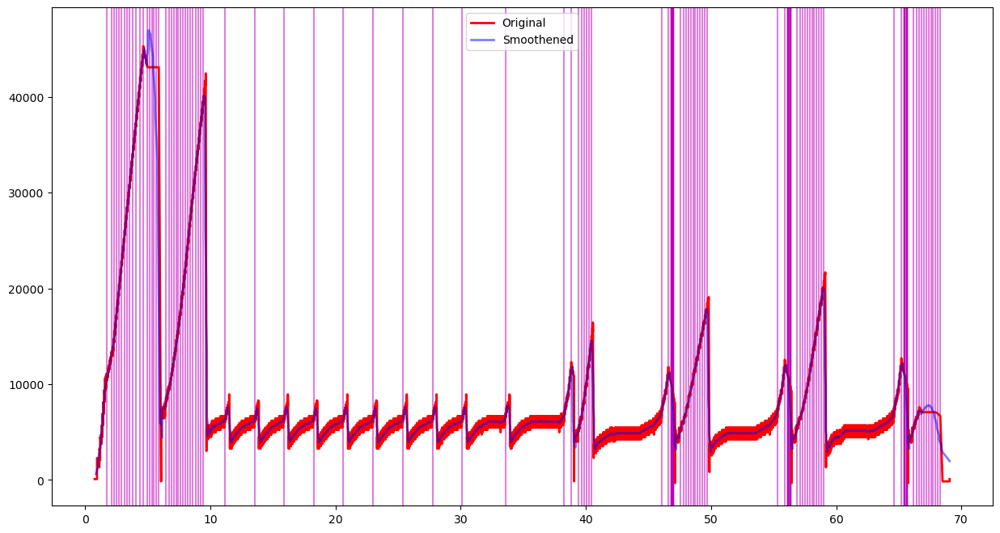

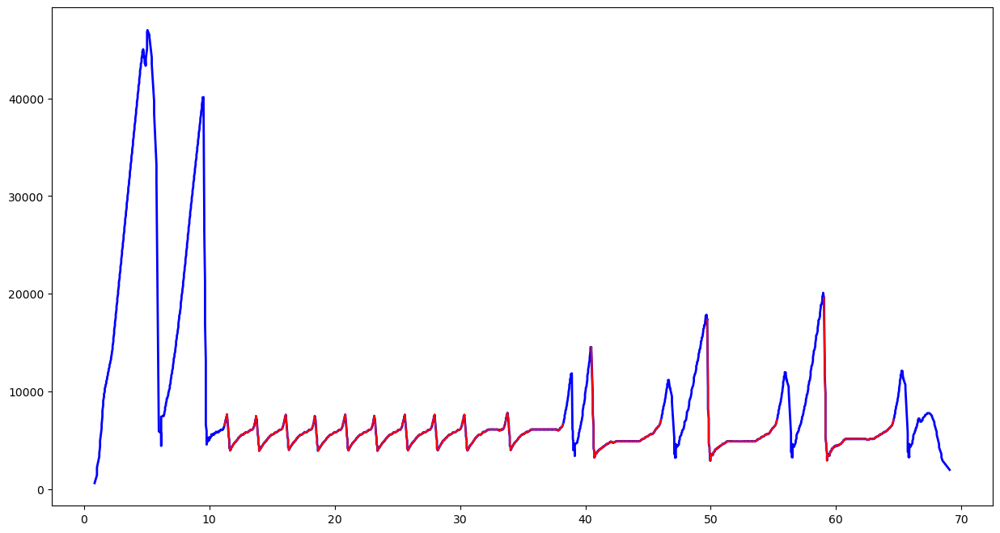

Feature Length  203


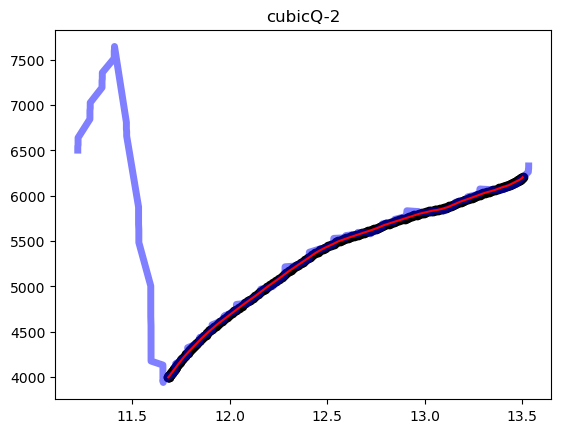

cubicQ-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37492', '37504'])
Port 37504


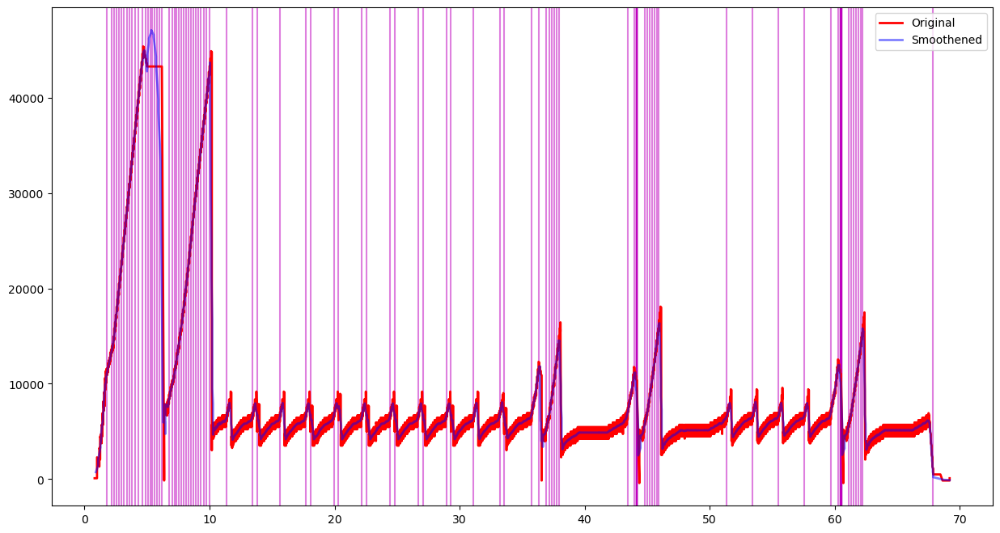

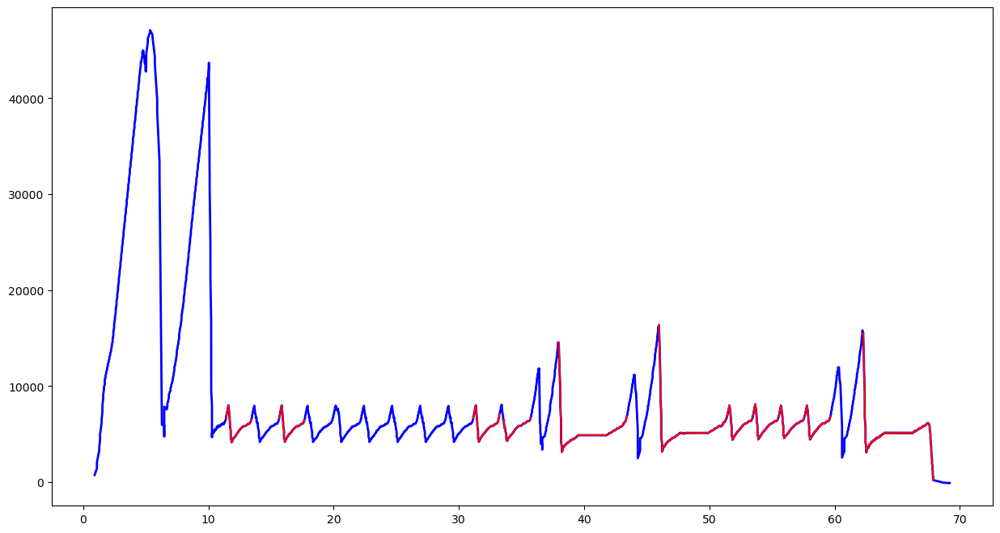

Feature Length  203


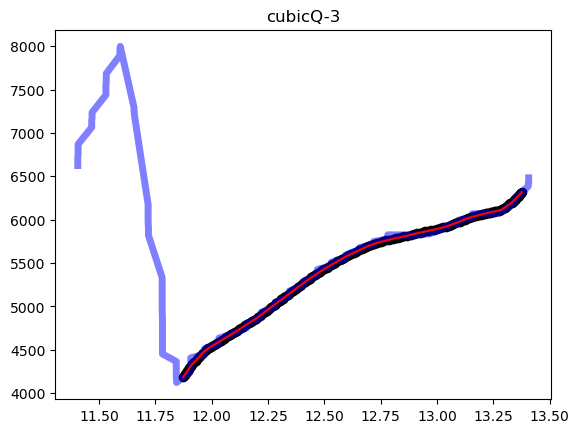

cubicQ-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56756', '56768'])
Port 56768


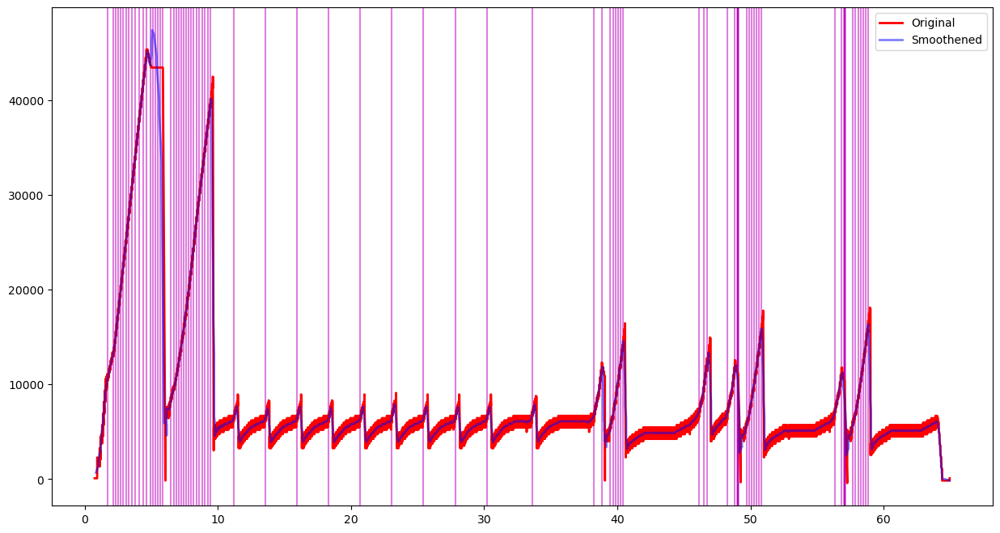

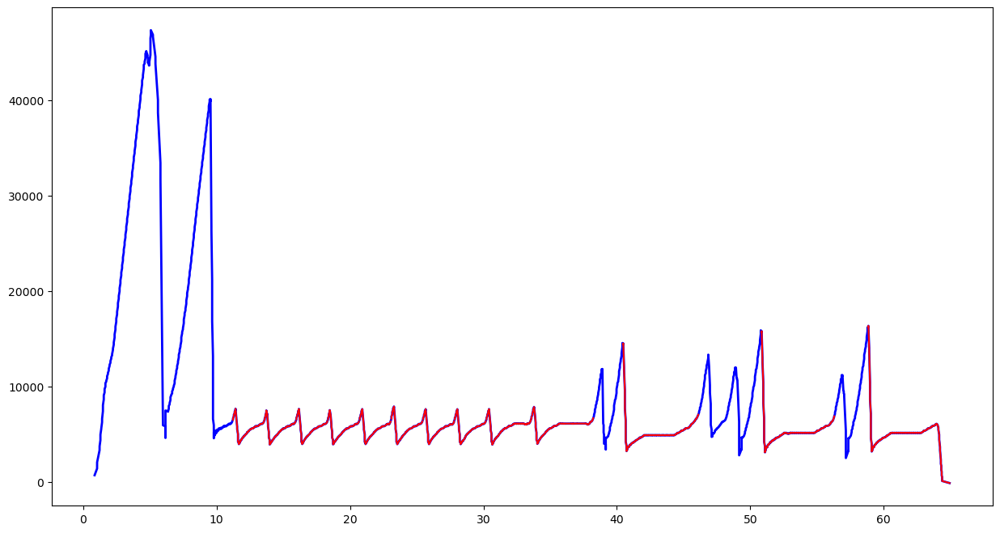

Feature Length  203


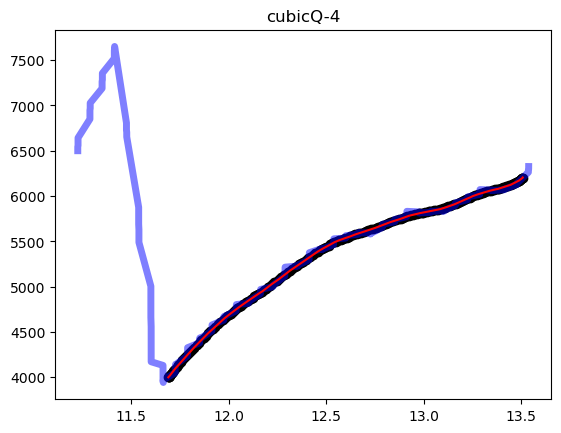

cubicQ-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56240', '56256'])
Port 56256


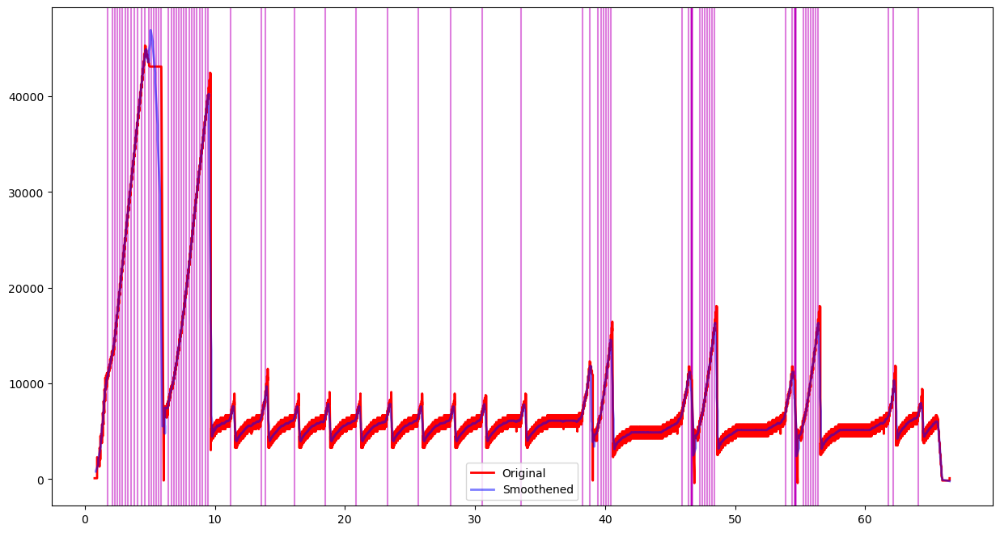

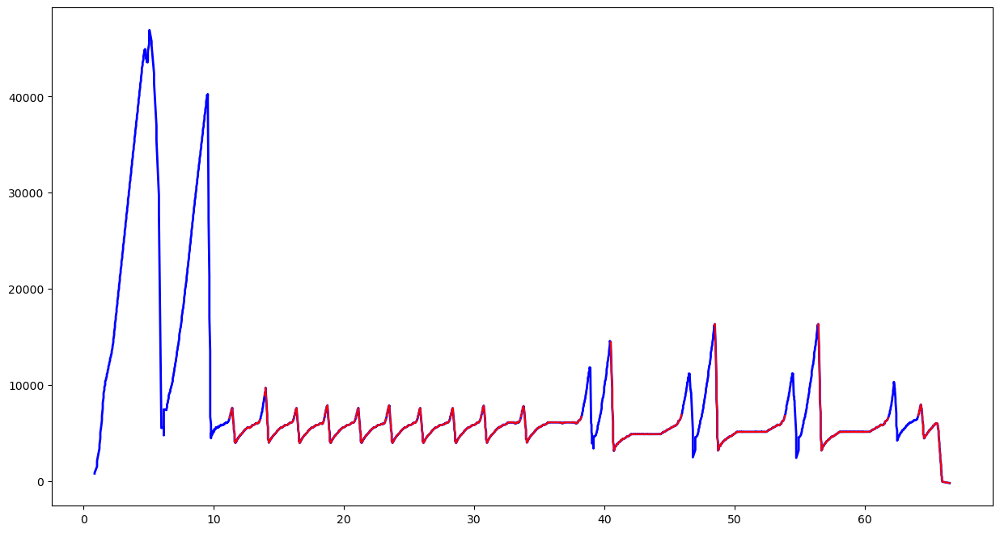

Feature Length  203


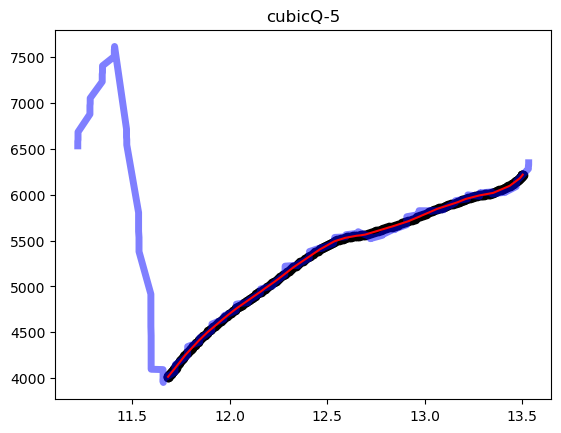

cubicQ-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51750', '51758'])
Port 51758


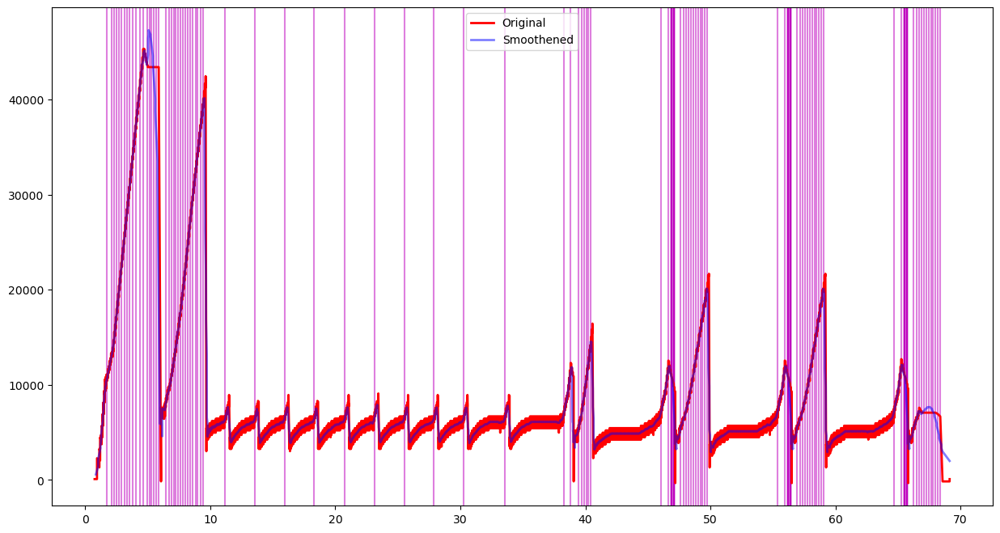

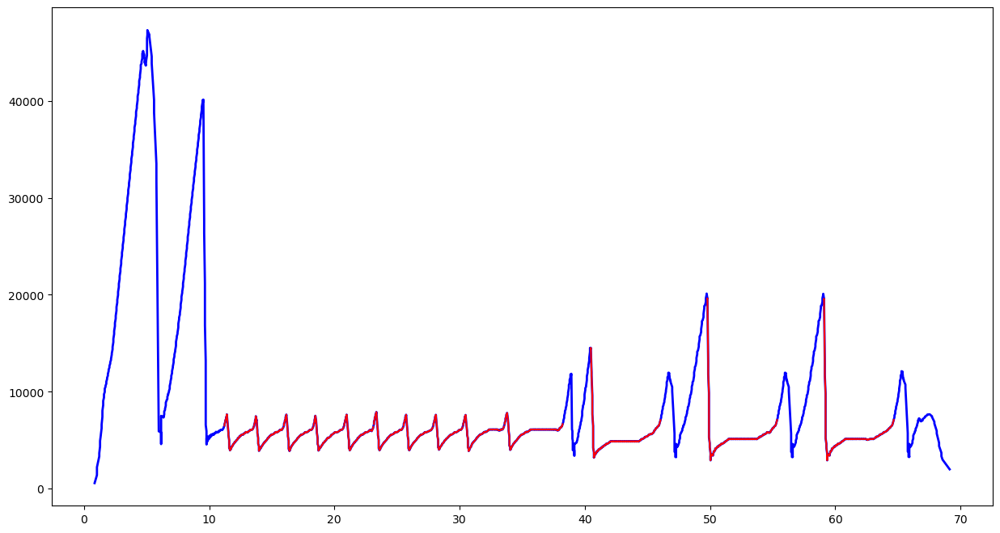

Feature Length  203


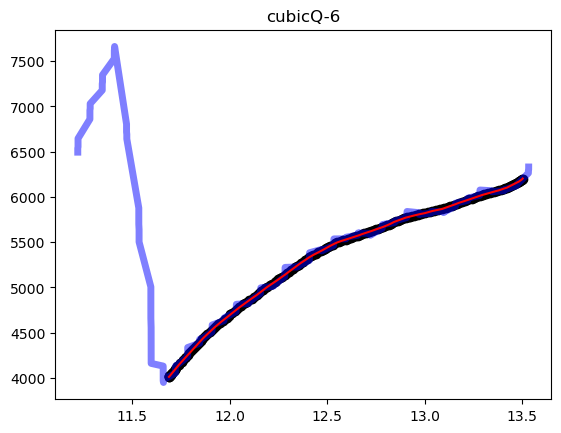

cubicQ-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-7-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54352', '54356'])
Port 54356


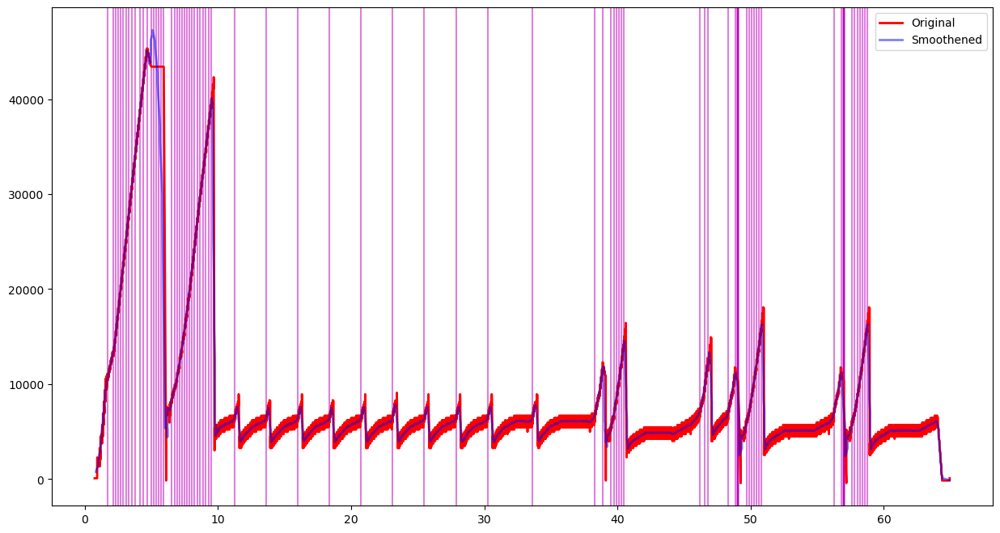

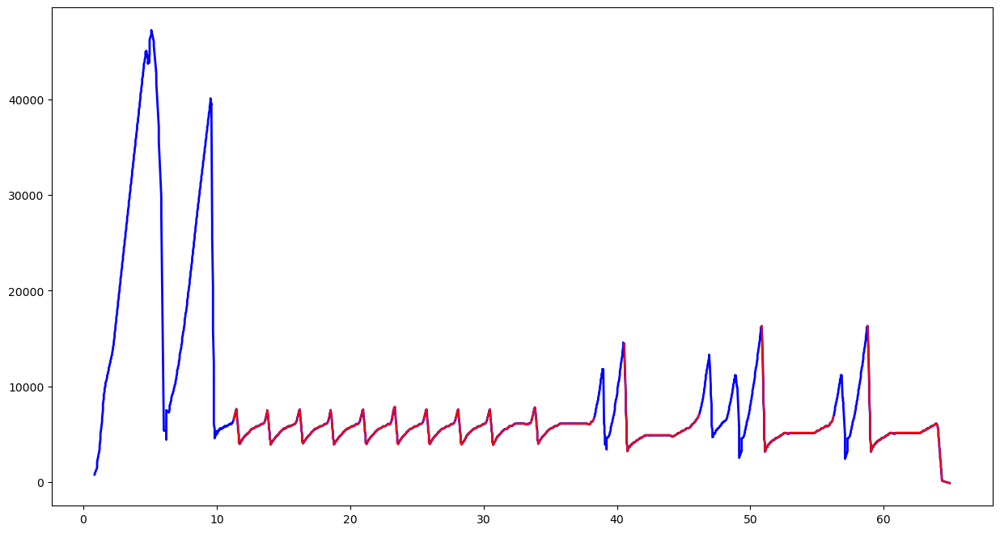

Feature Length  203


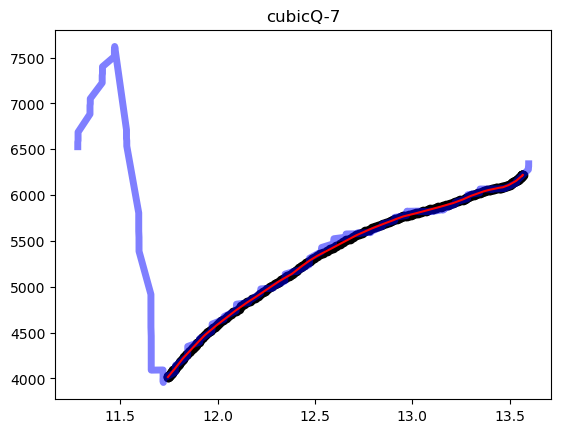

cubicQ-8-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37492', '37504'])
Port 37504


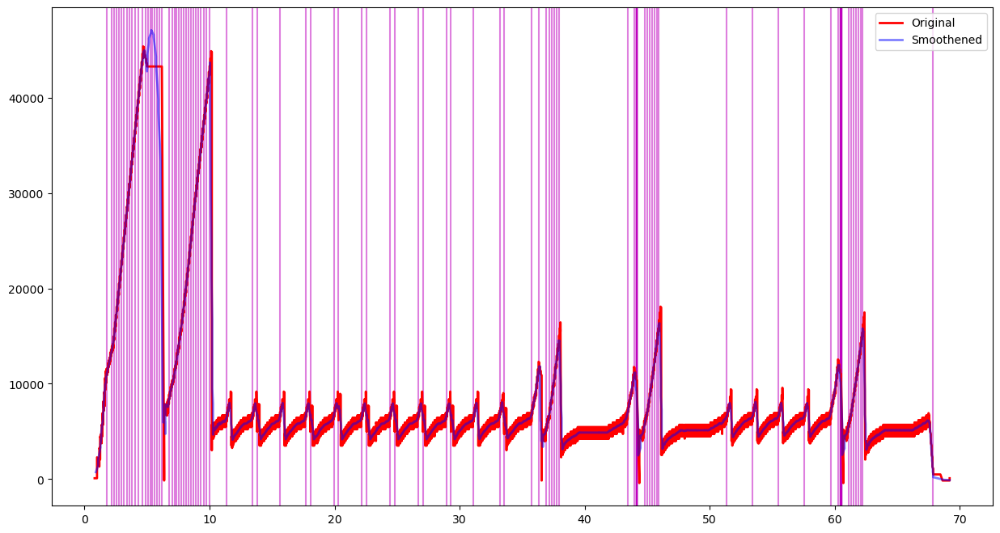

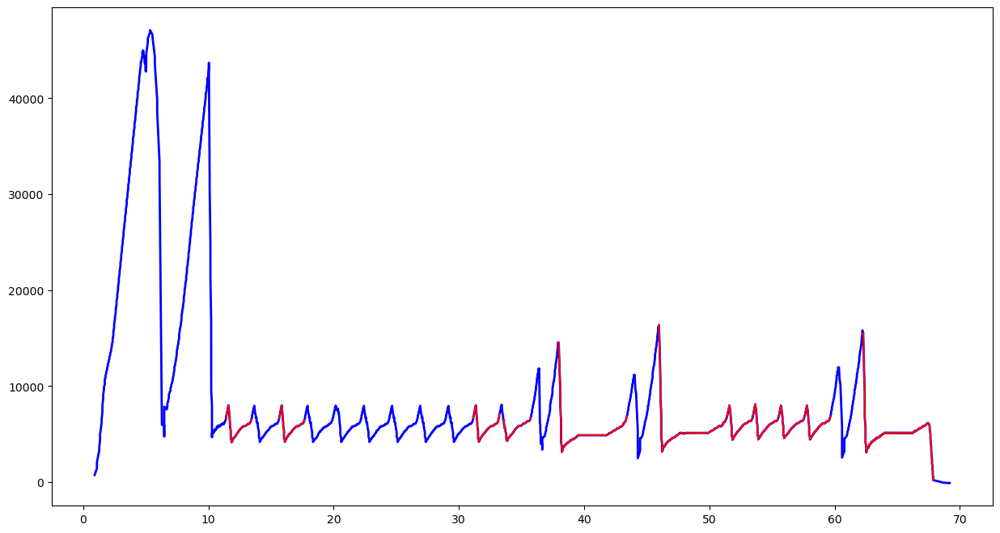

Feature Length  203


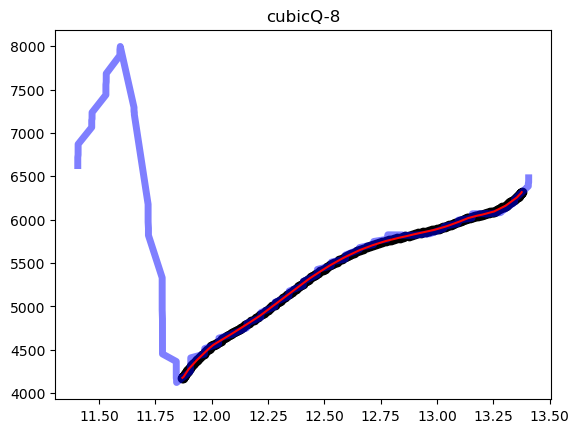

cubicQ-9-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-9-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-9-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56756', '56768'])
Port 56768


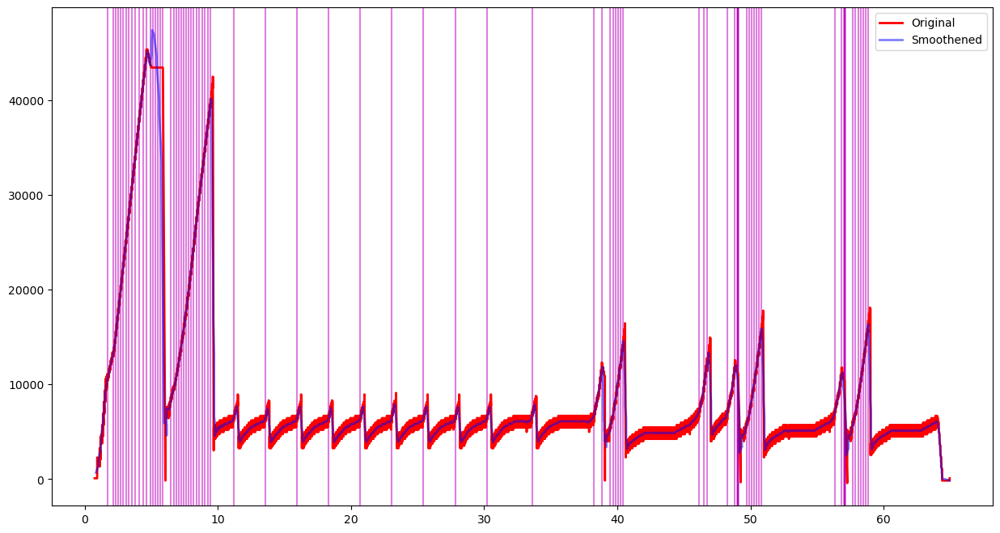

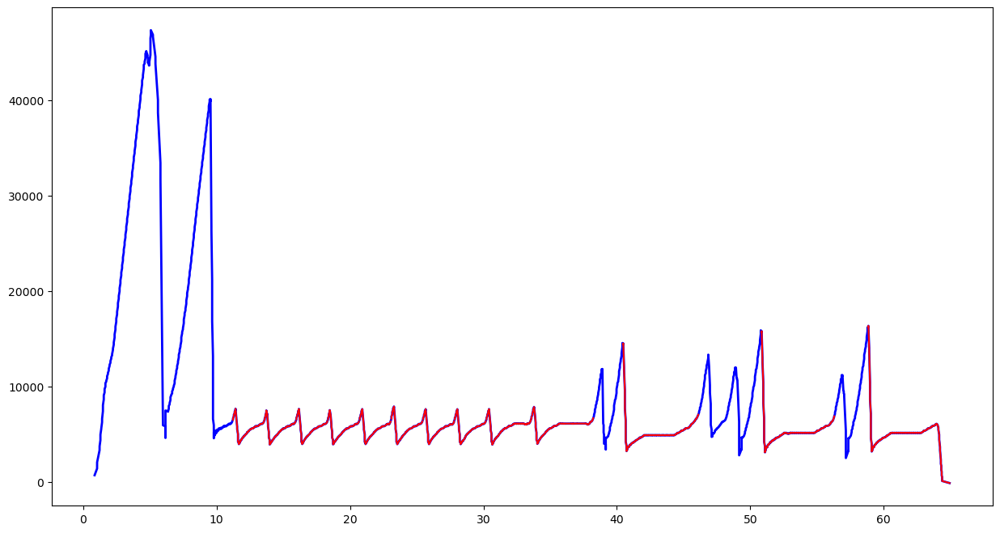

Feature Length  203


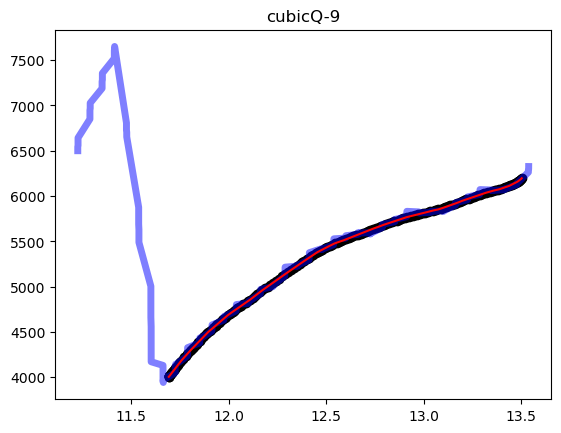

cubicQ-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56240', '56256'])
Port 56256


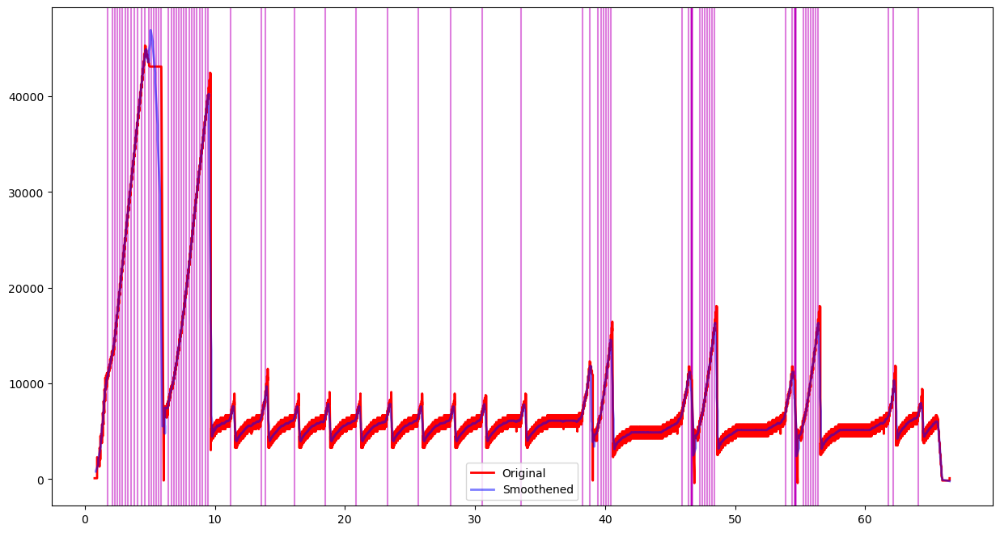

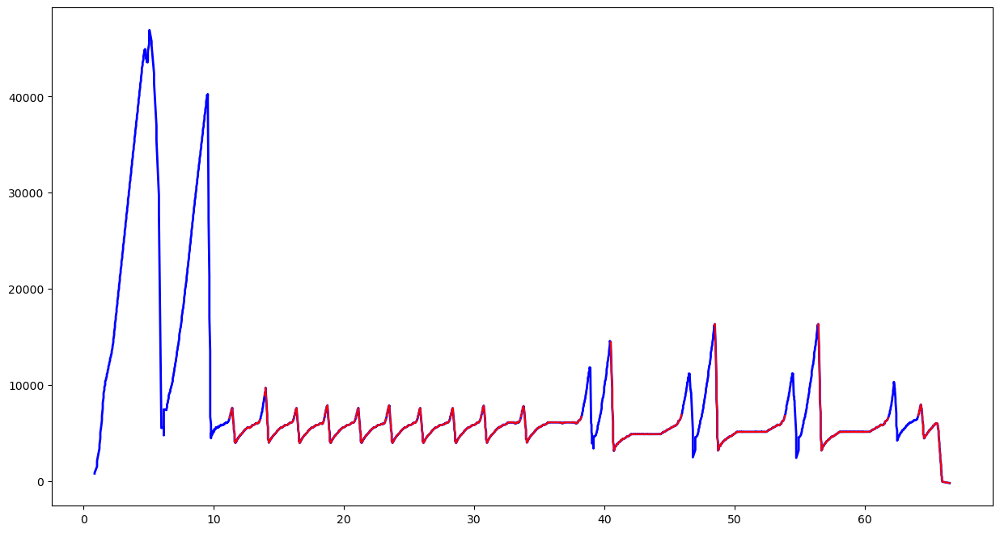

Feature Length  203


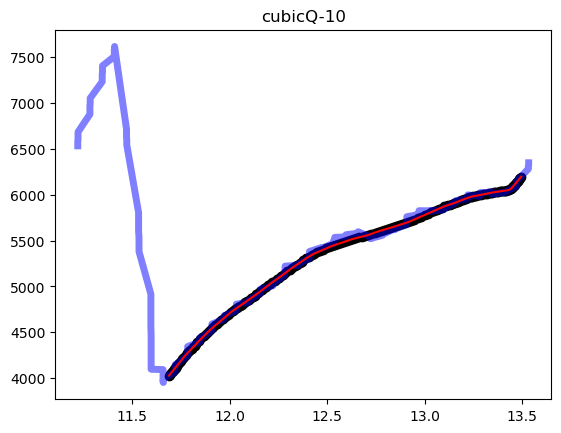

cubicQ-11-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-11-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-11-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51750', '51758'])
Port 51758


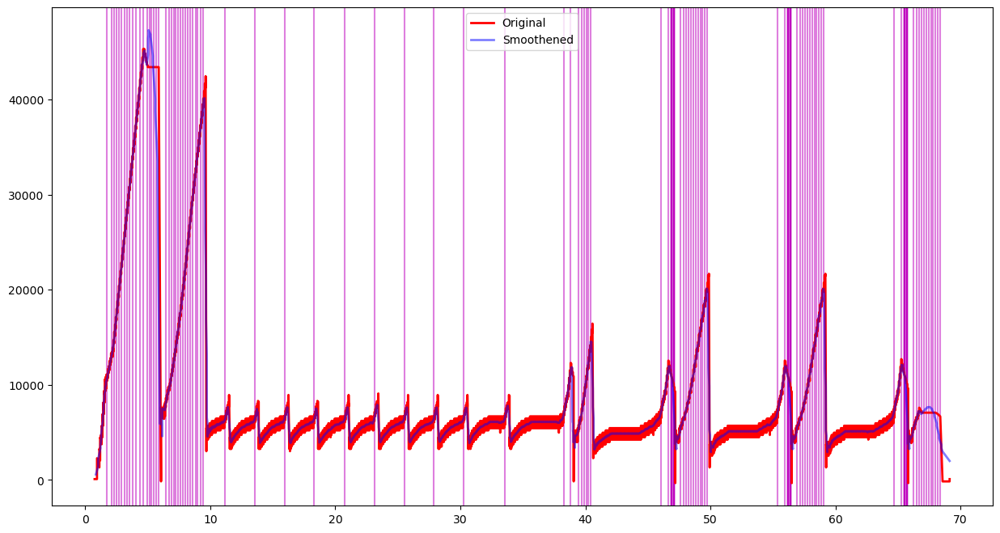

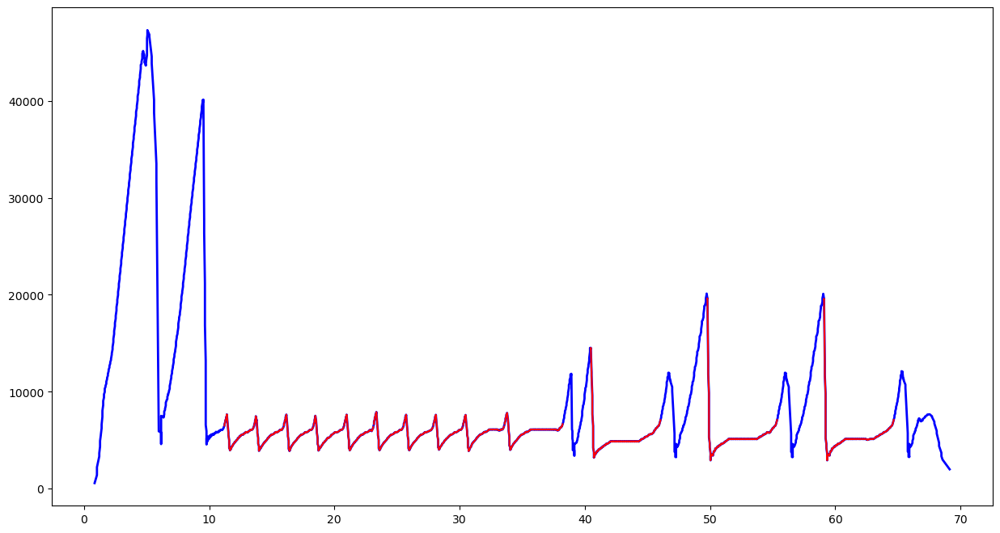

Feature Length  203


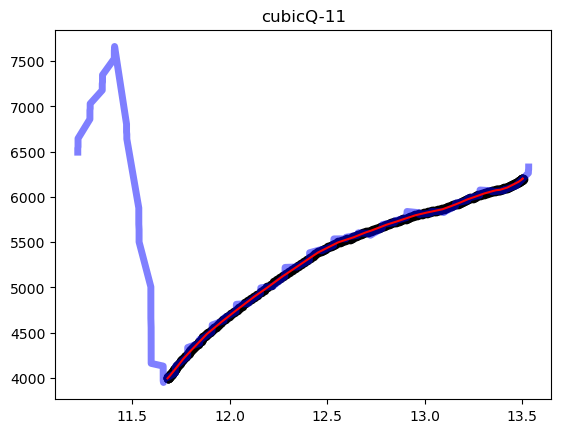

cubicQ-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-12-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-12-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41418', '41424'])
Port 41424


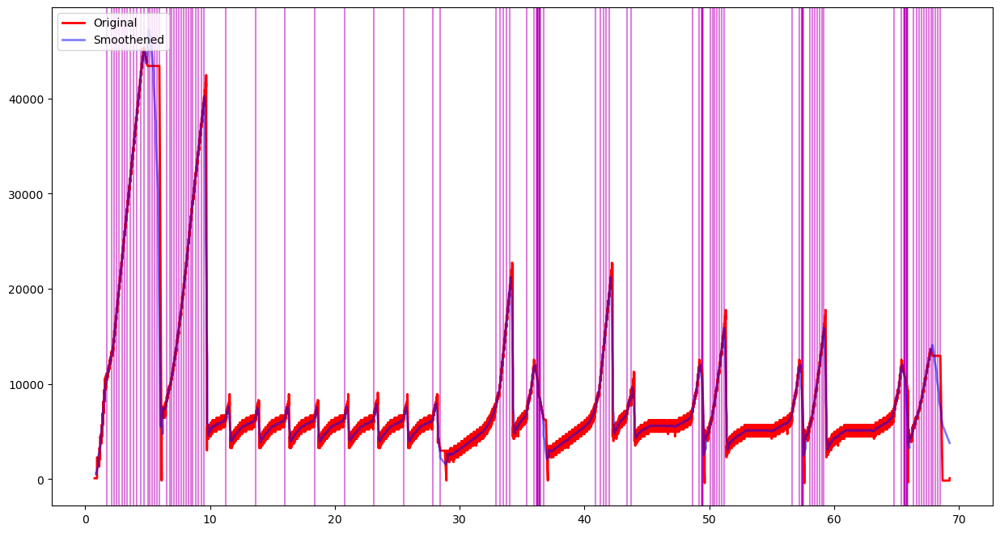

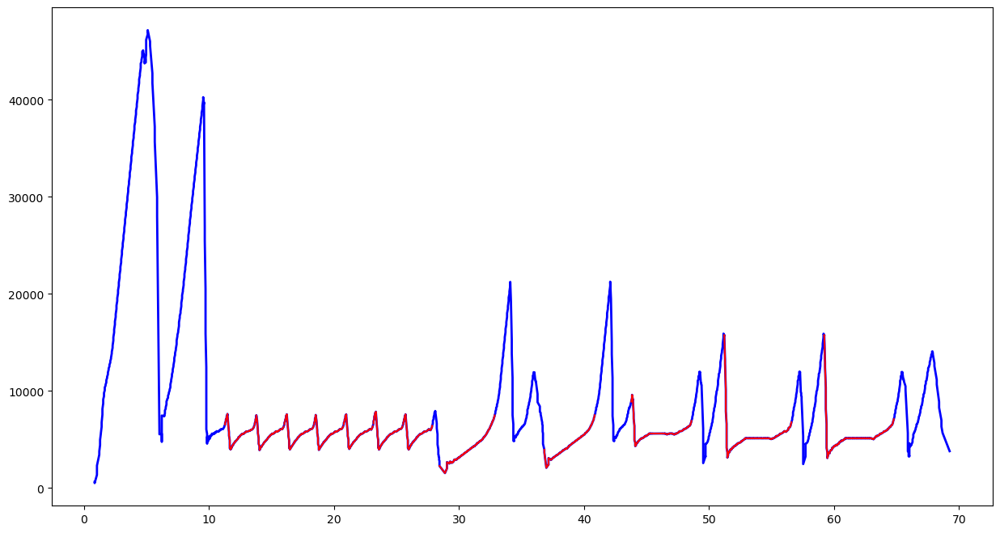

Feature Length  203


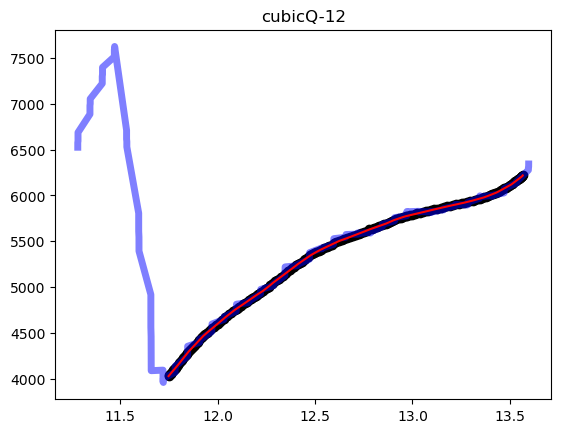

Name : cubicQ-21
Degree to fit 3


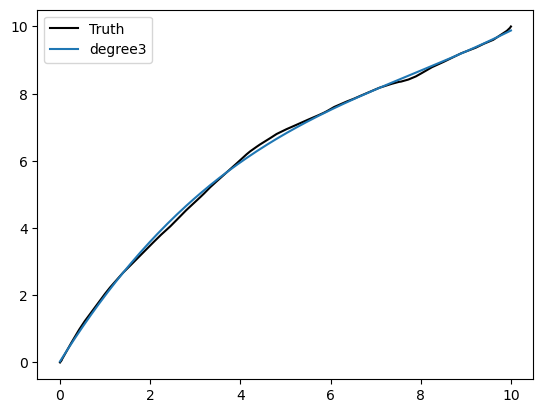

Name : cubicQ-31
Degree to fit 3


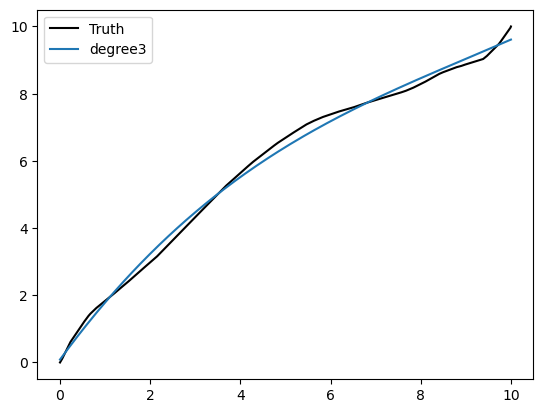

Name : cubicQ-41
Degree to fit 3


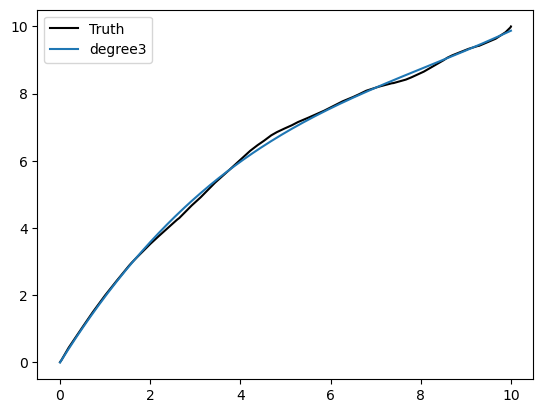

Name : cubicQ-51
Degree to fit 3


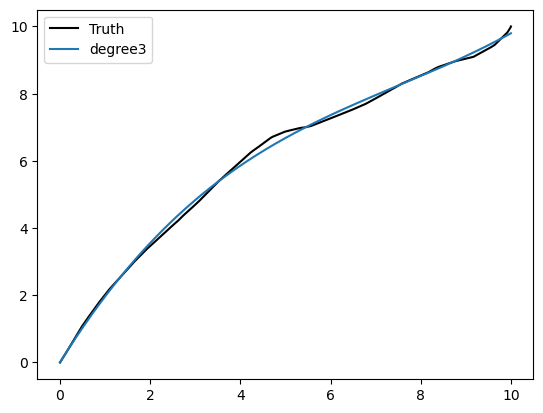

Name : cubicQ-61
Degree to fit 3


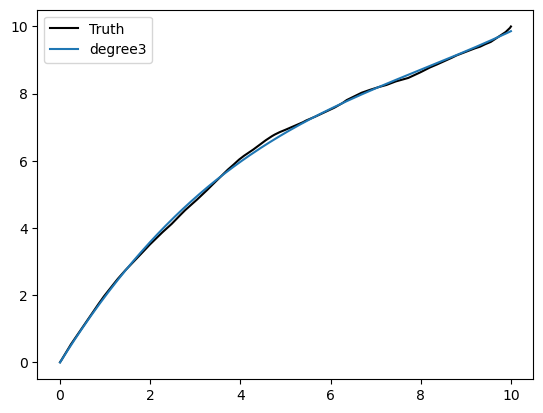

Name : cubicQ-71
Degree to fit 3


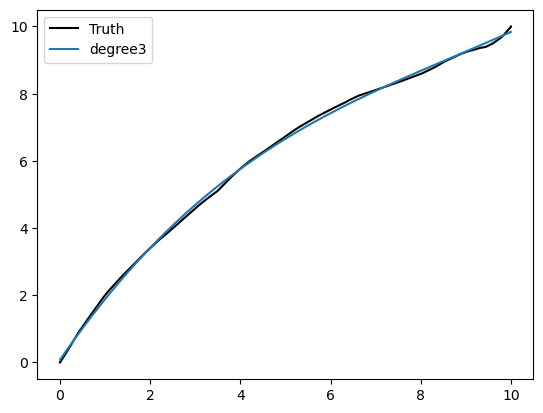

Name : cubicQ-81
Degree to fit 3


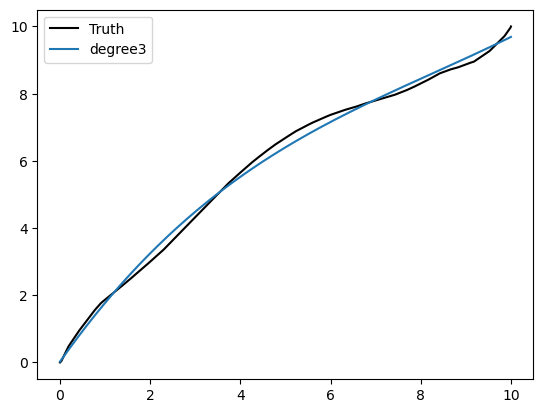

Name : cubicQ-91
Degree to fit 3


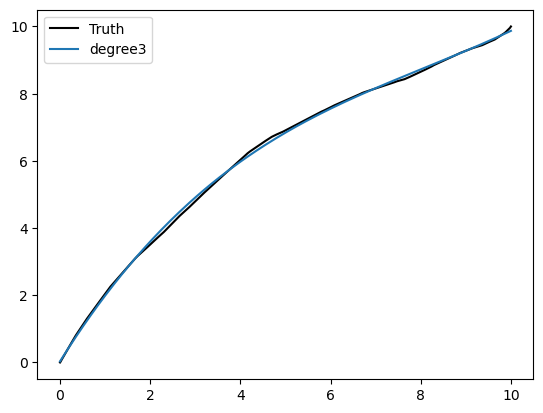

Name : cubicQ-101
Degree to fit 3


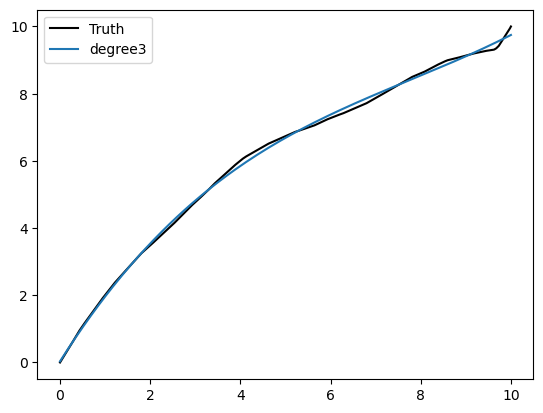

Name : cubicQ-111
Degree to fit 3


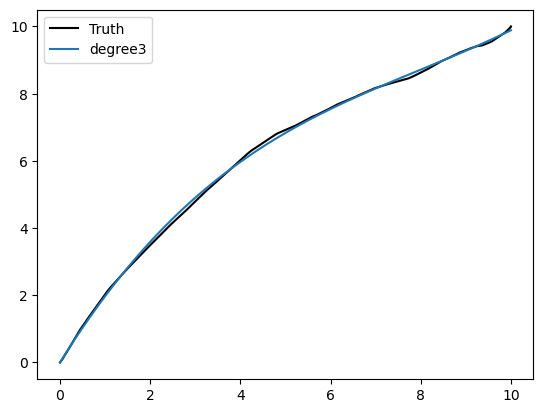

Name : cubicQ-121
Degree to fit 3


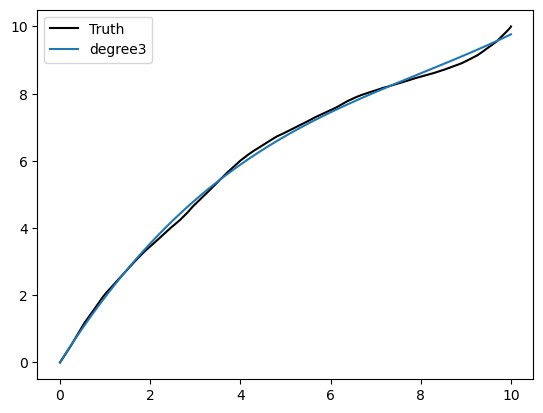

In [431]:
cc_mp = get_feature_degree(cubicQ,ss=225,p="y",ft_thresh=1,max_deg=3)

cubicQ-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57896', '57912'])
Port 57912


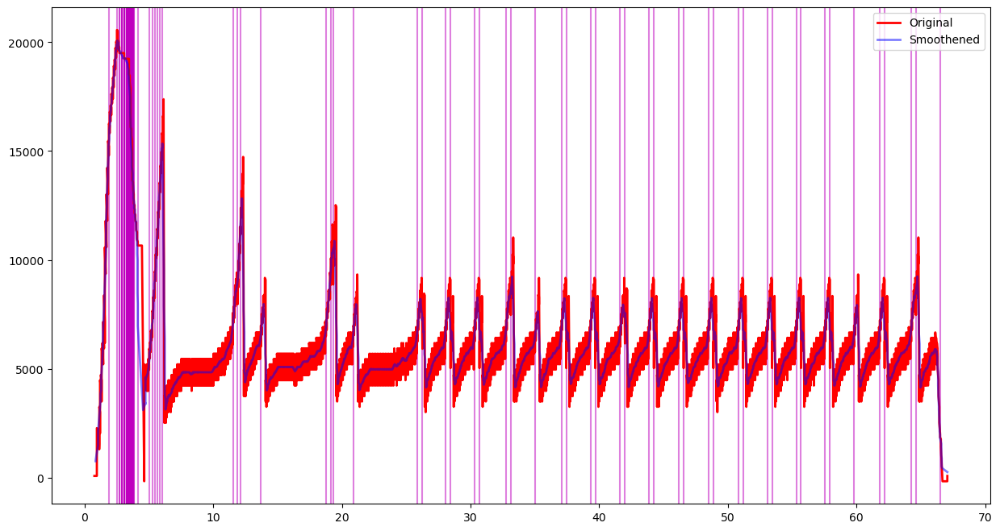

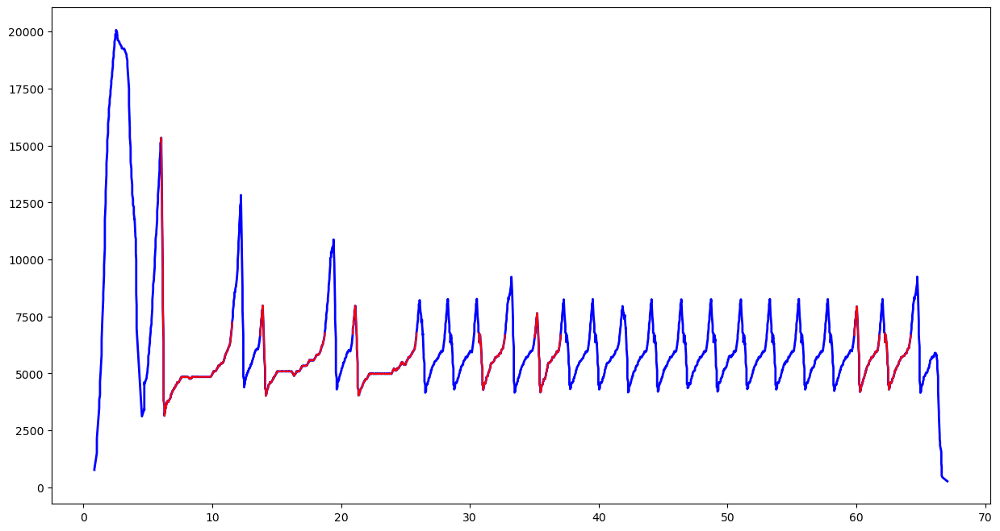

Feature Length  203


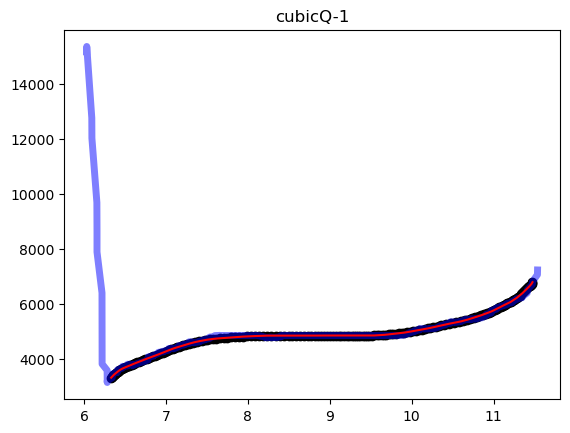

cubicQ-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59508', '59518'])
Port 59518


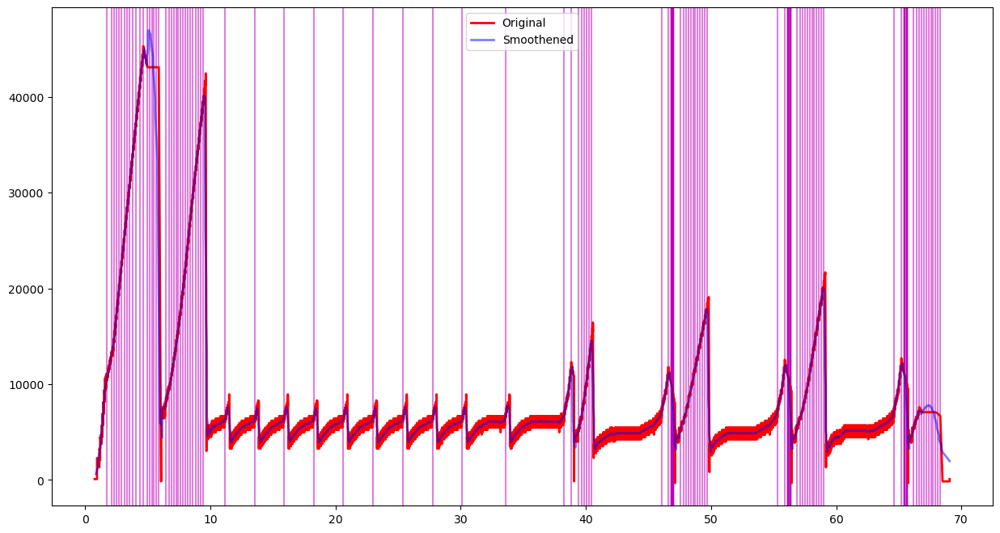

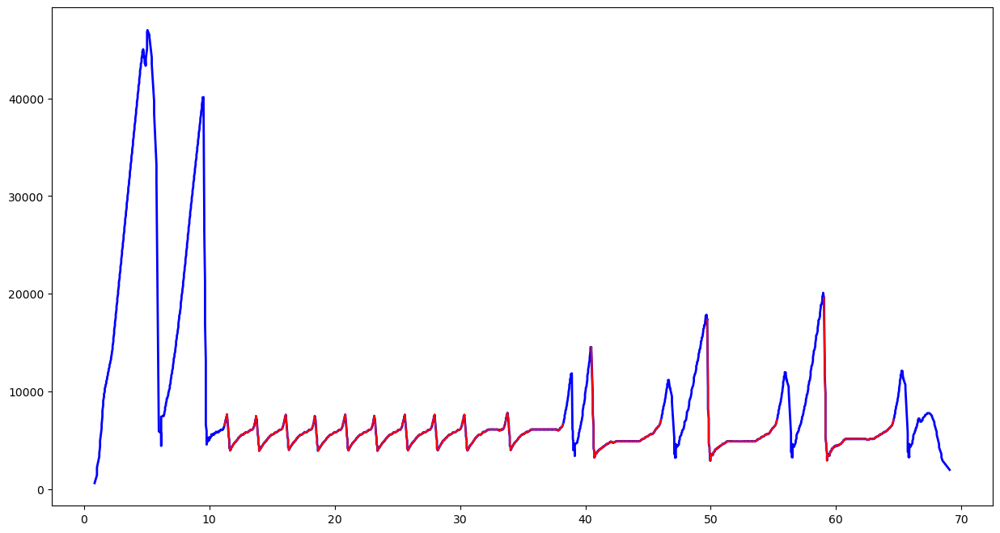

Feature Length  203


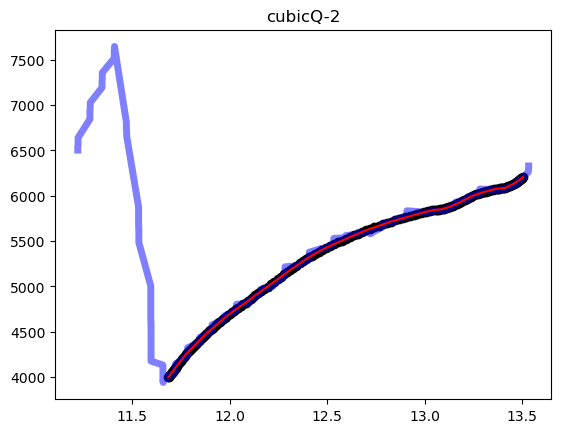

cubicQ-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37492', '37504'])
Port 37504


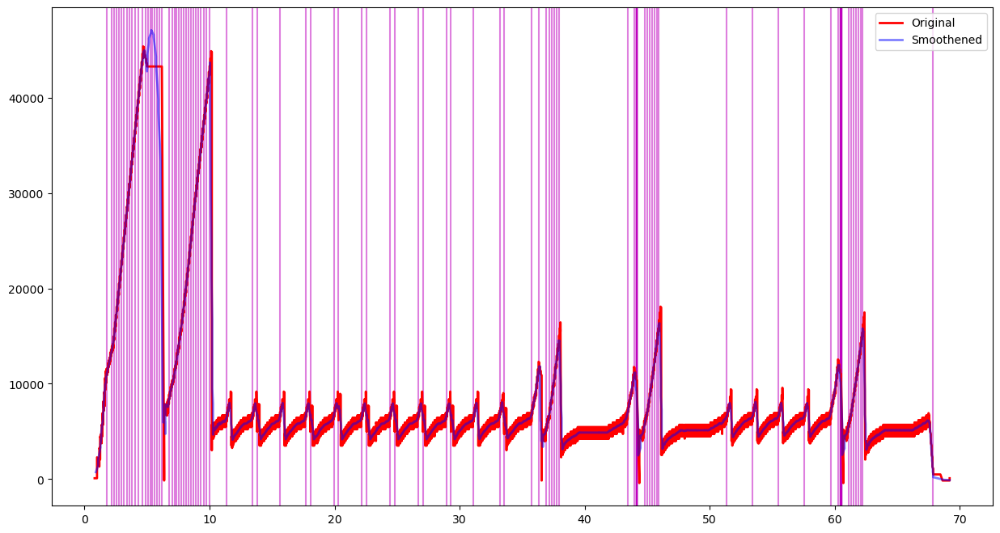

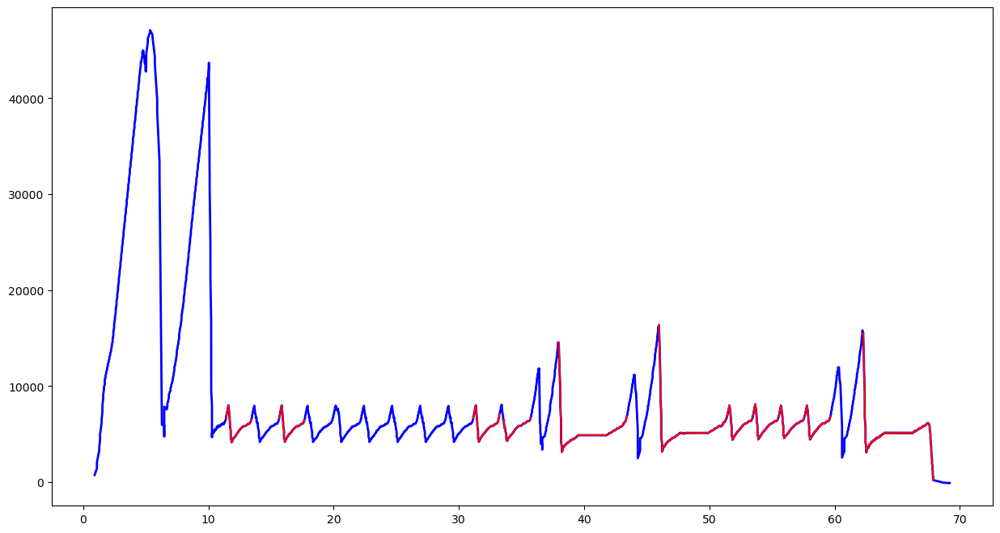

Feature Length  203


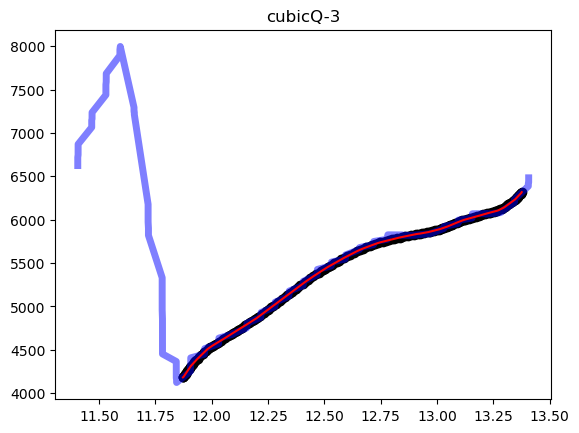

cubicQ-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56756', '56768'])
Port 56768


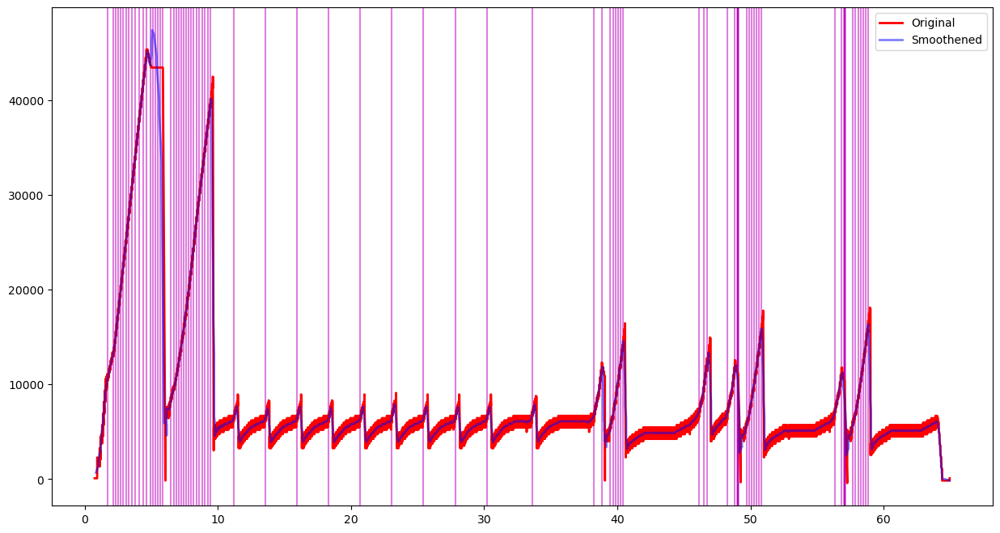

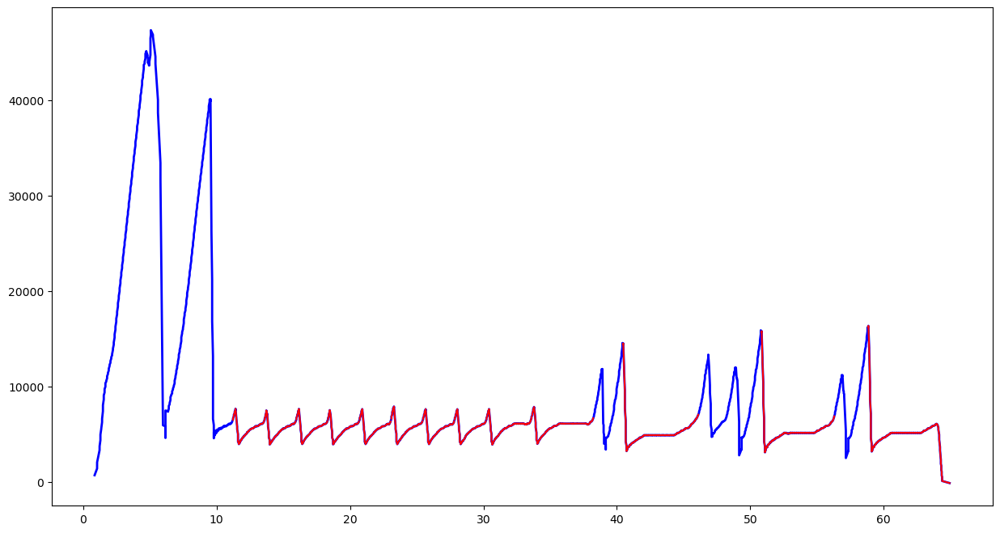

Feature Length  203


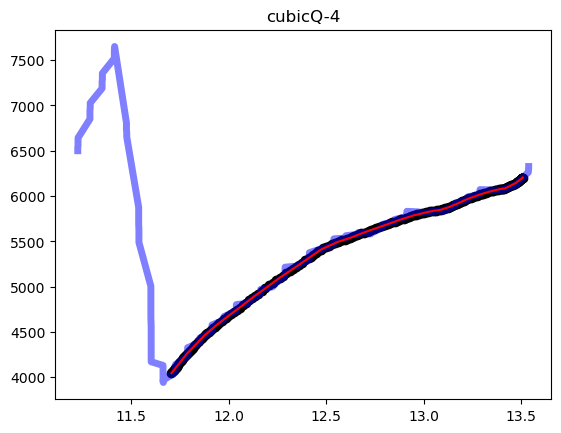

cubicQ-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56240', '56256'])
Port 56256


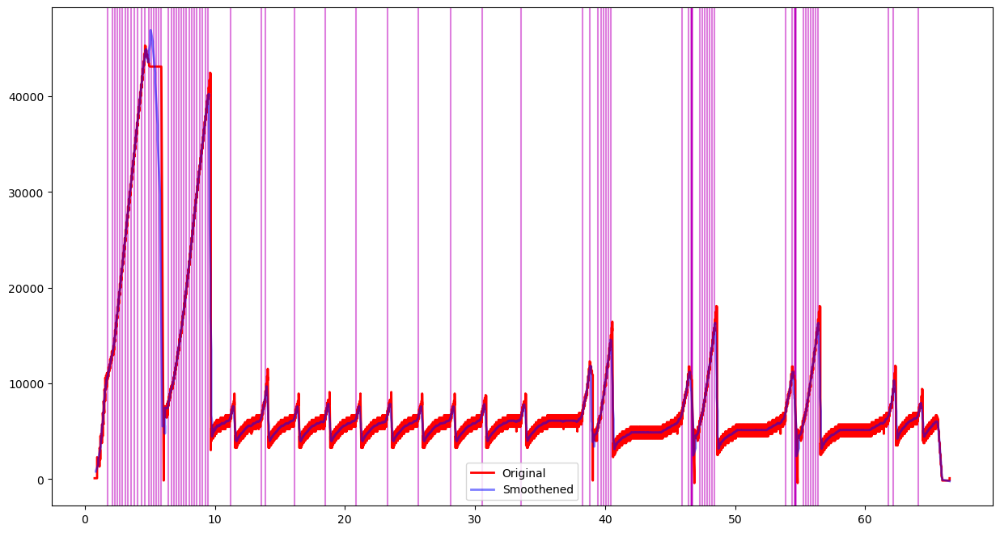

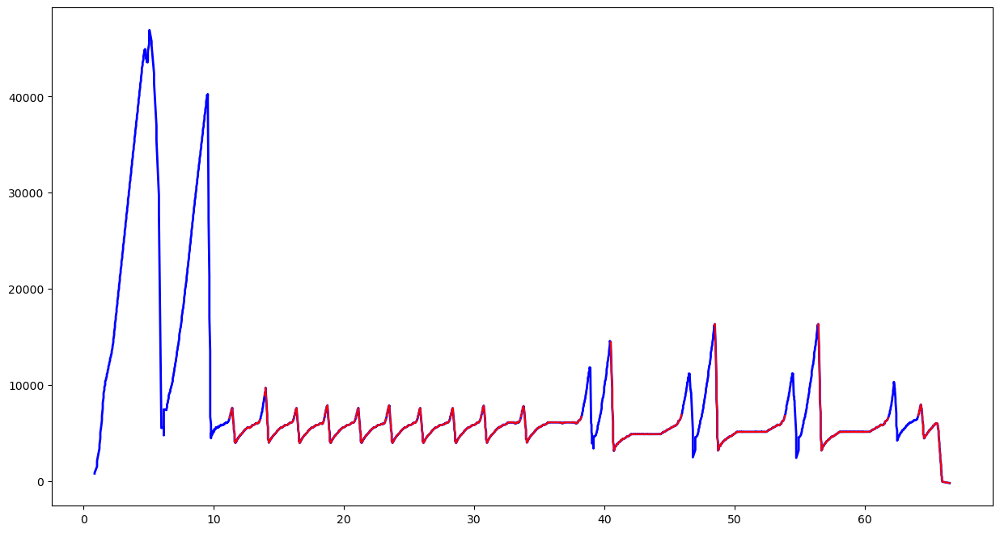

Feature Length  203


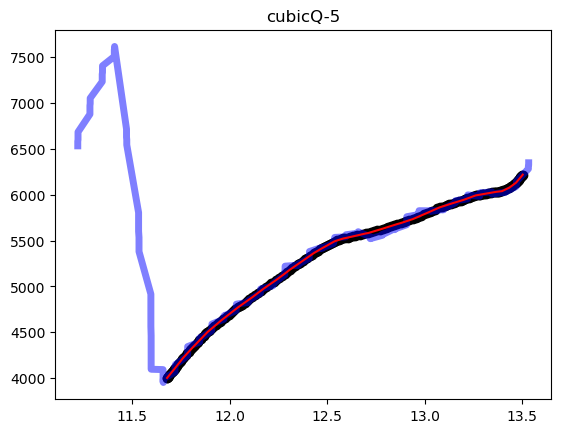

cubicQ-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51750', '51758'])
Port 51758


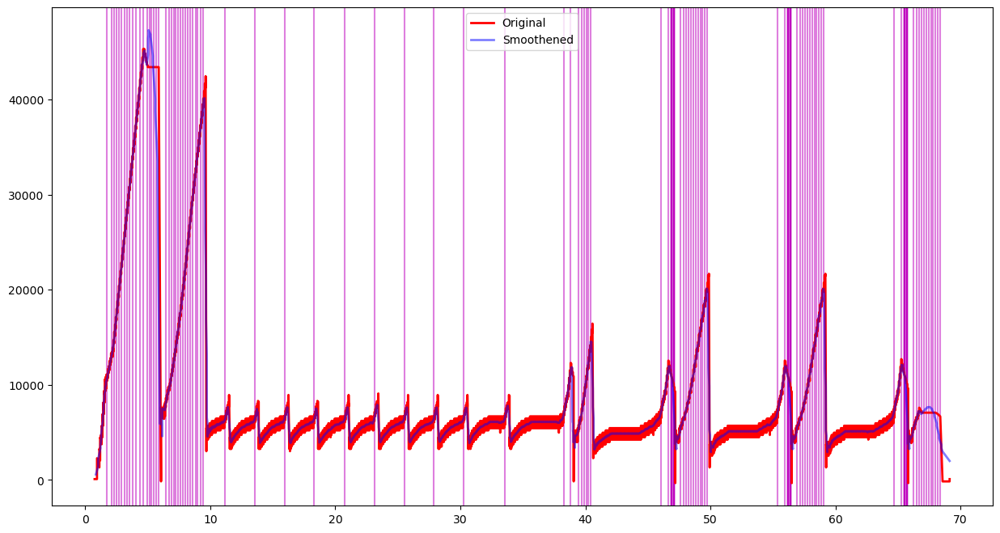

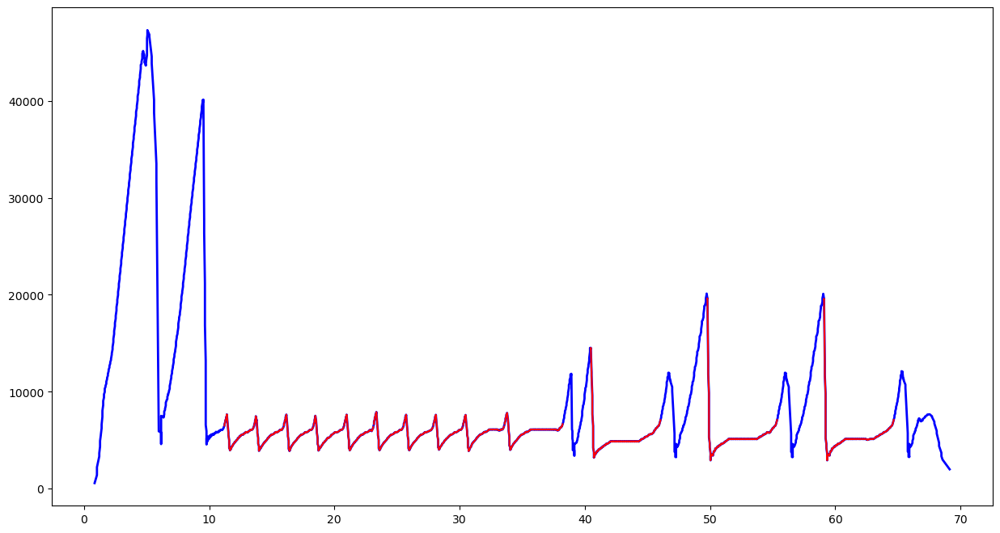

Feature Length  203


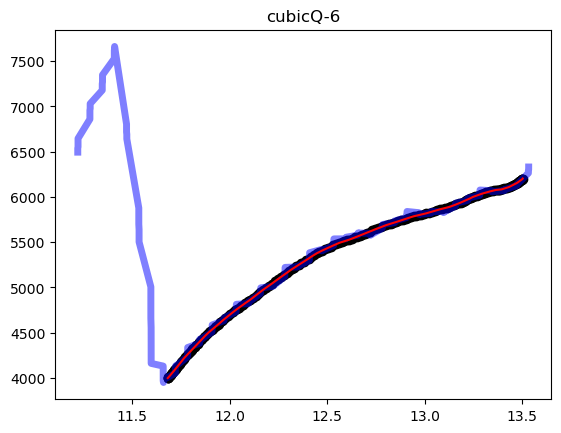

cubicQ-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-7-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54352', '54356'])
Port 54356


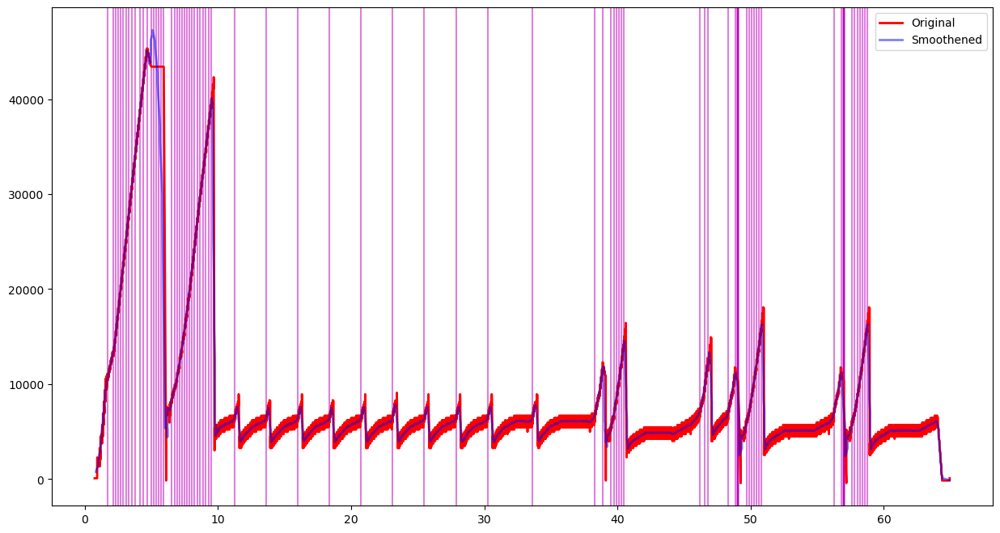

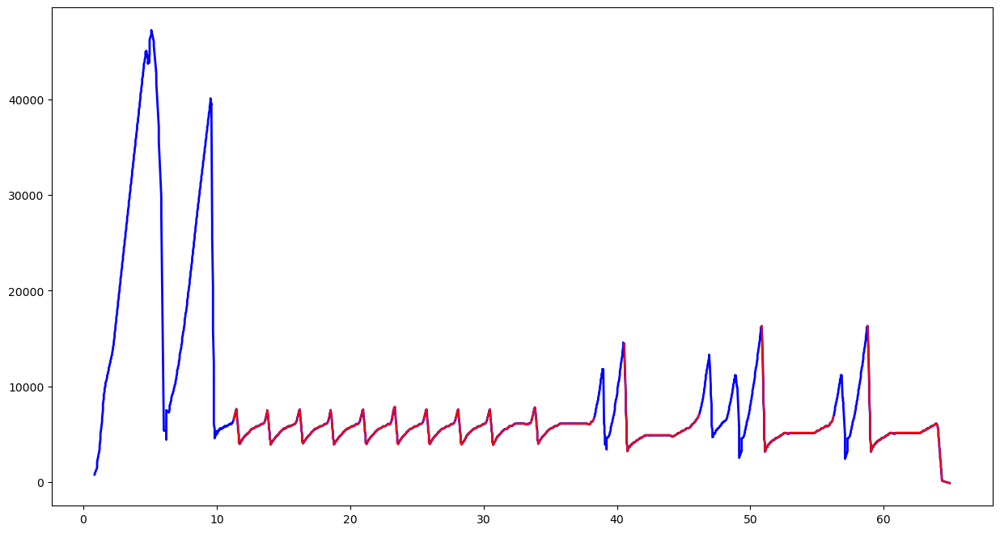

Feature Length  203


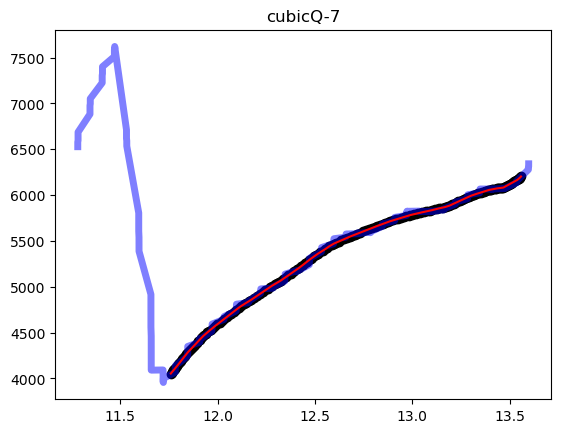

cubicQ-8-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37492', '37504'])
Port 37504


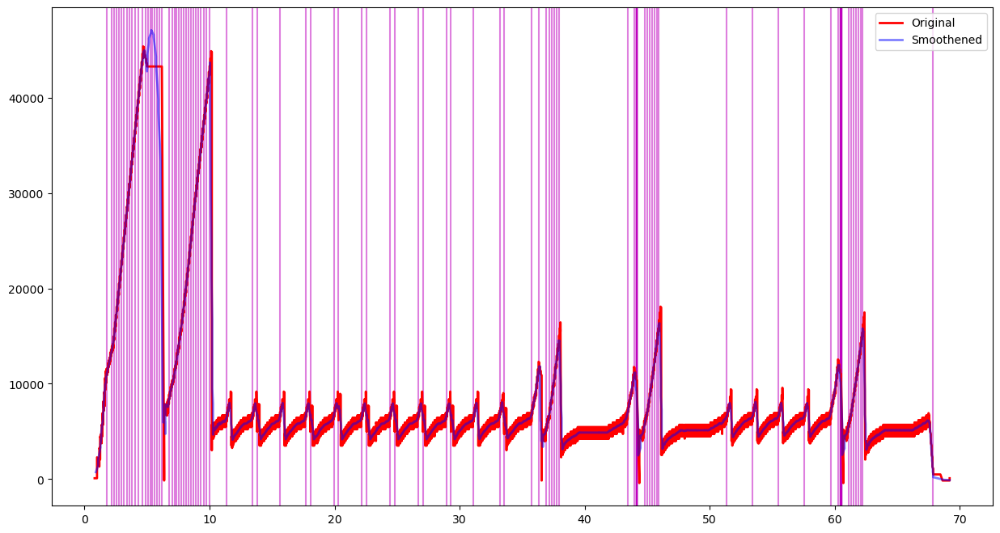

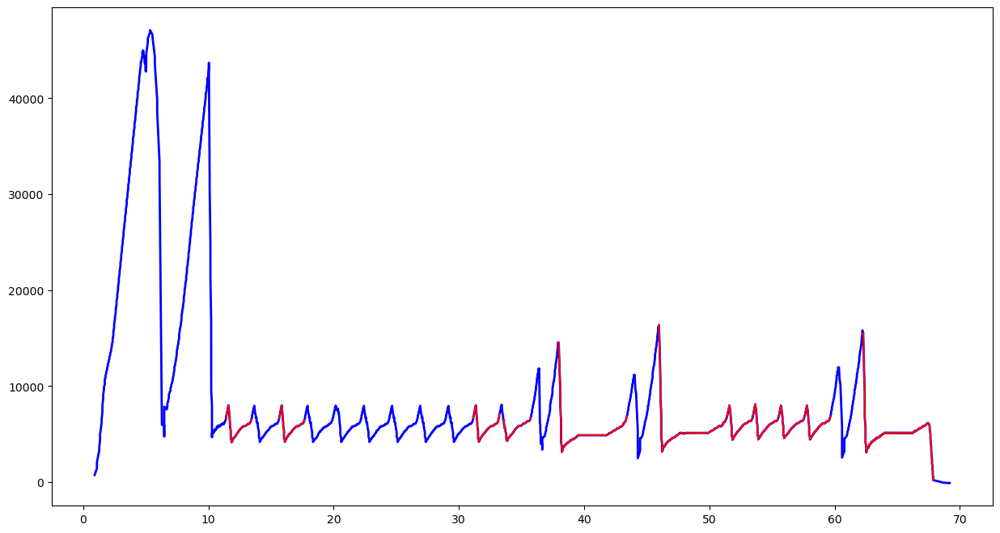

Feature Length  203


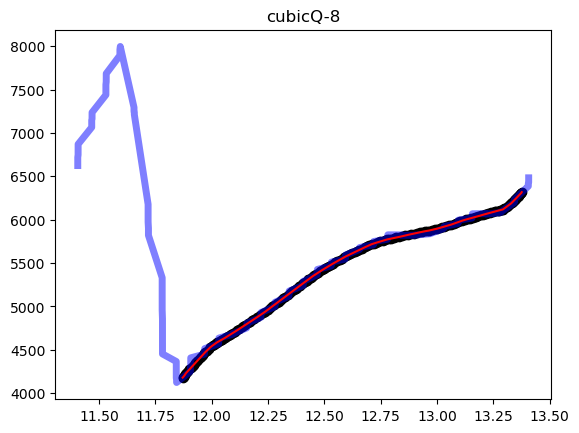

cubicQ-9-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-9-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-9-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56756', '56768'])
Port 56768


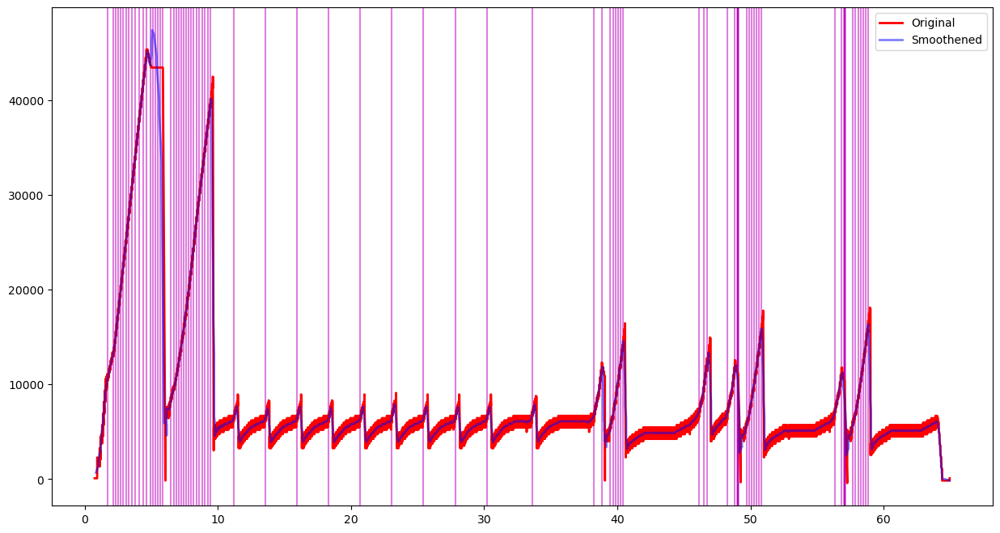

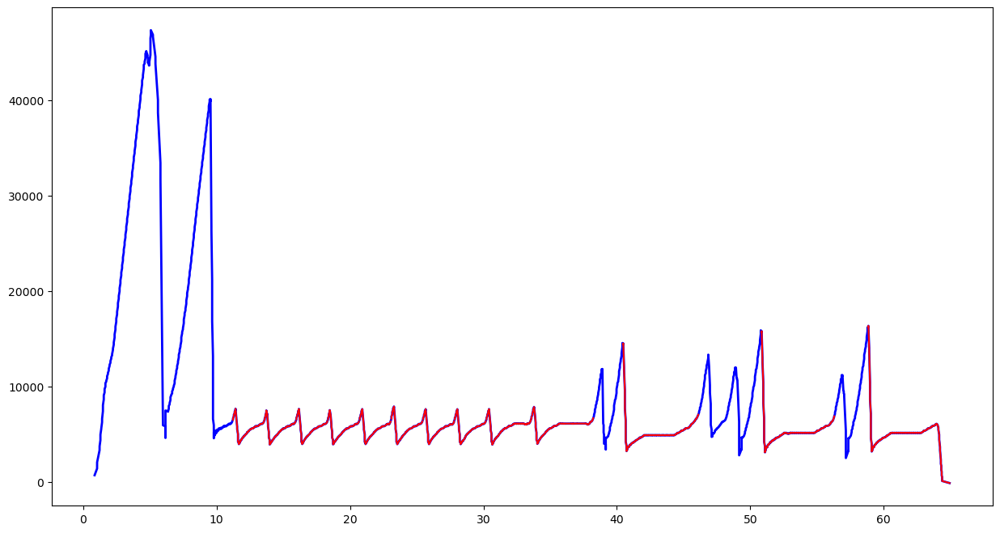

Feature Length  203


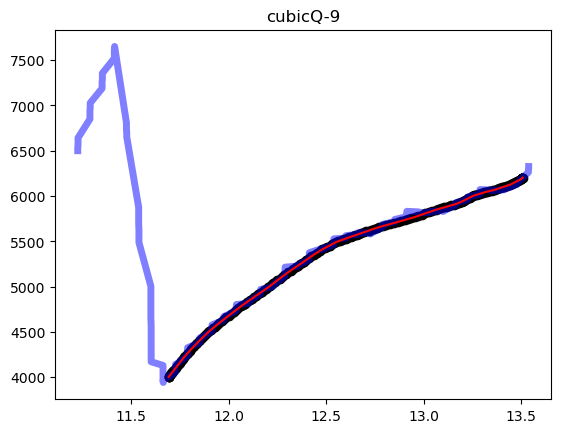

cubicQ-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56240', '56256'])
Port 56256


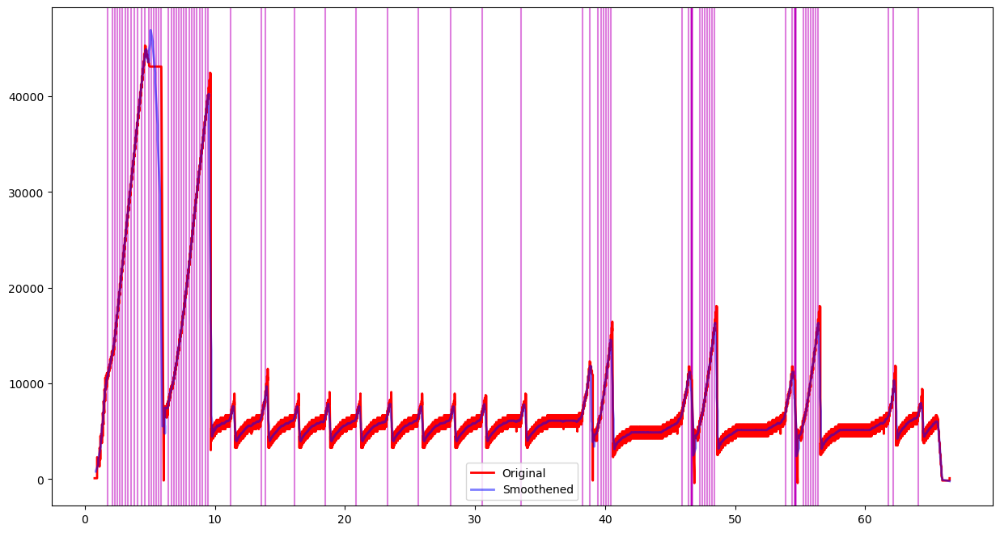

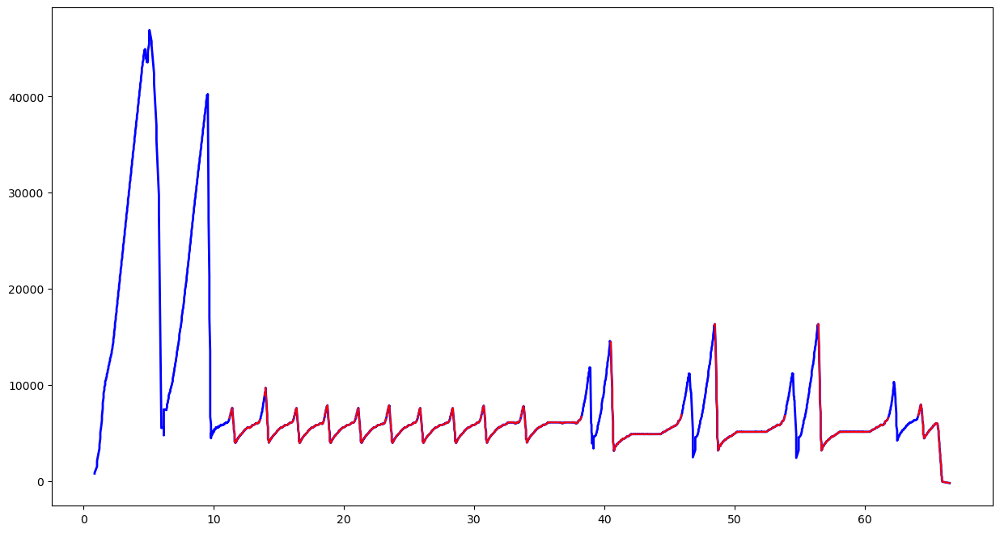

Feature Length  203


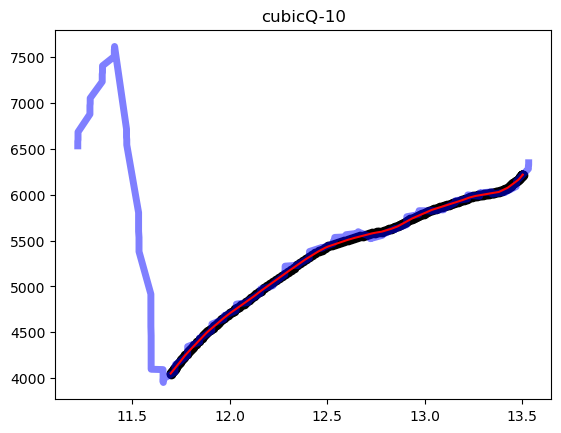

cubicQ-11-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-11-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-11-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51750', '51758'])
Port 51758


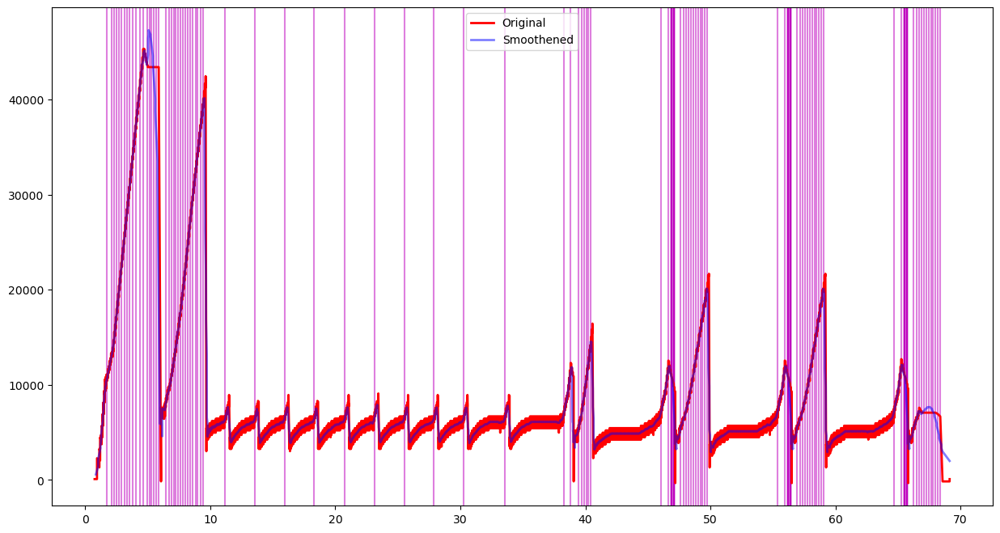

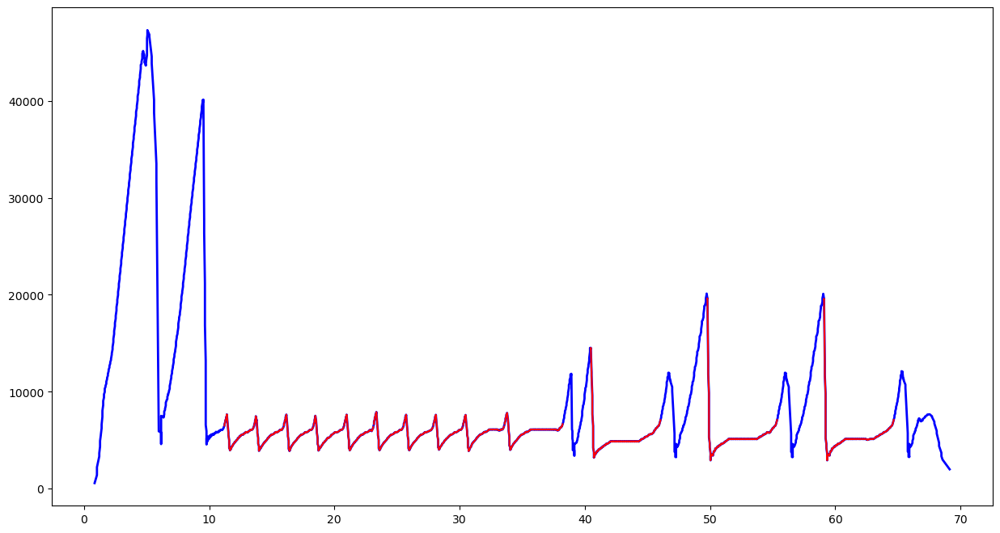

Feature Length  203


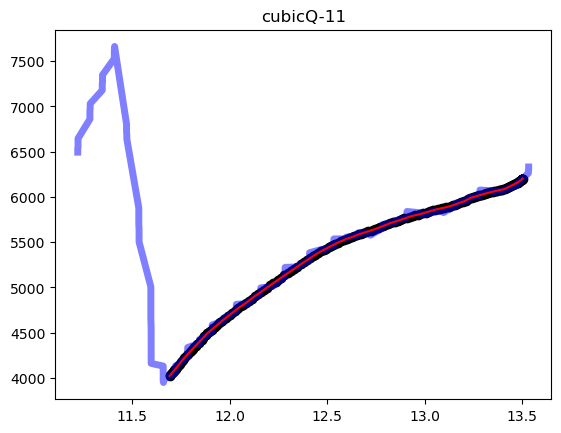

cubicQ-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-12-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-12-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41418', '41424'])
Port 41424


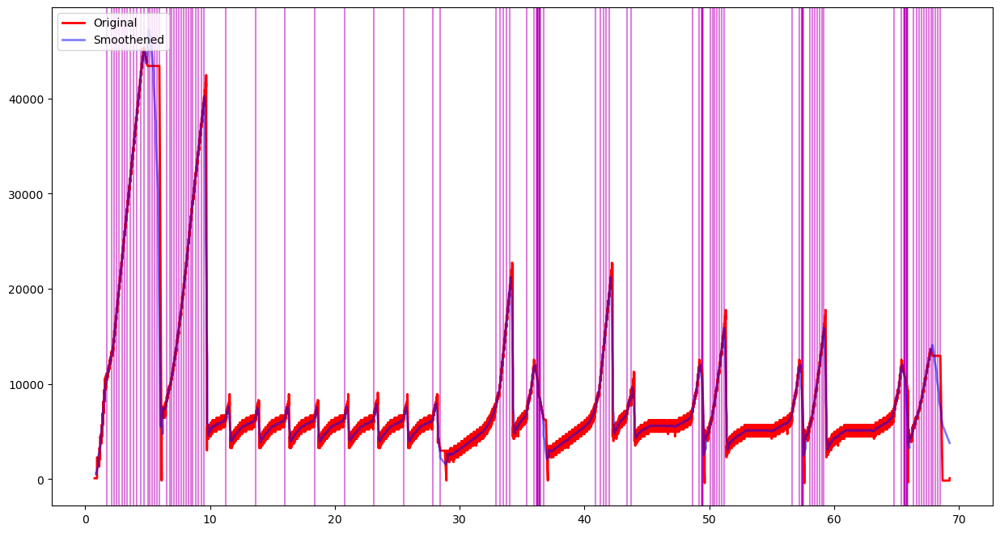

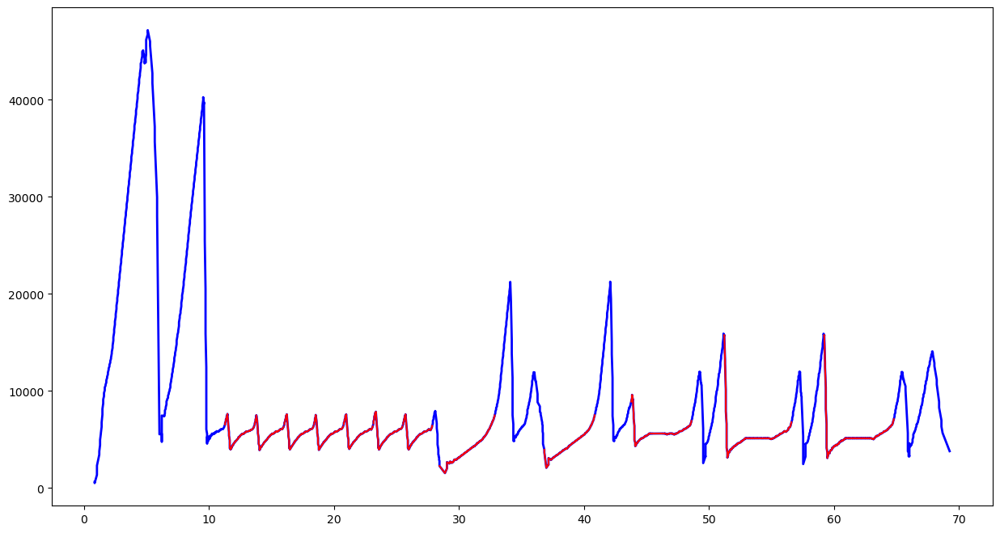

Feature Length  203


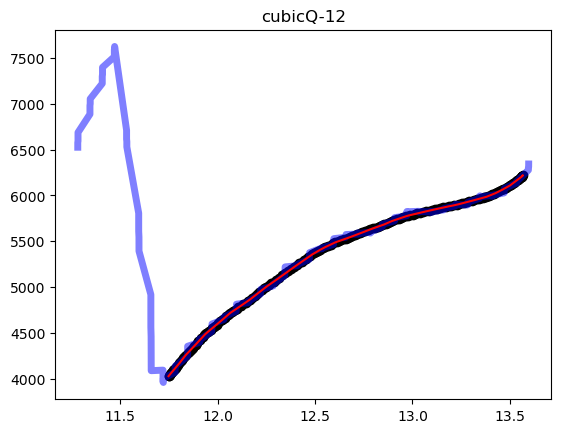

Name : cubicQ-11
Degree to fit 2


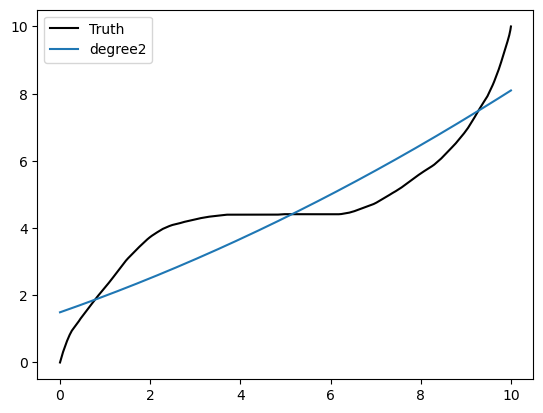

Name : cubicQ-21
Degree to fit 2


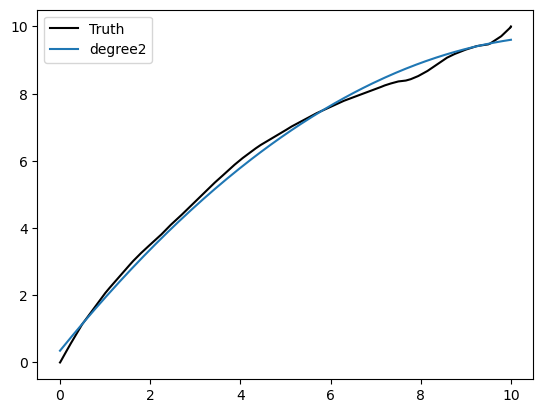

Name : cubicQ-31
Degree to fit 2


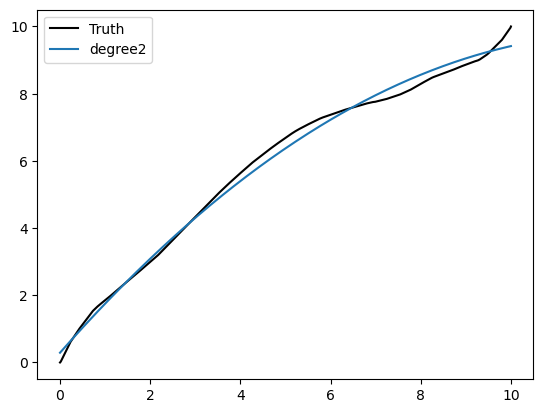

Name : cubicQ-41
Degree to fit 2


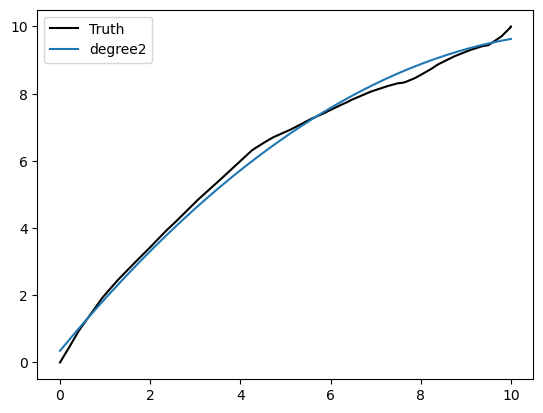

Name : cubicQ-51
Degree to fit 2


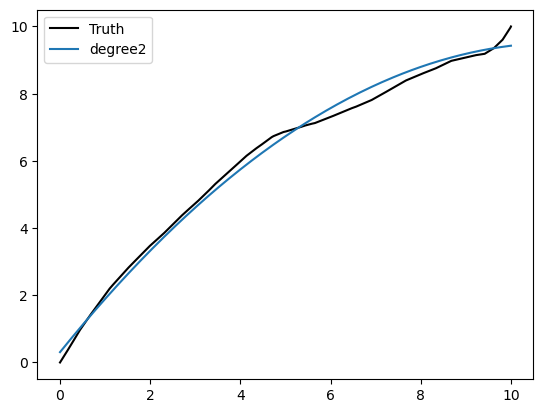

Name : cubicQ-61
Degree to fit 2


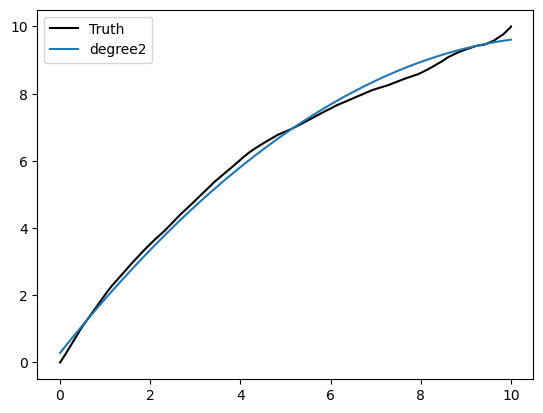

Name : cubicQ-71
Degree to fit 2


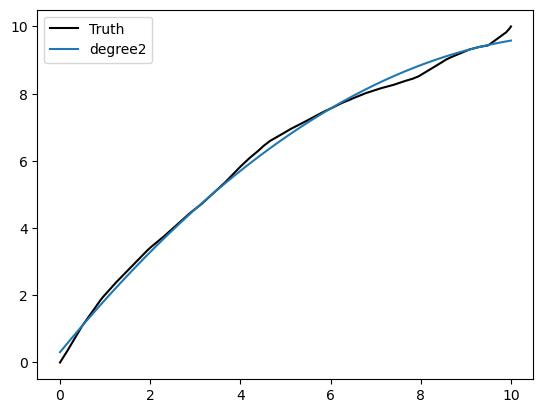

Name : cubicQ-81
Degree to fit 2


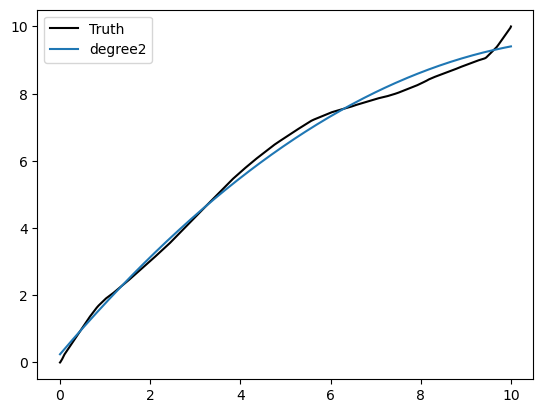

Name : cubicQ-91
Degree to fit 2


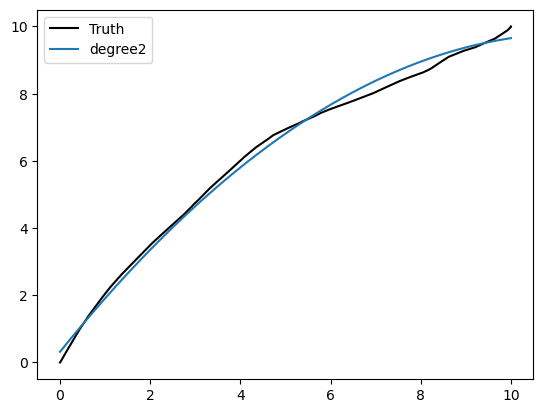

Name : cubicQ-101
Degree to fit 2


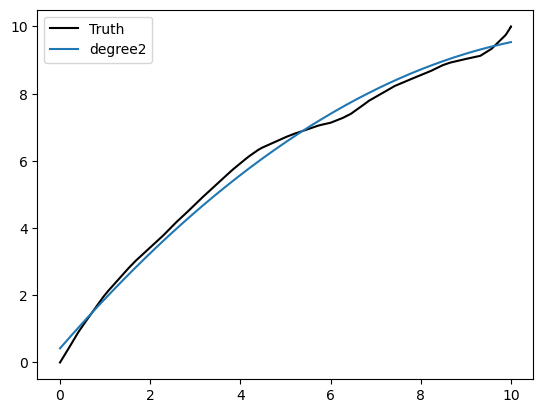

Name : cubicQ-111
Degree to fit 2


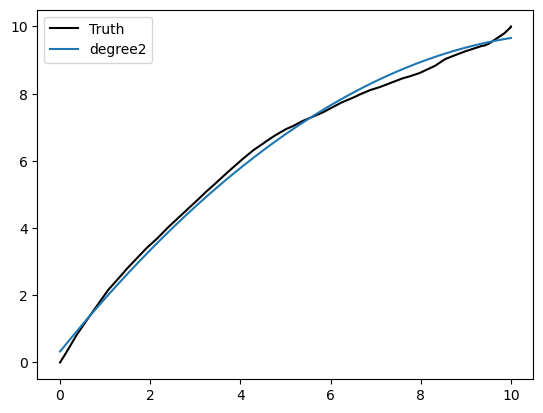

Name : cubicQ-121
Degree to fit 2


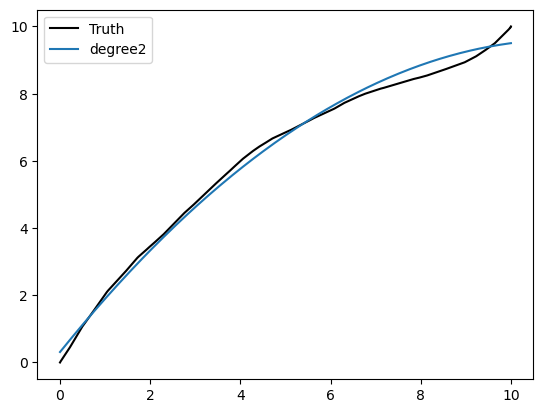

In [402]:
cc_mp = get_feature_degree(cubicQ,ss=225,p="y",ft_thresh=1,max_deg=2)

In [403]:
cubicQ.pop(0)

'cubicQ-1-0-50-200-2-aws-88-60'

In [404]:
len(cubicQ)

11

In [84]:
# Above indicates that for cubic 139 files are usable, but 11 are not

In [405]:
import random

def generate_unique_natural_numbers(start_range, end_range, count):
    # If the range is smaller than the required count, adjust the count
    count = min(count, end_range - start_range + 1)

    # Create a list of numbers in the given range
    numbers = list(range(start_range, end_range + 1))

    # Generate unique random numbers using random.sample
    unique_random_numbers = random.sample(numbers, count)

    return unique_random_numbers

# Define the range and the count of unique natural numbers
start_range = 1
end_range = 100
count_of_unique_numbers = 10

# Generate the unique natural numbers
unique_natural_numbers = generate_unique_natural_numbers(start_range, end_range, count_of_unique_numbers)

# Print the result
print(unique_natural_numbers)


[20, 100, 81, 4, 26, 63, 94, 30, 62, 80]


In [406]:
train_files = []
# test_files = []
for cc in ccs:
    if cc == 'cubicQ':
        continue
    temp_i = generate_unique_natural_numbers(0,len(usable_ind[cc])-1,100)
#     test_i = []
#     for i in range(0,len(usable_ind[cc])-1):
#         if i not in temp_i:
#             test_i.append(i)
#     test_actual_i = [usable_ind[cc][x] for x in test_i] 
    actual_i = [usable_ind[cc][x] for x in temp_i]
    for i in actual_i:
        file = cc+"-"+str(i)+"-0-50-200-2-aws-88-60"
        train_files.append(file)
#     for i in test_actual_i:
#         file = cc+"-"+str(i)+"-0-50-200-2-aws-88-60"
#         test_files.append(file)
#     print(len(usable_ind[cc]),len(train_files),len(test_files))

In [407]:
train_files

['bic-16-0-50-200-2-aws-88-60',
 'bic-46-0-50-200-2-aws-88-60',
 'bic-81-0-50-200-2-aws-88-60',
 'bic-61-0-50-200-2-aws-88-60',
 'bic-127-0-50-200-2-aws-88-60',
 'bic-131-0-50-200-2-aws-88-60',
 'bic-111-0-50-200-2-aws-88-60',
 'bic-31-0-50-200-2-aws-88-60',
 'bic-51-0-50-200-2-aws-88-60',
 'bic-58-0-50-200-2-aws-88-60',
 'bic-78-0-50-200-2-aws-88-60',
 'bic-26-0-50-200-2-aws-88-60',
 'bic-103-0-50-200-2-aws-88-60',
 'bic-8-0-50-200-2-aws-88-60',
 'bic-32-0-50-200-2-aws-88-60',
 'bic-45-0-50-200-2-aws-88-60',
 'bic-77-0-50-200-2-aws-88-60',
 'bic-90-0-50-200-2-aws-88-60',
 'bic-140-0-50-200-2-aws-88-60',
 'bic-128-0-50-200-2-aws-88-60',
 'bic-110-0-50-200-2-aws-88-60',
 'bic-38-0-50-200-2-aws-88-60',
 'bic-120-0-50-200-2-aws-88-60',
 'bic-73-0-50-200-2-aws-88-60',
 'bic-54-0-50-200-2-aws-88-60',
 'bic-97-0-50-200-2-aws-88-60',
 'bic-84-0-50-200-2-aws-88-60',
 'bic-72-0-50-200-2-aws-88-60',
 'bic-69-0-50-200-2-aws-88-60',
 'bic-41-0-50-200-2-aws-88-60',
 'bic-83-0-50-200-2-aws-88-60',
 

In [408]:
len(train_files)

1300

### Training Files

In [409]:
vals, cc_gaussian_params = train(ccs,cc_degree,train_files,ss=225)

bic-16-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45408', '45410'])
Port 45410
Feature Length  203
bic-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-46-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-46-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37772', '37782'])
Port 37782
Feature Length  203
bic-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48870', '48878'])
Port 48878
Feature Length  203
bic-61-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48784', '48796'])
Port 48796
Feature Length  203
bic-127-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-127-0-50-200-2-aw

All Ports :  dict_keys(['53936', '53946'])
Port 53946
Feature Length  203
bic-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51466', '51472'])
Port 51472
Feature Length  203
bic-18-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-18-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-18-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47156', '47158'])
Port 47158
Feature Length  203
bic-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51966', '51978'])
Port 51978
Feature Length  203
bic-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58634', '58642'])
Port 58642
Feature Length  203
bic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bi

All Ports :  dict_keys(['48094', '48106'])
Port 48106
Feature Length  203
bic-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46820', '46826'])
Port 46826
Feature Length  203
bic-85-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-85-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-85-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54032', '54046'])
Port 54046
Feature Length  203
bic-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56518', '56520'])
Port 56520
Feature Length  203
bic-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33766', '33780'])
Port 33780
Feature Length  203
bic-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-11

All Ports :  dict_keys(['37772', '37782'])
Port 37782
16
bic-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48870', '48878'])
Port 48878
16
bic-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48784', '48796'])
Port 48796
16
bic-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41128', '41134'])
Port 41134
16
bic-131-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-131-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48870', '48878'])
Port 48878
16
bic-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48784', '48796'])
Port 48796
16
bic-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-31-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34404', '34414'])
Port 34414
16
bic-51-0-50-2

All Ports :  dict_keys(['39938', '39940'])
Port 39940
16
bic-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58804', '58808'])
Port 58808
16
bic-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36520', '36528'])
Port 36528
16
bic-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41524', '41530'])
Port 41530
16
bic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58644', '58652'])
Port 58652
16
bic-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60446', '60460'])
Port 60460
16
bic-126-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-126-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33536', '33550'])
Port 33550
16
bic-150-0-50-

All Ports :  dict_keys(['57578', '57590'])
Port 57590
Feature Length  203
dctcp-72-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33556', '33568'])
Port 33568
Feature Length  203
dctcp-71-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-71-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-71-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53410', '53420'])
Port 53420
Feature Length  203
dctcp-8-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45974', '45984'])
Port 45984
Feature Length  203
dctcp-86-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-86-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-86-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51420', '48454'])
Port 48454
Feature Length  203
dctcp-11-0-50-200-2-aws-88-60
RTT

All Ports :  dict_keys(['46612', '46614'])
Port 46614
Feature Length  203
dctcp-59-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-59-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-59-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40102', '40112'])
Port 40112
Feature Length  203
dctcp-74-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-74-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-74-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60624', '60640'])
Port 60640
Feature Length  203
dctcp-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33496', '33504'])
Port 33504
Feature Length  203
dctcp-65-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-65-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-65-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51704', '51714'])
Port 51714
Feature Length  203
dctcp-5-0-50-200-2-aws-88-60
R

All Ports :  dict_keys(['51420', '48454'])
Port 48454
Feature Length  203
dctcp-28-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44508', '44518'])
Port 44518
Feature Length  203
dctcp-96-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45042', '45054'])
Port 45054
Feature Length  203
dctcp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57982', '57990'])
Port 57990
Feature Length  203
dctcp-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60742', '60754'])
Port 60754
Feature Length  203
dctcp-68-0-50-200-2-aws-88-60
RTT

All Ports :  dict_keys(['42194', '42210'])
Port 42210
16
dctcp-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55544', '36682'])
Port 36682
16
dctcp-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57578', '57590'])
Port 57590
16
dctcp-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33556', '33568'])
Port 33568
16
dctcp-71-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-71-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53410', '53420'])
Port 53420
16
dctcp-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45974', '45984'])
Port 45984
16
dctcp-86-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-86-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51420', '48454'])
Port 48454


16
dctcp-60-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-60-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52080', '52096'])
Port 52096
16
dctcp-138-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-138-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41330', '41334'])
Port 41334
16
dctcp-36-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-36-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49200', '49202'])
Port 49202
16
dctcp-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39630', '39640'])
Port 39640
16
dctcp-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37862', '37870'])
Port 37870
16
dctcp-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34870', '34882'])
Port 34882
16
dctcp-124-0-50-200-2-aws-88-60
Reading ../../

All Ports :  dict_keys(['54468', '54474'])
Port 54474
Feature Length  203
highspeed-30-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47038', '47042'])
Port 47042
Feature Length  203
highspeed-145-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-145-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-145-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38366', '38374'])
Port 38374
Feature Length  203
highspeed-143-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-143-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-143-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54616', '38136'])
Port 38136
Feature Length  203
highspeed-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42506', '42518'])
Port

All Ports :  dict_keys(['39646', '39654'])
Port 39654
Feature Length  203
highspeed-57-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-57-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-57-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57062', '38448'])
Port 38448
Feature Length  203
highspeed-21-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-21-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-21-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60020', '60032'])
Port 60032
Feature Length  203
highspeed-9-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-9-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-9-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55456', '55462'])
Port 55462
Feature Length  203
highspeed-34-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58278', '58286'])
Port 58286
Featu

All Ports :  dict_keys(['36050', '36066'])
Port 36066
Feature Length  203
highspeed-23-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-23-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-23-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42264', '42266'])
Port 42266
Feature Length  203
highspeed-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34922', '43226'])
Port 43226
Feature Length  203
highspeed-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47684', '47696'])
Port 47696
Feature Length  203
highspeed-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53878', '57200'])
Port 57200
Fe

All Ports :  dict_keys(['54270', '51280'])
Port 51280
16
highspeed-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38670', '38674'])
Port 38674
16
highspeed-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38366', '38374'])
Port 38374
16
highspeed-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54616', '38136'])
Port 38136
16
highspeed-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-110-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45358', '33364'])
Port 33364
16
highspeed-94-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-94-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46482', '46494'])
Port 46494
16
highspeed-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-119-0-50-200-2-aws-88-60-tcp.csv...


All Ports :  dict_keys(['54218', '54220'])
Port 54220
16
highspeed-65-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-65-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37730', '37744'])
Port 37744
16
highspeed-88-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-88-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35354', '35368'])
Port 35368
16
highspeed-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53314', '53318'])
Port 53318
16
highspeed-22-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-22-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34214', '34218'])
Port 34218
16
highspeed-140-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-140-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44076', '44086'])
Port 44086
16
highspeed-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-52-0-50-200-2-aws-88-60-tcp.csv...
Al

All Ports :  dict_keys(['48530', '48542'])
Port 48542
Feature Length  203
htcp-50-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42466', '42480'])
Port 42480
Feature Length  203
htcp-105-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-105-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-105-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53370', '53382'])
Port 53382
Feature Length  203
htcp-58-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43684', '46968'])
Port 46968
Feature Length  203
htcp-34-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54248', '54252'])
Port 54252
Feature Length  203
htcp-130-0-50-200-2-aws-88-60
RTT 0.1 B

All Ports :  dict_keys(['54410', '54426'])
Port 54426
Feature Length  203
htcp-30-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40180', '40182'])
Port 40182
Feature Length  203
htcp-96-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39320', '39334'])
Port 39334
Feature Length  203
htcp-90-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-90-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-90-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59976', '59978'])
Port 59978
Feature Length  203
htcp-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37344', '37358'])
Port 37358
Feature Length  203
htcp-87-0-50-200-2-aws-88-60
RTT 0.1 BD

All Ports :  dict_keys(['52432', '52434'])
Port 52434
Feature Length  203
htcp-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50206', '50208'])
Port 50208
Feature Length  203
htcp-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58010', '58012'])
Port 58012
Feature Length  203
htcp-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59780', '59784'])
Port 59784
Feature Length  203
htcp-113-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-113-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-113-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49046', '49056'])
Port 49056
Feature Length  203
htcp-37-0-50-200-2-aws-88-60
RTT 0.1 BD

All Ports :  dict_keys(['48530', '48542'])
Port 48542
16
htcp-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42466', '42480'])
Port 42480
16
htcp-105-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-105-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53370', '53382'])
Port 53382
16
htcp-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43684', '46968'])
Port 46968
16
htcp-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54248', '54252'])
Port 54252
16
htcp-130-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-130-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53178', '53180'])
Port 53180
16
htcp-32-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-32-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38240', '38254'])
Port 38254
16
htc

All Ports :  dict_keys(['41868', '41876'])
Port 41876
16
htcp-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60390', '60392'])
Port 60392
16
htcp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40406', '40408'])
Port 40408
16
htcp-124-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-124-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40590', '40592'])
Port 40592
16
htcp-137-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-137-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42486', '42490'])
Port 42490
16
htcp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43944', '43952'])
Port 43952
16
htcp-92-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-92-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59436', '59442'])
Port 59442
16
htc

All Ports :  dict_keys(['55618', '55622'])
Port 55622
Feature Length  203
lp-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-84-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-84-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47754', '47768'])
Port 47768
Feature Length  203
lp-67-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43356', '43366'])
Port 43366
Feature Length  203
lp-68-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-68-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-68-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40884', '40898'])
Port 40898
Feature Length  203
lp-27-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-27-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-27-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45826', '45830'])
Port 45830
Feature Length  203
lp-145-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-145-0-50-200-2-a

All Ports :  dict_keys(['43728', '43742'])
Port 43742
Feature Length  203
lp-140-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-140-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-140-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36580', '36592'])
Port 36592
Feature Length  203
lp-87-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-87-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-87-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58372', '58382'])
Port 58382
Feature Length  203
lp-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52074', '53888'])
Port 53888
Feature Length  203
lp-59-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-59-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-59-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57178', '57188'])
Port 57188
Feature Length  203
lp-129-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-129-0-50-200-2-a

All Ports :  dict_keys(['56052', '56058'])
Port 56058
Feature Length  203
lp-20-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-20-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-20-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51206', '51208'])
Port 51208
Feature Length  203
lp-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39540', '39548'])
Port 39548
Feature Length  203
lp-86-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-86-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-86-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54418', '51482'])
Port 51482
Feature Length  203
lp-66-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-66-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-66-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58776', '58790'])
Port 58790
Feature Length  203
lp-127-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-127-0-50-200-

All Ports :  dict_keys(['55100', '55104'])
Port 55104
16
lp-85-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-85-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59846', '59854'])
Port 59854
16
lp-123-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-123-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48812', '48824'])
Port 48824
16
lp-70-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-70-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54076', '54092'])
Port 54092
16
lp-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54160', '54164'])
Port 54164
16
lp-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-110-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41878', '41892'])
Port 41892
16
lp-109-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-109-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35458', '35470'])
Port 35470
16
lp-77-0-50-200-2-aws-88-6

All Ports :  dict_keys(['60194', '60196'])
Port 60196
16
lp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40006', '40008'])
Port 40008
16
lp-146-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-146-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54998', '55004'])
Port 55004
16
lp-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38286', '38288'])
Port 38288
16
lp-25-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-25-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52316', '52328'])
Port 52328
16
lp-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40490', '40504'])
Port 40504
16
lp-133-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-133-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38952', '38956'])
Port 38956
16
lp-48-0-50-200-2-aws-88-60


All Ports :  dict_keys(['34522', '34536'])
Port 34536
Feature Length  203
nv-132-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-132-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-132-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60192', '60198'])
Port 60198
Feature Length  203
nv-103-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-103-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-103-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58388', '58396'])
Port 58396
Feature Length  203
nv-139-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-139-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-139-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35148', '35156'])
Port 35156
Feature Length  203
nv-149-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53372', '53378'])
Port 53378
Feature Length  203
nv-31-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-31-0-

All Ports :  dict_keys(['40452', '40464'])
Port 40464
Feature Length  203
nv-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53338', '53354'])
Port 53354
Feature Length  203
nv-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41042', '41056'])
Port 41056
Feature Length  203
nv-95-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57308', '57322'])
Port 57322
Feature Length  203
nv-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45922', '45926'])
Port 45926
Feature Length  203
nv-68-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-68-0-50-200-2-

All Ports :  dict_keys(['39442', '57292'])
Port 57292
Feature Length  203
nv-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46792', '46798'])
Port 46798
Feature Length  203
nv-123-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-123-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-123-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40762', '40764'])
Port 40764
Feature Length  203
nv-74-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-74-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-74-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42436', '48704'])
Port 48704
Feature Length  203
nv-35-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-35-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47024', '47026'])
Port 47026
Feature Length  203
nv-53-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-53-0-50-200-2-aws

All Ports :  dict_keys(['47114', '47124'])
Port 47124
16
nv-69-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-69-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50396', '50406'])
Port 50406
16
nv-25-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-25-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54174', '51886'])
Port 51886
16
nv-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55396', '55408'])
Port 55408
16
nv-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41782', '41784'])
Port 41784
16
nv-27-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-27-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33836', '33844'])
Port 33844
16
nv-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47580', '47590'])
Port 47590
16
nv-23-0-50-200-2-aws-88-60


All Ports :  dict_keys(['52056', '52072'])
Port 52072
16
nv-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35748', '35760'])
Port 35760
16
nv-125-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-125-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37178', '37192'])
Port 37192
16
nv-66-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-66-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41042', '41056'])
Port 41056
16
nv-85-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-85-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55012', '55016'])
Port 55016
16
nv-99-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-99-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53372', '53378'])
Port 53378
16
nv-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60192', '60198'])
Port 60198
16
nv-40-0-50-200-2-aws-88-60
Re

All Ports :  dict_keys(['47256', '47262'])
Port 47262
scalable-141-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-141-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-141-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43180', '43196'])
Port 43196
Feature Length  203
scalable-13-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-13-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-13-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54194', '54200'])
Port 54200
Feature Length  203
scalable-29-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56220', '56228'])
Port 56228
scalable-64-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-64-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-64-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49062', '49066'])
Port 49066
Feature Length  203
scalable-21-0-50-200-2-aws-88-6

All Ports :  dict_keys(['40638', '40640'])
Port 40640
Feature Length  203
scalable-22-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-22-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-22-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42188', '42192'])
Port 42192
Feature Length  203
scalable-59-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-59-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-59-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38040', '50758'])
Port 50758
Feature Length  203
scalable-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60816', '60820'])
Port 60820
Feature Length  203
scalable-99-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-99-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-99-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49738', '49746'])
Port 49746
Feature Length

All Ports :  dict_keys(['36510', '46114'])
Port 46114
scalable-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58528', '58530'])
Port 58530
Feature Length  203
scalable-50-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43844', '43856'])
Port 43856
scalable-106-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-106-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-106-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39990', '40004'])
Port 40004
Feature Length  203
scalable-90-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-90-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-90-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49324', '49336'])
Port 49336
Name : scalable-1181
Degree to fit 1
Name : scalabl

All Ports :  dict_keys(['41192', '41202'])
Port 41202
scalable-20-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-20-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48444', '48458'])
Port 48458
scalable-102-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-102-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34074', '34090'])
Port 34090
scalable-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60000', '60016'])
Port 60016
scalable-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57598', '57614'])
Port 57614
scalable-97-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-97-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59108', '59112'])
Port 59112
scalable-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33548',

All Ports :  dict_keys(['40976', '40978'])
Port 40978
scalable-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52970', '55662'])
Port 55662
16
scalable-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39428', '39436'])
Port 39436
scalable-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33436', '33448'])
Port 33448
16
scalable-68-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-68-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44864', '44866'])
Port 44866
16
scalable-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41850', '41852'])
Port 41852
16
scalable-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  d

All Ports :  dict_keys(['58638', '58640'])
Port 58640
Feature Length  203
vegas-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52390', '39982'])
Port 39982
Feature Length  203
vegas-52-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-52-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47804', '47812'])
Port 47812
Feature Length  203
vegas-110-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-110-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46786', '46798'])
Port 46798
Feature Length  203
vegas-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56090', '56092'])
Port 56092
Feature Length  203
vegas-97-0-50-200-2-aws-

All Ports :  dict_keys(['58640', '58644'])
Port 58644
Feature Length  203
vegas-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35028', '35032'])
Port 35032
Feature Length  203
vegas-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54264', '54272'])
Port 54272
Feature Length  203
vegas-104-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-104-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-104-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54608', '54616'])
Port 54616
Feature Length  203
vegas-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39382', '39398'])
Port 39398
Feature Length  203
vegas-3-0-50-200-2-aws-8

Name : vegas-201
Degree to fit 3
Name : vegas-191
Degree to fit 3
Name : vegas-651
Degree to fit 3
Name : vegas-1351
Degree to fit 3
Name : vegas-1001
Degree to fit 3
Name : vegas-1371
Degree to fit 3
Name : vegas-501
Degree to fit 3
Name : vegas-321
Degree to fit 3
Name : vegas-1071
Degree to fit 3
Name : vegas-261
Degree to fit 3
Name : vegas-921
Degree to fit 3
Name : vegas-801
Degree to fit 3
Name : vegas-481
Degree to fit 3
Name : vegas-1251
Degree to fit 3
Name : vegas-551
Degree to fit 3
Name : vegas-311
Degree to fit 3
Name : vegas-441
Degree to fit 3
Name : vegas-81
Degree to fit 3
Name : vegas-1391
Degree to fit 3
Name : vegas-281
Degree to fit 3
Name : vegas-851
Degree to fit 3
Name : vegas-911
Degree to fit 3
Name : vegas-781
Degree to fit 3
Name : vegas-901
Degree to fit 3
Name : vegas-601
Degree to fit 3
vegas-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46538', '46544'])
Port 46544
16
vegas-53-0-5

All Ports :  dict_keys(['58686', '58698'])
Port 58698
16
vegas-69-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-69-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57902', '57904'])
Port 57904
16
vegas-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42904', '42920'])
Port 42920
16
vegas-128-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-128-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42562', '42568'])
Port 42568
16
vegas-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44446', '44458'])
Port 44458
16
vegas-98-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-98-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35714', '35728'])
Port 35728
16
vegas-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44200', '44210'])
Port 4421

All Ports :  dict_keys(['36552', '36568'])
Port 36568
Feature Length  203
veno-93-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34248', '34256'])
Port 34256
Feature Length  203
veno-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47656', '47672'])
Port 47672
Feature Length  203
veno-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54788', '54800'])
Port 54800
Feature Length  203
veno-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-46-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-46-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40590', '40600'])
Port 40600
Feature Length  203
veno-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['34666', '34680'])
Port 34680
Feature Length  203
veno-20-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-20-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-20-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45226', '45236'])
Port 45236
Feature Length  203
veno-113-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-113-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-113-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34178', '34192'])
Port 34192
Feature Length  203
veno-97-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-97-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-97-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42082', '42092'])
Port 42092
Feature Length  203
veno-34-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34766', '34772'])
Port 34772
Feature Length  203
veno-43-0-50-200-2-aws-88-60
RTT 0.1 BD

All Ports :  dict_keys(['39626', '39636'])
Port 39636
Feature Length  203
veno-129-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-129-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50574', '50590'])
Port 50590
Feature Length  203
veno-19-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-19-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-19-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48664', '48672'])
Port 48672
Feature Length  203
veno-9-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-9-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-9-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44254', '44260'])
Port 44260
Feature Length  203
veno-95-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55772', '55788'])
Port 55788
Feature Length  203
veno-142-0-50-200-2-aws-88-60
RTT 0.1 BDP 

Name : veno-161
Degree to fit 3
Name : veno-1451
Degree to fit 3
Name : veno-661
Degree to fit 3
Name : veno-231
Degree to fit 3
Name : veno-331
Degree to fit 3
Name : veno-281
Degree to fit 3
Name : veno-851
Degree to fit 3
Name : veno-1501
Degree to fit 3
Name : veno-1331
Degree to fit 3
Name : veno-1281
Degree to fit 3
Name : veno-771
Degree to fit 3
Name : veno-611
Degree to fit 3
Name : veno-1241
Degree to fit 3
Name : veno-181
Degree to fit 3
Name : veno-291
Degree to fit 3
veno-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36552', '36568'])
Port 36568
16
veno-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34248', '34256'])
Port 34256
16
veno-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47656', '47672'])
Port 47672
16
veno-78-0-50-200-2-aws-88-60
Reading ../../cont

All Ports :  dict_keys(['50574', '50590'])
Port 50590
16
veno-143-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-143-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34248', '34256'])
Port 34256
16
veno-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51806', '51810'])
Port 51810
16
veno-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['32944', '32960'])
Port 32960
16
veno-71-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-71-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['32864', '32878'])
Port 32878
16
veno-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36850', '60206'])
Port 60206
16
veno-107-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-107-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58052', '58066'])
Port 58066


All Ports :  dict_keys(['35914', '35918'])
Port 35918
Feature Length  203
westwood-101-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-101-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-101-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50578', '50594'])
Port 50594
Feature Length  203
westwood-61-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55336', '55348'])
Port 55348
Feature Length  203
westwood-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58250', '41992'])
Port 41992
Feature Length  203
westwood-31-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-31-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44990', '45004'])
Port 45004
Feature 

All Ports :  dict_keys(['44686', '44702'])
Port 44702
Feature Length  203
westwood-126-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-126-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-126-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34330', '34336'])
Port 34336
Feature Length  203
westwood-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39622', '39636'])
Port 39636
Feature Length  203
westwood-131-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-131-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-131-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40128', '40130'])
Port 40130
Feature Length  203
westwood-141-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-141-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-141-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42864', '42880'])
Port 42880
Featu

All Ports :  dict_keys(['33392', '33394'])
Port 33394
Feature Length  203
westwood-150-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-150-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-150-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44706', '44712'])
Port 44712
Feature Length  203
westwood-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-12-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-12-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55146', '55156'])
Port 55156
Feature Length  203
westwood-70-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-70-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-70-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39992', '39996'])
Port 39996
Feature Length  203
westwood-102-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-102-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-102-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38060', '38074'])
Port 38074
Feature 

All Ports :  dict_keys(['33754', '33764'])
Port 33764
16
westwood-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46134', '46138'])
Port 46138
16
westwood-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35914', '35918'])
Port 35918
16
westwood-101-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-101-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50578', '50594'])
Port 50594
16
westwood-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55336', '55348'])
Port 55348
16
westwood-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58250', '41992'])
Port 41992
16
westwood-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-31-0-50-200-2-aws-88-60-tcp.csv...
All Port

All Ports :  dict_keys(['58702', '58706'])
Port 58706
16
westwood-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55274', '55284'])
Port 55284
16
westwood-68-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-68-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38700', '38716'])
Port 38716
16
westwood-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54622', '54632'])
Port 54632
16
westwood-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33908', '33922'])
Port 33922
16
westwood-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48210', '48214'])
Port 48214
16
westwood-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dic

All Ports :  dict_keys(['42298', '42302'])
Port 42302
Feature Length  203
yeah-114-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59588', '59590'])
Port 59590
Feature Length  203
yeah-49-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-49-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-49-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45290', '45296'])
Port 45296
Feature Length  203
yeah-135-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-135-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-135-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60094', '60110'])
Port 60110
Feature Length  203
yeah-73-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-73-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-73-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59736', '59606'])
Port 59606
Feature Length  203
yeah-8-0-50-200-2-aws-88-60
RTT 0.1 

All Ports :  dict_keys(['50906', '50916'])
Port 50916
Feature Length  203
yeah-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-48-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59582', '59598'])
Port 59598
Feature Length  203
yeah-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34418', '34428'])
Port 34428
Feature Length  203
yeah-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58376', '58392'])
Port 58392
Feature Length  203
yeah-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42720', '42722'])
Port 42722
Feature Length  203
yeah-141-0-50-200-2-aws-88-60
RTT 0.1 BDP 500

All Ports :  dict_keys(['43706', '43714'])
Port 43714
Feature Length  203
yeah-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48162', '48172'])
Port 48172
Feature Length  203
yeah-129-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-129-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48904', '48908'])
Port 48908
Feature Length  203
yeah-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36502', '36506'])
Port 36506
Feature Length  203
yeah-99-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-99-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-99-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39474', '39484'])
Port 39484
Feature Length  203
yeah-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 

All Ports :  dict_keys(['34510', '34520'])
Port 34520
16
yeah-134-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-134-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42298', '42302'])
Port 42302
16
yeah-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59588', '59590'])
Port 59590
16
yeah-49-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-49-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45290', '45296'])
Port 45296
16
yeah-135-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-135-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60094', '60110'])
Port 60110
16
yeah-73-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-73-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59736', '59606'])
Port 59606
16
yeah-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58752', '58758'])
Port 58758
16
yea

All Ports :  dict_keys(['58490', '42868'])
Port 42868
16
yeah-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60470', '60478'])
Port 60478
16
yeah-143-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-143-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50668', '50676'])
Port 50676
16
yeah-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49604', '49616'])
Port 49616
16
yeah-24-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-24-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43368', '43376'])
Port 43376
16
yeah-19-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-19-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43082', '43094'])
Port 43094
16
yeah-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58546', '58550'])
Port 58550
16
yea

All Ports :  dict_keys(['42540', '42546'])
Port 42546
Feature Length  203
cubic-31-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-31-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37412', '37428'])
Port 37428
Feature Length  203
cubic-55-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-55-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-55-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60410', '60422'])
Port 60422
Feature Length  203
cubic-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58568', '58578'])
Port 58578
Feature Length  203
cubic-96-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47970', '47978'])
Port 47978
Feature Length  203
cubic-132-0-50-200-2-aws-88-60

All Ports :  dict_keys(['56650', '56652'])
Port 56652
Feature Length  203
cubic-142-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-142-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-142-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44020', '43410'])
Port 43410
Feature Length  203
cubic-128-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-128-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-128-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44644', '44654'])
Port 44654
Feature Length  203
cubic-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55272', '55274'])
Port 55274
Feature Length  203
cubic-11-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-11-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-11-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44558', '44564'])
Port 44564
Feature Length  203
cubic-60-0-50-200-2-aws-

All Ports :  dict_keys(['37472', '37488'])
Port 37488
Feature Length  203
cubic-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48782', '48796'])
Port 48796
Feature Length  203
cubic-93-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46358', '46360'])
Port 46360
Feature Length  203
cubic-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44162', '44170'])
Port 44170
Feature Length  203
cubic-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40724', '40730'])
Port 40730
Feature Length  203
cubic-41-0-50-200-2-aws-88-60


All Ports :  dict_keys(['55182', '55194'])
Port 55194
16
cubic-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-52-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45260', '45268'])
Port 45268
16
cubic-9-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-9-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54846', '54850'])
Port 54850
16
cubic-137-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-137-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42540', '42546'])
Port 42546
16
cubic-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-31-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37412', '37428'])
Port 37428
16
cubic-55-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-55-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60410', '60422'])
Port 60422
16
cubic-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58568', '58578'])
Port 5857

All Ports :  dict_keys(['37652', '37668'])
Port 37668
16
cubic-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45010', '45022'])
Port 45022
16
cubic-99-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-99-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57648', '57662'])
Port 57662
16
cubic-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50060', '50072'])
Port 50072
16
cubic-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40910', '40912'])
Port 40912
16
cubic-87-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-87-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42540', '42546'])
Port 42546
16
cubic-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52000', '52006'])
Port 5200

All Ports :  dict_keys(['37476', '37488'])
Port 37488
Feature Length  203
reno-67-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53796', '35486'])
Port 35486
Feature Length  203
reno-146-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-146-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-146-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57444', '57452'])
Port 57452
Feature Length  203
reno-91-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39710', '39716'])
Port 39716
Feature Length  203
reno-69-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-69-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-69-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45208', '45212'])
Port 45212
Feature Length  203
reno-108-0-50-200-2-aws-88-60
RTT 0.1 B

All Ports :  dict_keys(['33176', '33186'])
Port 33186
Feature Length  203
reno-145-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-145-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-145-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37284', '37288'])
Port 37288
Feature Length  203
reno-57-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-57-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-57-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57482', '57484'])
Port 57484
Feature Length  203
reno-92-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-92-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-92-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40336', '40338'])
Port 40338
Feature Length  203
reno-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35136', '35150'])
Port 35150
Feature Length  203
reno-52-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['37284', '37288'])
Port 37288
Feature Length  203
reno-72-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53578', '33386'])
Port 33386
Feature Length  203
reno-94-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-94-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-94-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41374', '41384'])
Port 41384
Feature Length  203
reno-26-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-26-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-26-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33092', '33098'])
Port 33098
Feature Length  203
reno-35-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-35-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49820', '49822'])
Port 49822
Feature Length  203
reno-11-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['44978', '44992'])
Port 44992
16
reno-139-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-139-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44396', '44402'])
Port 44402
16
reno-64-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-64-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37476', '37488'])
Port 37488
16
reno-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53796', '35486'])
Port 35486
16
reno-146-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-146-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57444', '57452'])
Port 57452
16
reno-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39710', '39716'])
Port 39716
16
reno-69-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-69-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45208', '45212'])
Port 45212
16
ren

All Ports :  dict_keys(['45658', '45672'])
Port 45672
16
reno-112-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-112-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34464', '34480'])
Port 34480
16
reno-62-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-62-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34464', '34480'])
Port 34480
16
reno-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55294', '55302'])
Port 55302
16
reno-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56018', '56022'])
Port 56022
16
reno-24-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-24-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46616', '46624'])
Port 46624
16
reno-71-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-71-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38494', '38498'])
Port 38498
16
reno-

### Adding for cubicQ

In [433]:
vals_cubicQ, cc_gaussian_params_cubicQ = train(['cubicQ'], {'cubicQ':3}, cubicQ, ss=225)

cubicQ-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59508', '59518'])
Port 59518
Feature Length  203
cubicQ-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37492', '37504'])
Port 37504
Feature Length  203
cubicQ-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56756', '56768'])
Port 56768
Feature Length  203
cubicQ-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubicQ-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56240', '56256'])
Port 56256
Feature Length  203
cubicQ-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubicQ-6-0-50-200-2-aws-88-60
Reading ../../control_tes

In [434]:
cc_gaussian_params_cubicQ

{'cubicQ': {'mean': array([ 0.00795514, -0.19052313,  2.08771812]),
  'covar': array([[ 2.01904447e-06, -3.40295280e-05,  1.47937669e-04],
         [-3.40295280e-05,  5.97936873e-04, -2.76943877e-03],
         [ 1.47937669e-04, -2.76943877e-03,  1.39760734e-02]])}}

In [435]:
cc_gaussian_params['cubicQ'] = cc_gaussian_params_cubicQ['cubicQ']

In [436]:
vals['cubicQ'] = vals_cubicQ['cubicQ']

In [444]:
cc_degree['cubicQ'] = 3

In [438]:
cc_gaussian_params

{'bic': {'mean': array([0.92980389]), 'covar': array(0.00194284)},
 'dctcp': {'mean': array([-0.02997072,  1.25175879]),
  'covar': array([[ 9.46153143e-06, -7.02609305e-05],
         [-7.02609305e-05,  6.74859564e-04]])},
 'highspeed': {'mean': array([-0.02975514,  1.24878992]),
  'covar': array([[ 1.51168979e-05, -1.41400483e-04],
         [-1.41400483e-04,  1.52271650e-03]])},
 'htcp': {'mean': array([ 0.01862751, -0.17320273,  0.85531477]),
  'covar': array([[ 5.06130975e-06, -8.22839456e-05,  3.34987359e-04],
         [-8.22839456e-05,  1.37457356e-03, -5.78489450e-03],
         [ 3.34987359e-04, -5.78489450e-03,  2.55172545e-02]])},
 'lp': {'mean': array([-0.02990469,  1.25421405]),
  'covar': array([[ 9.64572889e-06, -6.74728236e-05],
         [-6.74728236e-05,  5.89127968e-04]])},
 'nv': {'mean': array([ 0.01229414, -0.1132843 ,  0.817055  ]),
  'covar': array([[ 7.32898306e-04, -1.00014033e-02,  2.63655065e-02],
         [-1.00014033e-02,  1.39368811e-01, -3.91516144e-01],
   

In [439]:
for cc in cc_gaussian_params:
    if cc_gaussian_params[cc]['covar'].size == 1:
        print(cc, "Covar", cc_gaussian_params[cc]['covar'])
    else :
        print(cc, "Covar", np.linalg.det(cc_gaussian_params[cc]['covar']))

bic Covar 0.0019428398997571967
dctcp Covar 1.448606622703673e-09
highspeed Covar 3.0246533499737103e-09
htcp Covar 4.281615262185286e-14
lp Covar 1.1299867342027803e-09
nv Covar 3.894759659953945e-08
scalable Covar 0.0005941502045801886
vegas Covar 2.821812557131161e-11
veno Covar 2.7467270791141444e-15
westwood Covar 2.1919518034661573e-08
yeah Covar 0.00046266640175827154
cubic Covar 3.619774178262165e-14
reno Covar 7.733757962108386e-10
cubicQ Covar 6.146325016165534e-16


In [440]:
# Saving the cc_gaussian_params:
import pickle
with open("cc_gp_cubicQ_new.txt",'wb') as f:
    pickle.dump(cc_gaussian_params,f)

In [441]:
import pickle
with open("vals_cubicQ_new.txt",'wb') as f:
    pickle.dump(vals,f)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


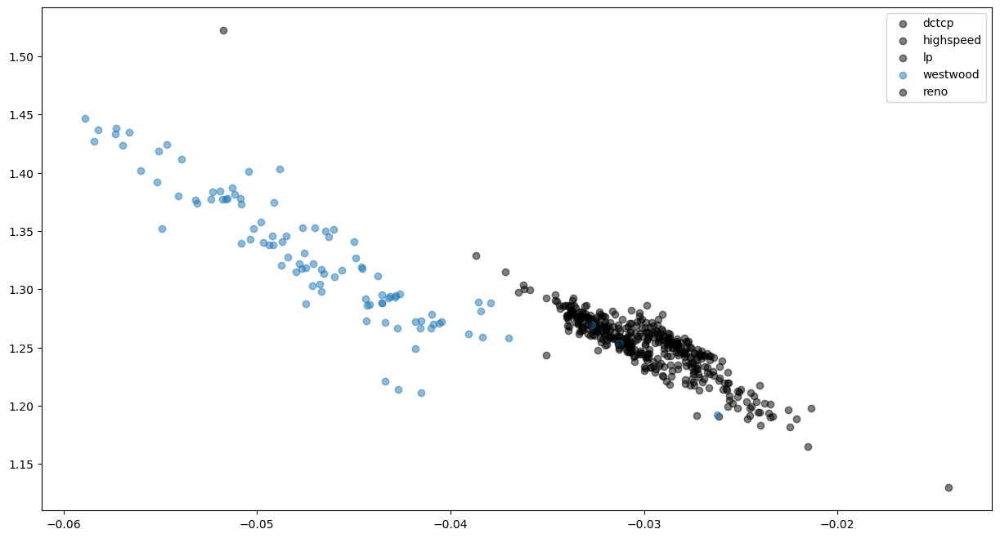

In [445]:
fig, ax = plt.subplots(1,1, figsize=(15,8))
for cc in cc_degree:
    if cc_degree[cc] == 2:
        x_points = []
        y_points = []
        for points in vals[cc][1]:
            x_points.append(points[0])
            y_points.append(points[1])
        if cc in ["dctcp", "lp", "reno","highspeed"]:
            color = "k"
            ax.scatter(x_points, y_points, label=cc,alpha=0.5, color=color)
        else :
            ax.scatter(x_points, y_points, label=cc,alpha=0.5)
    plt.legend()

In [420]:
from mpl_toolkits.mplot3d import Axes3D

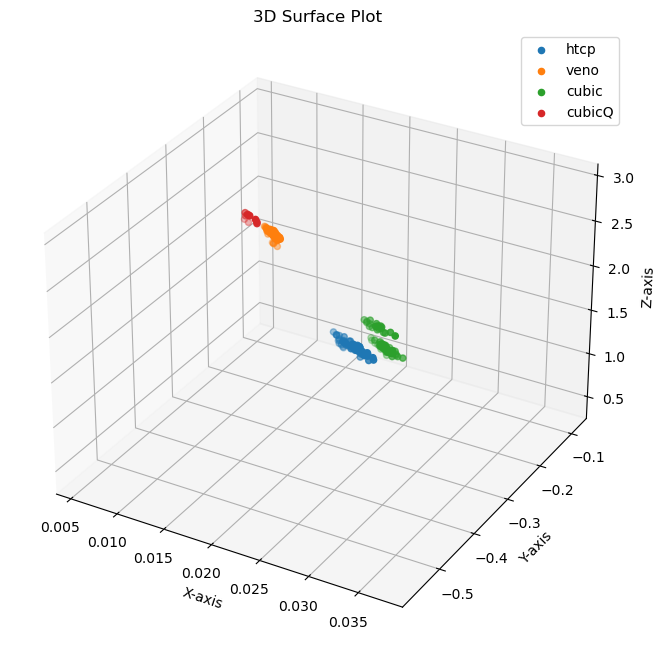

In [446]:
# Create a 3D figure
fig = plt.figure(figsize=(15,8))

# Create a 3D axis
ax = fig.add_subplot(111, projection='3d')

for cc in cc_degree:
    if cc == 'nv' or cc == 'vegas':
        continue
#     if cc != "cubic":
#         continue
    if cc_degree[cc] == 3:
        x_points = []
        y_points = []
        z_points = []
        for points in vals[cc][1]:
            x_points.append(points[0])
            y_points.append(points[1])
            z_points.append(points[2])
        x_points = np.array(x_points)
        y_points = np.array(y_points)
        z_points = np.array(z_points)
        surf = ax.scatter(x_points, y_points, z_points, label=cc)
plt.legend()
# Plot the 3D surface
# surf = ax.plot_surface(x, y, z, cmap='viridis')

# Add a color bar which maps values to colors
# fig.colorbar(surf)

# Set axis labels
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

# Set a title
plt.title('3D Surface Plot')

plt.show()

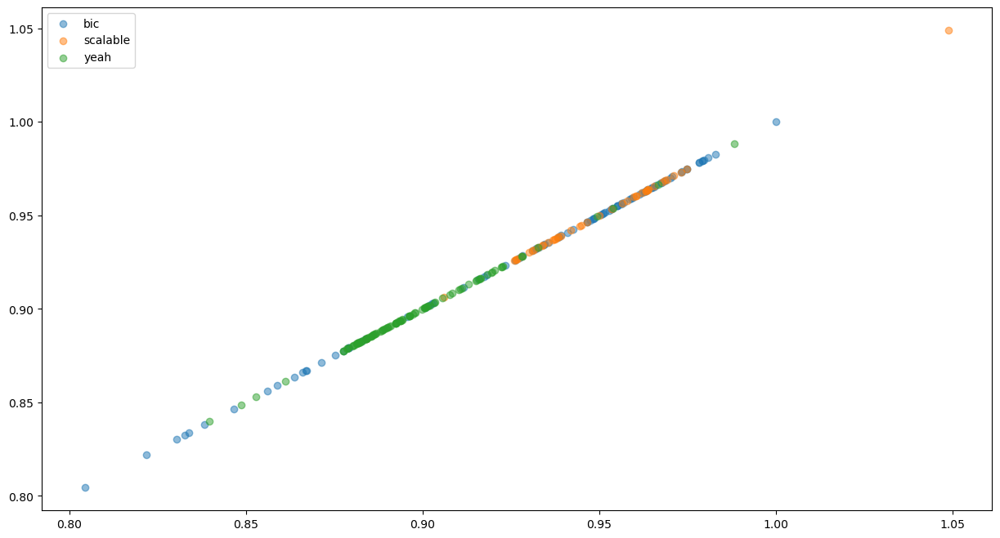

In [429]:
fig, ax = plt.subplots(1,1, figsize=(15,8))
for cc in cc_degree:
    if cc == 'cubicQ':
        continue
    if cc_degree[cc] == 1:
        x_points = []
        for points in vals[cc][1]:
            x_points.append(points[0])
        ax.scatter(x_points,x_points, label=cc,alpha=0.5)
    plt.legend()